#### Import Libraries.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter


In [2]:
import plotly.express as px
import plotly.graph_objects as go

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected = True)


#### Load .csv File for Analysis in Pandas

In [3]:
def open_csv_file(file_path):
    try:
        pd.read_csv(file_path)
    except FileNotFoundError: 
        print('Invalid file path.')

    else:
        return pd.read_csv(file_path)
        

In [4]:
file_path = r"D:\Python\Stack 2024\survey_results_public.csv"

df = open_csv_file(file_path)

In [5]:
pd.set_option('display.max_columns', None)

In [6]:
pd.set_option('display.max_rows', None)

In [7]:
pd.options.mode.copy_on_write = True

In [8]:
df.head()

,ResponseId,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,TechDoc,YearsCode,YearsCodePro,DevType,OrgSize,PurchaseInfluence,BuyNewTool,BuildvsBuy,TechEndorse,Country,Currency,CompTotal,LanguageHaveWorkedWith,LanguageWantToWorkWith,LanguageAdmired,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,DatabaseAdmired,PlatformHaveWorkedWith,PlatformWantToWorkWith,PlatformAdmired,WebframeHaveWorkedWith,WebframeWantToWorkWith,WebframeAdmired,EmbeddedHaveWorkedWith,EmbeddedWantToWorkWith,EmbeddedAdmired,MiscTechHaveWorkedWith,MiscTechWantToWorkWith,MiscTechAdmired,ToolsTechHaveWorkedWith,ToolsTechWantToWorkWith,ToolsTechAdmired,NEWCollabToolsHaveWorkedWith,NEWCollabToolsWantToWorkWith,NEWCollabToolsAdmired,OpSysPersonal use,OpSysProfessional use,OfficeStackAsyncHaveWorkedWith,OfficeStackAsyncWantToWorkWith,OfficeStackAsyncAdmired,OfficeStackSyncHaveWorkedWith,OfficeStackSyncWantToWorkWith,OfficeStackSyncAdmired,AISearchDevHaveWorkedWith,AISearchDevWantToWorkWith,AISearchDevAdmired,NEWSOSites,SOVisitFreq,SOAccount,SOPartFreq,SOHow,SOComm,AISelect,AISent,AIBen,AIAcc,AIComplex,AIToolCurrently Using,AIToolInterested in Using,AIToolNot interested in Using,AINextMuch more integrated,AINextNo change,AINextMore integrated,AINextLess integrated,AINextMuch less integrated,AIThreat,AIEthics,AIChallenges,TBranch,ICorPM,WorkExp,Knowledge_1,Knowledge_2,Knowledge_3,Knowledge_4,Knowledge_5,Knowledge_6,Knowledge_7,Knowledge_8,Knowledge_9,Frequency_1,Frequency_2,Frequency_3,TimeSearching,TimeAnswering,Frustration,ProfessionalTech,ProfessionalCloud,ProfessionalQuestion,Industry,JobSatPoints_1,JobSatPoints_4,JobSatPoints_5,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly,JobSat
0,1,I am a developer by profession,Under 18 years old,"Employed, full-time",Remote,Apples,Hobby,Primary/elementary school,Books / Physical media,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,United States of America,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,I have never visited Stack Overflow or the Sta...,NaN,NaN,NaN,NaN,NaN,Yes,Very favorable,Increase productivity,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,API document(s) and/or SDK document(s);User gu...,20,17,"Developer, full-stack",NaN,NaN,NaN,NaN,NaN,United Kingdom of Great Britain and Northern I...,NaN,NaN,Bash/Shell (all shells);Go;HTML/CSS;Java;JavaS...,Bash/Shell (all shells);Go;HTML/CSS;Java;JavaS...,Bash/Shell (all shells);Go;HTML/CSS;Java;JavaS...,Dynamodb;MongoDB;PostgreSQL,PostgreSQL,PostgreSQL,Amazon Web Services (AWS);Heroku;Netlify,Amazon Web Services (AWS);Heroku;Netlify,Amazon Web Services (AWS);Heroku;Netlify,Express;Next.js;Node.js;React,Express;Htmx;Node.js;React;Remix,Express;Node.js;React,NaN,NaN,NaN,NaN,NaN,NaN,Docker;Homebrew;Kubernetes;npm;Vite;Webpack,Docker;Homebrew;Kubernetes;npm;Vite;Webpack,Docker;Homebrew;Kubernetes;npm;Vite;Webpack,PyCharm;Visual Studio Code;WebStorm,PyCharm;Visual Studio Code;WebStorm,PyCharm;Visual Studio Code;WebStorm,MacOS;Windows,MacOS,NaN,NaN,NaN,Microsoft Teams;Slack,Slack,Slack,NaN,NaN,NaN,Stack Overflow for Teams (private knowledge sh...,Multiple times per day,Yes,Multiple times per day,Quickly finding code solutions;Finding reliabl...,"Yes, definitely","No, and I don't plan to",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,Individual contributor,17.0,Agree,Disagree,Agree,Agree,Agree,Neither agree nor disa

In [9]:
schema_file_path = r"D:\Python\Stack 2024\survey_results_schema.csv"
schema_df = open_csv_file(schema_file_path)
schema_df.set_index('question')

,qid,qname,force_resp,type,selector
question,,,,,
"Which of the following options best describes you today? For the purpose of this survey, a developer is ""someone who writes code"".*",QID2,MainBranch,True,MC,SAVR
What is your age?*,QID127,Age,True,MC,SAVR
Which of the following best describes your current employment status? Select all that apply.*,QID296,Employment,True,MC,MAVR
Which best describes your current work situation?,QID308,RemoteWork,False,MC,SAVR
Just checking to make sure you are paying attention to the survey questions. Select ‘Apples’ from the list and you can get back to the survey.*<br><br>,QID341,Check,True,MC,SAVR
Which of the following best describes the code you write outside of work? Select all that apply.,QID297,CodingActivities,False,MC,MAVR
Which of the following best describes the highest level of formal education that you’ve completed? *,QID25,EdLevel,True,MC,SAVR
How do you learn to code? Select all that apply.,QID276,LearnCode,False,MC,MAVR
What online resources do you use to learn to code? Select all that apply.,QID281,LearnCodeOnline,False,MC,MAVR


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65437 entries, 0 to 65436
Columns: 114 entries, ResponseId to JobSat
dtypes: float64(13), int64(1), object(100)
memory usage: 56.9+ MB


In [11]:
df.describe()

,ResponseId,CompTotal,WorkExp,JobSatPoints_1,JobSatPoints_4,JobSatPoints_5,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,ConvertedCompYearly,JobSat
count,65437.000000,3.374000e+04,29658.000000,29324.000000,29393.000000,29411.000000,29450.000000,29448.00000,29456.000000,29456.000000,29450.000000,29445.000000,2.343500e+04,29126.000000
mean,32719.000000,2.963841e+145,11.466957,18.581094,7.522140,10.060857,24.343232,22.96522,20.278165,16.169432,10.955713,9.953948,8.615529e+04,6.935041
std,18890.179119,5.444117e+147,9.168709,25.966221,18.422661,21.833836,27.089360,27.01774,26.108110,24.845032,22.906263,21.775652,1.867570e+05,2.088259
min,1.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,1.000000e+00,0.000000
25%,16360.000000,6.000000e+04,4.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,3.271200e+04,6.000000
50%,32719.000000,1.100000e+05,9.000000,10.000000,0.000000,0.000000,20.000000,15.00000,10.000000,5.000000,0.000000,0.000000,6.500000e+04,7.000000
75%,49078.000000,2.500000e+05,16.000000,22.000000,5.000000,10.000000,30.000000,30.00000,25.000000,20.000000,10.000000,10.000000,1.079715e+05,8.000000
max,65437.000000,1.000000e+150,50.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,1.625660e+07,10.000000


### 

### Functions used in Analysis

##### Selecting Columns of interest for Analysis

In [12]:
def make_data_frame(data_frame_columns, data_frame):
    """ Creates a data frame from the columns selected for analysis."""
    return data_frame[data_frame_columns]
    

##### Clean Data(Drop Nan Values) 

In [13]:
def clean_data(made_data_frame):
    """ Cleans a data frame by dropping null values. """
    return made_data_frame.dropna()
    

##### Create Analysis Categories ('Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents')

In [14]:
def get_category_of_interest(cleaned_data, category_filter='All Respondents'):
    """ Filters a data frame  to get the category of interest."""
    
    filter_criteria = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']
    try:
        if category_filter not in filter_criteria:
            raise ValueError('Invalid filter criteria provided.')

        if category_filter == 'Professional Developer':
            return cleaned_data.loc[cleaned_data[cleaned_data.columns[0]] == 'I am a developer by profession']

        elif category_filter == 'Learning to Code':
            return cleaned_data.loc[cleaned_data[cleaned_data.columns[0]] == 'I am learning to code']

        elif category_filter == 'Other Coders':
            return cleaned_data.loc[~(
                (cleaned_data[cleaned_data.columns[0]] == 'I am a developer by profession') |
                (cleaned_data[cleaned_data.columns[0]] == 'I am learning to code')
            )]

        else:
            return cleaned_data  

    except ValueError as e:
        print(e)
        return None  


##### Count Responses for an Item

In [15]:
def count_responses(category_of_interest_df):
    """ Counts responses, returns each response and the number it appears."""
    counter = Counter()
    for item in category_of_interest_df[category_of_interest_df.columns[1]]:
        if pd.notnull(item):
            counter.update(item.split(';'))
    return counter.most_common()

##### Convert Counter Output to a Data Frame

In [16]:
def convert_to_df(counted_responses, columns=None):
    """ Converts a series to a data frame with predefined column names."""
    if columns is None:
        columns = globals().get('report_headers', None)
    if columns is None:
        df = pd.DataFrame(counted_responses)  # No column headers
    else:
        # if len(counted_responses[0]) != len(columns):
        #    raise ValueError("The number of columns does not match the data length.")
        df = pd.DataFrame(counted_responses, columns=columns)
        
        df.index.name = None   # Remove index column label
    return df

##### Set the FIrst Column as Index

In [17]:
def set_dataframe_index(converted_df):
    """ Sets the first column of a  data frame as the index."""
    return converted_df.set_index(converted_df.columns[0]) 


##### Calculating Percentages

In [18]:
def calculate_percentages(indexed_data, total_responses):
    """ Calculate the number of responses as a percentage of respondents."""
    return round(indexed_data.div(total_responses) *100, 2)
    

##### Get Responses and Percentages Data Frame

In [19]:
def get_response_count_with_percentages(data_frame, data_frame_columns, report_headers, category_filter='filter criteria'):
    """ Gets responses, their count, and the count as a percentage of respondents number. """
    
    made_data_frame = make_data_frame(data_frame_columns, data_frame)

    cleaned_data = clean_data(made_data_frame)

    category_of_interest_df = get_category_of_interest(cleaned_data, category_filter)

    total_responses = len(category_of_interest_df)

    item_response_count = count_responses(category_of_interest_df)

    item_response_count_df = convert_to_df(item_response_count)

    indexed_item_response_count_df = set_dataframe_index(item_response_count_df)

    calculated_item_response_percentage = calculate_percentages(indexed_item_response_count_df, total_responses)

    item_response_count_percentage_df = pd.concat([indexed_item_response_count_df, calculated_item_response_percentage], axis=1)
    
    item_response_count_percentage_df.columns = list(indexed_item_response_count_df) + [f'% of {report_headers[1]}']

    return item_response_count_percentage_df
  

##### Get Item Counts per Data Frame Column

In [20]:
def get_item_counts_per_df_column(data_frame=df, data_frame_column=['column_name']):
    
    series = make_data_frame(data_frame_column, data_frame) 
    
    cleaned_data = clean_data(series)
    
    item_counts = cleaned_data.value_counts()
    
    return item_counts.to_frame()
    

##### Get Responses and Percentages for Multiple Columns

In [21]:

def get_a_data_frame_of_percentage_responses_in_many_columns(data_frame, data_frame_columns, new_columns_names, respondents_category):
    
    No_columns = len(data_frame_columns)
    
    columnn_combinations = [data_frame[[data_frame_columns[0], data_frame_columns[i]]] for i in range(1, No_columns)]
    
    cleaned_columns_combinations = [clean_data(columnn_combinations[i]) for i in range(len(columnn_combinations))]
    
    filtered_cleaned_columns_combinations= [
        get_category_of_interest(cleaned_columns_combinations[i], category_filter=respondents_category)
        for i in range(len(cleaned_columns_combinations))
    ]
    
    respondents_per_developer_category = [
        len(filtered_cleaned_columns_combinations[i])
        for i in range(len(filtered_cleaned_columns_combinations))
    ]
    response_counts_per_cat = [
        count_responses(filtered_cleaned_columns_combinations[i])
        for i in range(len(filtered_cleaned_columns_combinations))
    ]
    
    response_counts_per_cat_dfs = [convert_to_df(response_counts_per_cat[i]) for i in range(len(response_counts_per_cat))]
    
    response_indexed_dfs = [set_dataframe_index(response_counts_per_cat_dfs[i]) for i in range(len(response_counts_per_cat_dfs))]
    
    percentage_respondents = [
        calculate_percentages(df, totals)
        for df,totals in zip(response_indexed_dfs, respondents_per_developer_category)
    ]
    
    # Concatenating the data frames
    concatenated_percentages_df = pd.concat(percentage_respondents, axis='columns')
    
    concatenated_percentages_df.columns = new_columns_names

    concatenated_percentages_df.index.name = None
    
    return concatenated_percentages_df


##### Get a Pivot Table of Counts

In [22]:
def pivot_and_count(data_frame, data_frame_columns=None, grouping_columns=None):
    
    data = data_frame[data_frame_columns]
    
    cleaned_data = clean_data(data)
    
    grouped_data = cleaned_data.groupby(grouping_columns).size()
    
    return grouped_data.unstack()
    

##### Get Percentages based on Row Totals

In [23]:
def calculate_percentage_by_row_totals(pivoted_data_frame):
    
    row_totals = pivoted_data_frame.sum(axis=1)
    return round(pivoted_data_frame.div(row_totals, axis='rows')*100, 2)
    

##### Rename Columns Headers

In [24]:
def rename_column_header_percentage(data_frame):
    
    data_frame.columns=[f'% {i}' for i in data_frame.columns]
    return data_frame


##### Set Predefined Categorical Index

In [25]:
def sort_categorical_index(data_frame, index_order):
    
    data_frame.index = pd.CategoricalIndex(data_frame.index, categories=index_order, ordered=True)
    return data_frame.sort_index()
        

##### Get Percentages Pivoted by Columns

In [26]:
def percentages_pivoted_by_column(data_frame=df, data_frame_columns=None, grouping_columns=None):
    
    if data_frame_columns is None or grouping_columns is None:
        raise ValueError("You must provide both 'data_frame_columns' and 'grouping_columns'.")
        
    pivoted_data_frame = pivot_and_count(data_frame=df, data_frame_columns=data_frame_columns, grouping_columns=grouping_columns)
    
    calculated_row_percentages = calculate_percentage_by_row_totals(pivoted_data_frame)
    
    return rename_column_header_percentage(calculated_row_percentages)
    

##### Get Multi Indexed Data Frame (Developer Category)('Responses', ' % No Responses')

In [27]:

def get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories):
    
    all_responses =  [get_response_count_with_percentages(data_frame, data_frame_columns, report_headers, category_filter=respondent_category)
                      for respondent_category in respondents_categories]
    
    all_categories_combined = pd.concat(all_responses, axis='columns')
    
    headers = []
    for category in respondents_categories:
        headers.extend([(category, 'No Respondents'), (category, '% of No Respondents')])
    
    all_categories_combined.columns = pd.MultiIndex.from_tuples(headers)
    
    return all_categories_combined
    

##### Get Multi Indexed Data Frame (Developer Category)( % No Responses')

In [28]:

def get_multi_index_perce_combined_category_dfs(data_frame, data_frame_columns, new_columns_names):
    headers=[]
    
    # Initial implementation.
    # for category in respondents_categories:
       # headers.extend([(category,' % AI Search Worked With'),(category,'% AI Search Want to Worked With'),(category,' % AI Search Admired')])
    
    for category in respondents_categories:
        headers.extend([(category,name) for name in new_columns_names])
    
    perce_cats_dfs = [
        get_a_data_frame_of_percentage_responses_in_many_columns(data_frame, data_frame_columns, new_columns_names, respondents_category) 
        for respondents_category in respondents_categories
    ]
    
    combined_perce_cats_dfs = pd.concat(perce_cats_dfs, axis='columns')
    
    combined_perce_cats_dfs.columns = pd.MultiIndex.from_tuples(headers)
    
    return combined_perce_cats_dfs
        

##### Get a Unique list From a Column with Many Items in a "Cell"

In [29]:
def get_unique_column_items(data_frame, column_name, sep):
    """ 
    Return a unique list of objects in data frame column.
    Get columns of interest.
    split the element in the column based on the separator.
    Explode the lists from split then get the unique array.
    Clean the array.
    
    """
    column_series = data_frame[column_name]
    splited_column_items = column_series.str.split(sep)
    exploded_col = splited_column_items.explode()
    unique_series = exploded_col.unique()
    return unique_series[(pd.notna(unique_series)) & (unique_series != 'nan')]

##### Calculate Median Salary

In [30]:

def median_yr_sal_per_tech(data_frame, analysis_columns, report_col, tech_list):
    """
    Returns median salary for a each element of an array from unique elements of a dataframe column.
    Provide a unique array_list of elements in dataframe  column of interest.
    Make a data frame and clean the data(drop null rows.)
    For each element on the unique array_list, filter the made dataframe and calculate its median annual compensation.
    Make a list of unique array_list elements and their median salaries; convert it into df and sort accordingly.
    
    """
    median_sal_list = []
    for lang in tech_list:
        made_df = make_data_frame(analysis_columns, data_frame)
        cleaned_data = clean_data(made_df)
        filtered_df = get_category_of_interest(cleaned_data, category_filter='All Respondents')
        item_filtered_df = filtered_df.loc[filtered_df[filtered_df.columns[1]].str.contains(lang, regex=False)]
        median_sal = item_filtered_df[item_filtered_df.columns[2]].median()
        median_sal_list.append((lang, median_sal))
    
    return pd.DataFrame(median_sal_list, columns=report_col).sort_values(by = report_col[1], ascending=True).set_index(report_col[0]) 
    #.plot(kind='barh', figsize=(10,9))

##### Create Horizontal Bar Chart with Minimum Clutter in Matplolib

In [31]:

def create_custom_barh(x_values, y_values, ch_title="", lab_txt_pre='%', figsize=(8,3), text_color='black', face_color='snow', bar_color='dodgerblue'):
    """ Returns a clean horizontal bar chart. """
    # Create figure and horizontal bars
    fig, ax = plt.subplots(figsize=figsize, dpi=150, facecolor=face_color)
    ax.barh(x_values, y_values, color=bar_color)
    
    # Add labels to the bars
    if lab_txt_pre == "%":
        for container in ax.containers:
            ax.bar_label(container, labels=[f" {v:,.2f} {lab_txt_pre}" for v in container.datavalues], label_type='edge', fontsize=6, color=text_color)

    elif lab_txt_pre == "$":
        for container in ax.containers:
            ax.bar_label(container, labels=[f" {lab_txt_pre} {v:,.1f} " for v in container.datavalues], label_type='edge', fontsize=6, color=text_color)

    else:
        for container in ax.containers:
            ax.bar_label(container, labels=[f" {v}" for v in container.datavalues], label_type='edge', fontsize=6, color=text_color)
    
    
    # Hide borders from the chart
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)

    # Calculate the length of the longest y-tick label
    longest_label = max([len(str(label)) for label in x_values])

    # Dynamically adjust the left margin based on the longest y-tick label
    left_margin_extension = longest_label * 0.0095  # Adjust multiplier for desired space
    
    # Add dashed lines between horizontal bars using figure-relative coordinates
    for y in np.arange(len(x_values) - 1) + 0.5:
        ax.plot([-left_margin_extension, 1], [y, y], color='lightgray', linestyle='--', linewidth=0.5, transform=ax.get_yaxis_transform(), clip_on=False)
    
    # Extend the x-limits of the dashed lines to match the labels and make sure bars are fully visible
    ax.set_xlim(left=0, right=max(y_values) * 1.1)
    
    # Adjust the plot to give space for the lines to extend past the y-tick labels
    ax.margins(x=0.2)  # Increase left margin
    
    # Hide axes tick marks
    ax.tick_params(axis='y', which='both', left=False, right=False)
    ax.set_xticks([])
    
    # Set the background color of the plot area
    ax.set_facecolor(face_color)
    
    # Set and format title.
    ax.set_title(ch_title, fontsize=8, weight='bold', color=text_color)
    
    # Set the yticks explicitly and then set the labels
    ax.set_yticks(np.arange(len(x_values)))
    ax.set_yticklabels(x_values, fontsize=6, color=text_color)
    
    # Ensure layout is adjusted properly
    plt.tight_layout()


##### Make Horizontal Bars from Multi Indexed Data Frame with Button to Switch btwn Categories

In [32]:
def plot_multi_indexed_df(data_frame, worked_with_col, ch_title, height=1500, width=1100, plot_bgcolor="white", paper_bgcolor="lightgray",
                          marker_color='dodgerblue'):
    
    # Get the unique respondent categories (these should be level 0 if MultiIndex exists)
    groups = data_frame.columns.get_level_values(0).unique()
    
    # We are interested only in '% Language Worked With'
    worked_with_col = worked_with_col
    
    # Create an empty figure
    fig = go.Figure()
    
    # Create traces for each group (respondents category) for '% Language Worked With'
    for group in groups:
        # Select data for the current group
        df_group = data_frame[group][worked_with_col]
        
        # Add a trace for the horizontal bar chart
        fig.add_trace(go.Bar(
            x=df_group[::-1],  # Horizontal bar, so x is the data
            y=df_group.index[::-1],  # y-axis is the languages
            text=df_group[::-1],
            texttemplate='%{text:.2f} %',
            textposition='auto',
            marker_color=marker_color,
            name=f'{group}',
            orientation='h',  # Horizontal bar chart
            visible=(group == groups[0]),  # Show only the first group initially
            marker=dict(cornerradius=2.5),
            hovertemplate=(
                f'<i>Category</i>: {group}<br>'  # Show category (respondent group)
                '<i>Percentage</i>: %{x:.1f}%<br>'  # Show the percentage
                '<i>Item</i>: %{y}'  # Show the item (y-axis)
            )
            # hovertemplate='<i>Respondents</i> : %{x:.1f}%'+'<br><i>item</i> : %{y}'
        ))
    
    # Create buttons for toggling visibility between groups
    buttons = []
    for i, group in enumerate(groups):
        visibility = [False] * len(groups)
        visibility[i] = True  # Make only the current group's trace visible
        
        button = dict(
            method="update",
            label=group,
            args=[{"visible": visibility}],  # Show only the current trace
        )
        buttons.append(button)
    
    # Update the layout with individual buttons instead of dropdown
    fig.update_layout(
        updatemenus=[{
            "type": "buttons",
            "buttons": buttons,
            "direction": "right",
            "x": 0.0, 
            "xanchor": "left",
            "y": 1.015,  # Position buttons above the chart
            "yanchor": "bottom",
            "pad": {"r": 10, "t": 10}  # Padding around the buttons
        }],
        xaxis=dict(showticklabels=False, showgrid=False, zeroline=False),
        yaxis=dict(showticklabels=True, showgrid=False, zeroline=True),
        width=width,
        height=height,
        margin=dict(t=100,b=0,l=10,r=0),  # Adjust the top margin to fit the buttons
        plot_bgcolor=plot_bgcolor,  # Set the plot background color
        paper_bgcolor=paper_bgcolor  # Set the chart background color
    )
    
    fig.update_layout(
    title={
        'text': ch_title,  # Title text underlined
        'y': 0.990,  # Vertical position
        'x': 0.005,  # Horizontal position (centered)
        'xanchor': 'left',  # X anchor position
        'yanchor': 'top',  # Y anchor position
        'font': {'size': 15, 'color': 'black', 'family': 'sans-serif', 'weight': 'bold'},  # Bold title
    }
    )
    fig.show()


##### Create horizontal stacked bars from a Data Frame in Plotly

In [33]:


def make_plotly_horizontal_stacked_bars_from_df(data_frame, ch_title, paper_bgcolor="mintcream", plot_bgcolor="mintcream", width=1100, height=700):
    
    fig = px.bar(
        data_frame, x=data_frame.columns, y=data_frame.index, orientation="h",
        color_discrete_sequence=['rgba(38, 24, 74, 0.8)', 'rgba(71, 58, 131, 0.8)', 'rgba(122, 120, 168, 0.8)', 'rgba(164, 163, 204, 0.85)',
        'rgba(190, 192, 213, 1)'],
        text_auto=True,
        # color_discrete_sequence=px.colors.qualitative.Plotly
    )
    
    fig.update_layout(
        legend=dict(
            orientation="h",  # Horizontal legend
            x=-0.45,            # Center the legend horizontally
            y=1.1,           # Position the legend below the chart
            xanchor='left',  # Anchor the legend from the center
            yanchor='top',      # Anchor the y-position from the top
        ),
        
        margin = dict(t=150, l=0, r=0, b=0),
        width=1100,
        height=700,
        autosize=True,
        paper_bgcolor=paper_bgcolor,
        plot_bgcolor=plot_bgcolor,  # Set the plot background color
        
        title=dict(
            text=ch_title,  # Title text 
            y=0.95,  # Vertical position
            x=0.02,  # Horizontal position (centered)
            xanchor='left',  # X anchor position
            yanchor='top',  # Y anchor position
            font=dict(size=15, color='black', family='sans-serif', weight='bold')  # Bold title
        )
    )
       
    fig.update_layout(
        legend_title_text=''  # Set legend title to an empty string
    )
    
    fig.update_yaxes(title='', showticklabels=True)
    
    fig.update_xaxes(title='', showticklabels=False)
    
    fig.show()

##### Make Pie or Doughnut charts(Possible to Pull Pie of Interest)

In [34]:

def doughtnut_plot(labels, values, ch_title, hole=0.5, pull_section=1, offset=0.2, width=1100, height=800):
    
    pull=[0]*len(labels)
    if pull_section not in range(len(labels)):
        raise Exception(f"Sorry, please enter an interger  0 <= pull_section <= {len(labels)-1}.")
    else:
        pull[pull_section]=offset
    
    fig = go.Figure(data = [go.Pie(labels=labels, values=values, hole=hole, insidetextorientation='radial', pull=pull,
                                   hoverinfo='label+percent+value',  # Control what default hover info to show
                                   hovertemplate='<i>item</i>: %{label}<br><i>Percentage</i>: %{percent}<br><i>Value</i>: %{value}<extra></extra>'
                                  )]
                   )
    
    fig.update_layout(
        title={
            'text': ch_title,  # Title text.
            'y': 0.95,  # Vertical position
            'x': 0.02,  # Horizontal position (centered)
            'xanchor': 'left',  # X anchor position
            'yanchor': 'top',  # Y anchor position
            'font': {'size': 15, 'color': 'black', 'family': 'sans-serif', 'weight': 'bold'},  # Bold title
        },
        
        width=width, height=height,  # Chart size
        margin=dict(t=50, b=0, l=0, r=0), # Remove margins
        paper_bgcolor="mintcream",  # Set the chart background color
    
        legend=dict(
            orientation="h",  # Horizontal legend
            x=0.5,            # Center the legend horizontally
            y=-0.01,           # Position the legend below the chart
            xanchor='center',  # Anchor the legend from the center
            yanchor='top'      # Anchor the y-position from the top
        )
    )
    
    fig.show()

#### 

#### Which of the following options best describes you today? For the purpose of this survey, a developer is "someone who writes code" 

In [35]:

respondents_des = get_item_counts_per_df_column(data_frame=df, data_frame_column=['MainBranch'])
respondents_des.style.format("{:.0f}").bar(cmap='tab20c')

,count
MainBranch,
I am a developer by profession,50207
"I am not primarily a developer, but I write code sometimes as part of my work/studies",6511
I am learning to code,3875
I code primarily as a hobby,3334
"I used to be a developer by profession, but no longer am",1510


#### What is your age?

In [36]:

data_frame = df
data_frame_columns = ['MainBranch', 'Age']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

respondents_age_groups = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
all_respondents_age = respondents_age_groups['All Respondents']

In [37]:
index_order = ['Under 18 years old','18-24 years old','25-34 years old','35-44 years old','45-54 years old','55-64 years old','65 years or older',
               'Prefer not to say']

all_repondents_age = sort_categorical_index(all_respondents_age, index_order)

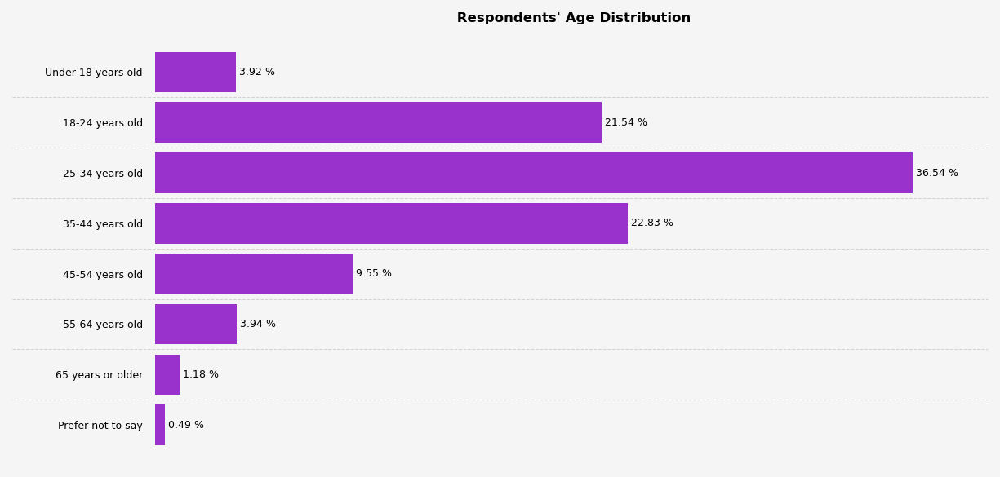

In [38]:
x_values = all_repondents_age.index[::-1]
y_values = all_repondents_age['% of No Respondents'].iloc[::-1]

create_custom_barh(x_values, y_values, figsize=(8,4), ch_title=" Respondents' Age Distribution", face_color='whitesmoke', bar_color='darkorchid')

#### Which of the following best describes the highest level of formal education that you’ve completed?

In [39]:

data_frame = df
data_frame_columns = ['MainBranch', 'EdLevel']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

respondents_ed_level = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
all_respondents_ed_level = respondents_ed_level['All Respondents']


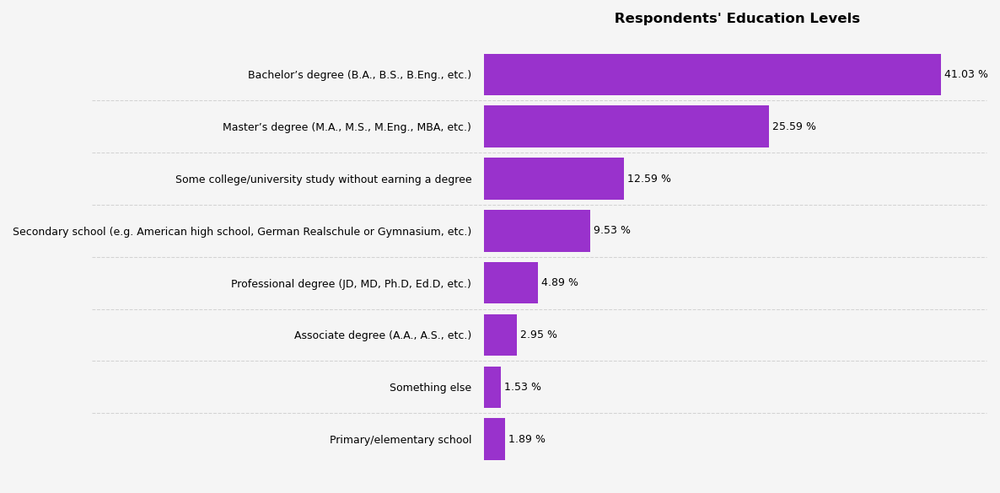

In [40]:
x_values = all_respondents_ed_level.index[::-1]
y_values = all_respondents_ed_level['% of No Respondents'].iloc[::-1]

create_custom_barh(x_values, y_values, figsize=(8,4), ch_title=" Respondents' Education Levels", face_color='whitesmoke', bar_color='darkorchid')

In [41]:

data_frame = df
data_frame_columns = ['MainBranch', 'EdLevel']
report_headers=[' ', 'No Respondents']

respondents_education = get_response_count_with_percentages(data_frame, data_frame_columns, report_headers, category_filter='All Respondents').head(10)
respondents_education.style.format("{:.2f}").bar(subset='% of No Respondents', cmap='tab20c')

,No Respondents,% of No Respondents
,,
"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",24942.00,41.03
"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",15557.00,25.59
Some college/university study without earning a degree,7651.00,12.59
"Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)",5793.00,9.53
"Professional degree (JD, MD, Ph.D, Ed.D, etc.)",2970.00,4.89
"Associate degree (A.A., A.S., etc.)",1793.00,2.95
Primary/elementary school,1146.00,1.89
Something else,932.00,1.53


#### Which of the following best describes the code you write outside of work?

In [42]:

data_frame = df
data_frame_columns = ['MainBranch', 'CodingActivities']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

respondents_coding_activities = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
all_respondents_coding_activities = respondents_coding_activities['All Respondents']


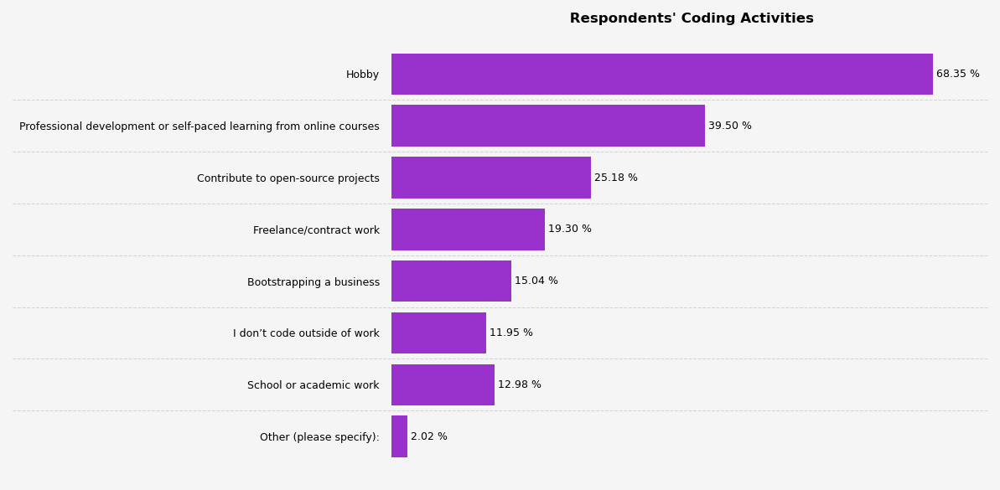

In [43]:
x_values = all_respondents_coding_activities.index[::-1]
y_values = all_respondents_coding_activities['% of No Respondents'].iloc[::-1]

create_custom_barh(x_values, y_values, figsize=(8,4), ch_title=" Respondents' Coding Activities", face_color='whitesmoke', bar_color='darkorchid')

#### Which of the following describes your current job, the one you do most of the time?

In [44]:

data_frame = df
data_frame_columns = ['MainBranch', 'DevType']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

respondents_current_job = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
all_respondents_current_job = respondents_current_job['All Respondents'].sort_values(by = '% of No Respondents', ascending=False)

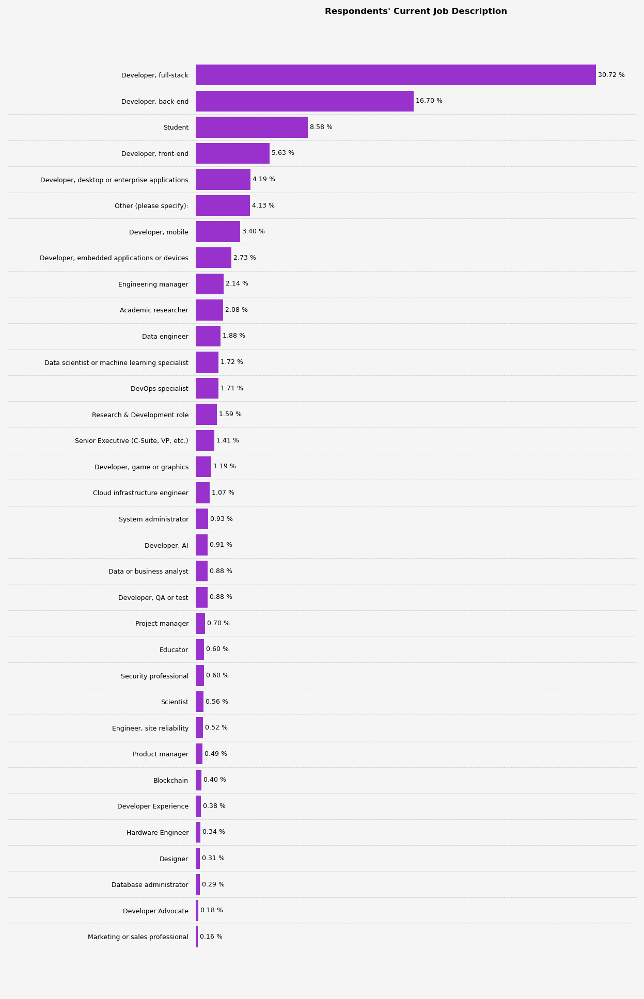

In [45]:
x_values = all_respondents_current_job.index[::-1]
y_values = all_respondents_current_job['% of No Respondents'].iloc[::-1]

create_custom_barh(x_values, y_values, ch_title="Respondents' Current Job Description", figsize=(8,13), face_color='whitesmoke', bar_color='darkorchid')

#### NOT including education, how many years have you coded professionally (as a part of your work)? 

In [46]:

cleaned_pro_years_code = clean_data(df[['MainBranch', 'YearsCodePro']])
# filtered_set = get_category_of_interest(cleaned_pro_years_code, category_filter='All Respondents')
cleaned_pro_years_code.loc[cleaned_pro_years_code['YearsCodePro'] == 'Less than 1 year', 'YearsCodePro'] = '0'
cleaned_pro_years_code.loc[cleaned_pro_years_code['YearsCodePro'] == 'More than 50 years', 'YearsCodePro'] = '50'
cleaned_pro_years_code['YearsCodePro'] = pd.to_numeric(cleaned_pro_years_code['YearsCodePro'])

bin_size = 5
max_val = max(cleaned_pro_years_code['YearsCodePro'])+bin_size


labels = ["{0} - {1} Years".format(i, i + bin_size - 1) for i in range(0, max_val - bin_size, bin_size)]
labels.append(f"{max_val-bin_size}+ Years")

categorised_set = cleaned_pro_years_code.assign(
    groups=pd.cut(cleaned_pro_years_code['YearsCodePro'], bins=list(range(0, max_val, bin_size)) + [max_val], labels=labels, include_lowest=True, right=False)
)


In [47]:
data_frame = categorised_set
data_frame_columns = ['MainBranch', 'groups']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

respondents_age_groups = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)

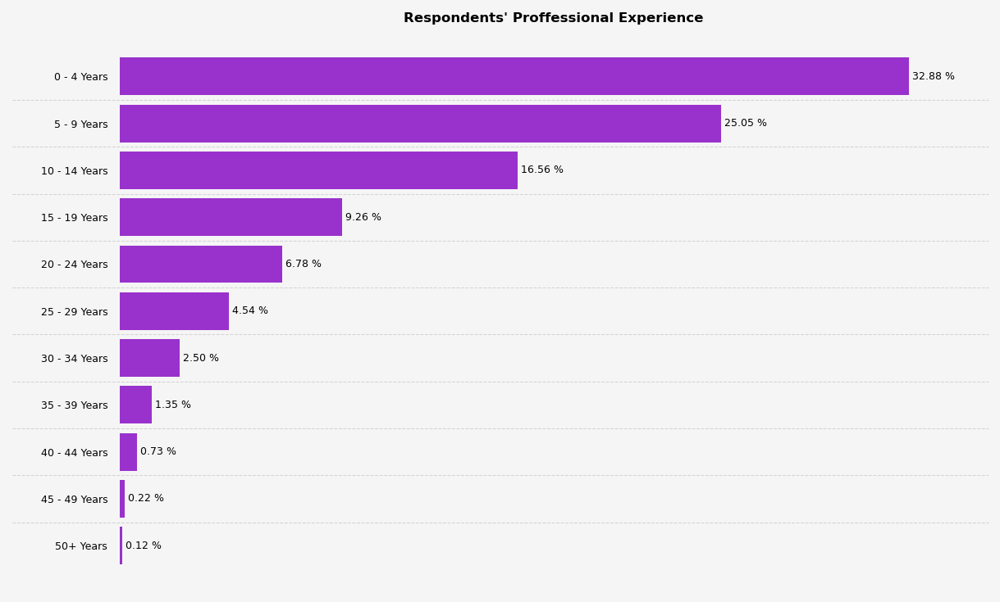

In [48]:
x_values = respondents_age_groups['All Respondents'].index[::-1]
y_values = respondents_age_groups['All Respondents']['% of No Respondents'].iloc[::-1]

create_custom_barh(x_values, y_values, ch_title="Respondents' Proffessional Experience", figsize=(8,5), face_color='whitesmoke', bar_color='darkorchid')

#### Which of the following best describes your current employment status?

In [49]:

data_frame = df
data_frame_columns = ['MainBranch', 'Industry']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

developer_industry = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
all_respondents_industry = developer_industry['All Respondents']


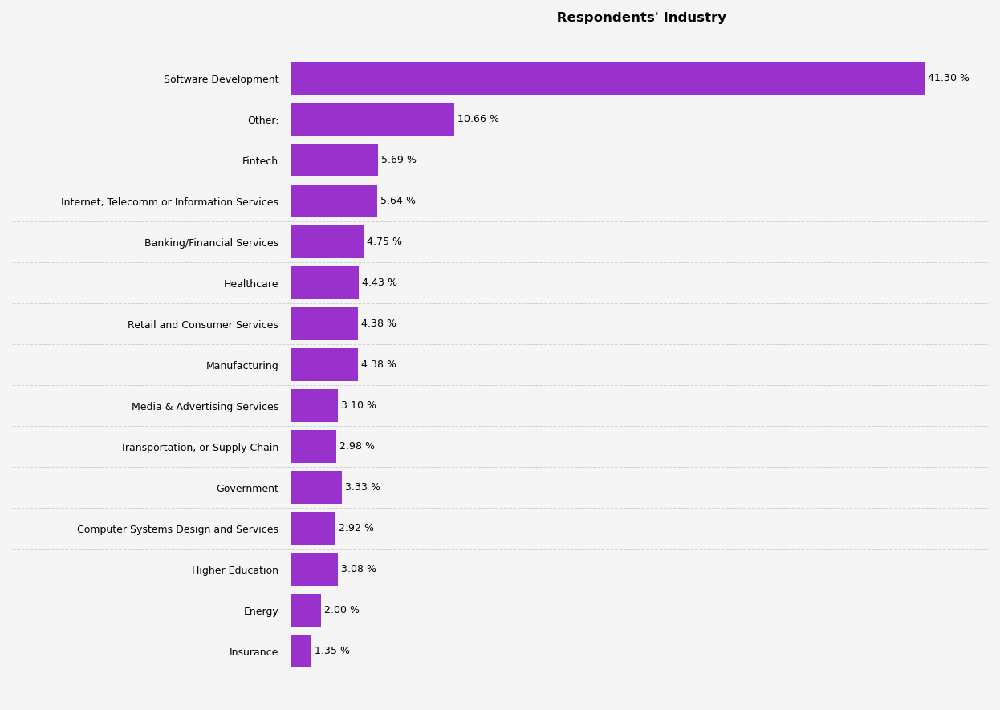

In [50]:
x_values = all_respondents_industry.index[::-1]
y_values = all_respondents_industry['% of No Respondents'].iloc[::-1]

create_custom_barh(x_values, y_values, figsize=(8,6), ch_title=" Respondents' Industry", face_color='whitesmoke', bar_color='darkorchid')

#### Which of the following best describes your current employment status?

In [51]:

data_frame = df
data_frame_columns = ['MainBranch', 'Employment']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

developer_work_status = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
all_respondents_work_status = developer_work_status['All Respondents']


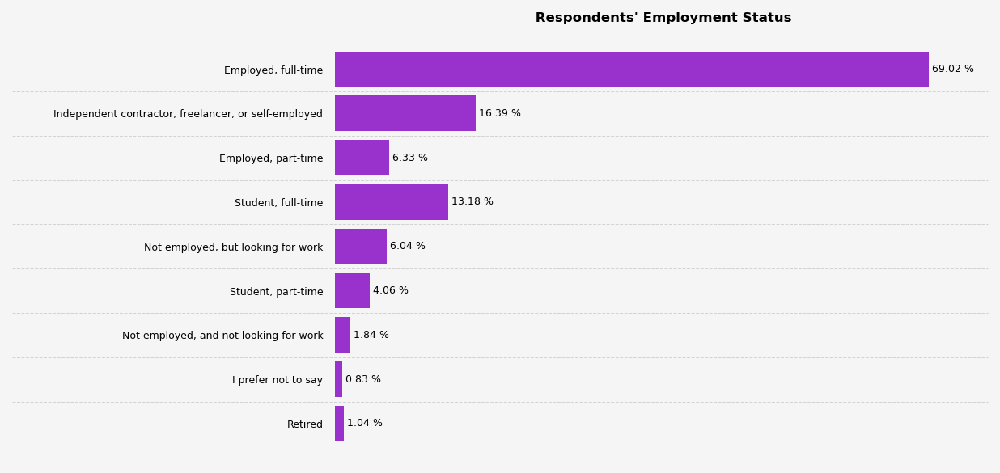

In [52]:
x_values = all_respondents_work_status.index[::-1]
y_values = all_respondents_work_status['% of No Respondents'].iloc[::-1]

create_custom_barh(x_values, y_values, figsize=(8,4), ch_title=" Respondents' Employment Status", face_color='whitesmoke', bar_color='darkorchid')

#### Which best describes your current work situation?

In [53]:

data_frame = df
data_frame_columns = ['MainBranch', 'RemoteWork']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

respondents_work_situation = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
all_respondents_work_situation = respondents_work_situation['All Respondents']


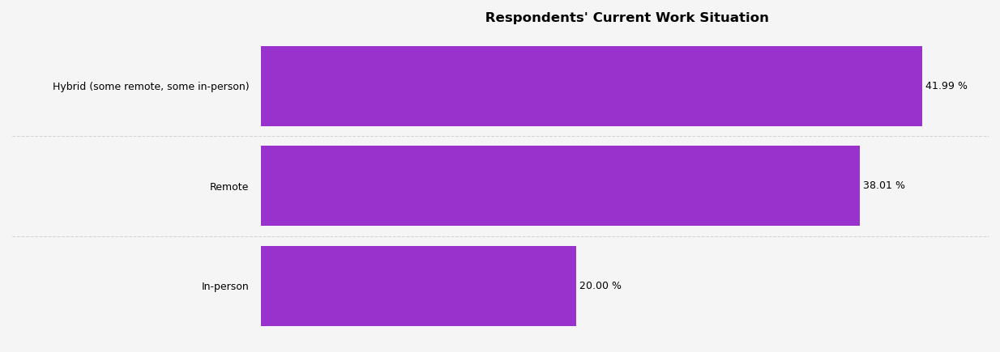

In [54]:
x_values = all_respondents_work_situation.index[::-1]
y_values = all_respondents_work_situation['% of No Respondents'].iloc[::-1]

create_custom_barh(x_values, y_values, figsize=(8,3), ch_title=" Respondents' Current Work Situation", face_color='whitesmoke', bar_color='darkorchid')

#### What level of influence do you, personally, have over new technology purchases at your organization?

In [55]:

data_frame = df
data_frame_columns = ['MainBranch', 'PurchaseInfluence']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

respondents_purchase_influ = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
all_respondents_purchase_influ = respondents_purchase_influ['All Respondents']


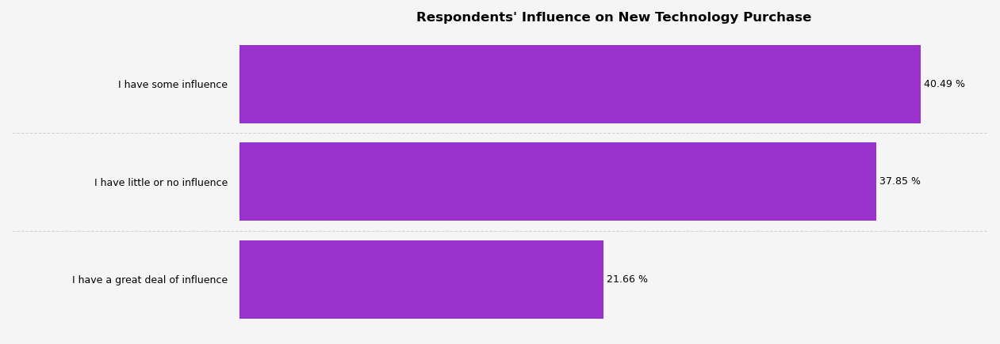

In [56]:
x_values = all_respondents_purchase_influ.index[::-1]
y_values = all_respondents_purchase_influ['% of No Respondents'].iloc[::-1]

create_custom_barh(x_values, y_values, ch_title="Respondents' Influence on New Technology Purchase", figsize=(8,3), face_color='whitesmoke', bar_color='darkorchid')

#### How do you learn to code?

In [57]:

data_frame = df
data_frame_columns = ['MainBranch', 'LearnCode']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

respondents_learn_code = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
respondents_learn_code


Professional Developer  \
                                                           No Respondents   
                                                                            
Other online resources (e.g., videos, blogs, fo...                  38321   
Books / Physical media                                              24081   
Online Courses or Certification                                     23675   
On the job training                                                 23595   
School (i.e., University, College, etc)                             23367   
Colleague                                                           12336   
Coding Bootcamp                                                      4872   
Friend or family member                                              4632   
Other (please specify):                                              2614   

                                                                        \
                                                   % of No Respondents   
                                                                         
Other online resources (e.g., videos, blogs, fo...               82.01   
Books / Physical media                                           51.53   
Online Courses or Certification                                  50.66   
On the job training                                              50.49   
School (i.e., University, College, etc)                          50.00   
Colleague                                                        26.40   
Coding Bootcamp                                                  10.43   
Friend or family member                                           9.91   
Other (please specify):                                           5.59   

                                                   Learning to Code  \
                                                     No Respondents   
                                                                      
Other online resources (e.g., videos, blogs, fo...             2637   
Books / Physical media                                         1291   
Online Courses or Certification                                1882   
On the job training                                             448   
School (i.e., University, College, etc)                        1723   
Colleague                                                       386   
Coding Bootcamp                                                 659   
Friend or family member                                         485   
Other (please specify):                                         182   

                                                                        \
                                                   % of No Respondents   
                                                                         
Other online resources (e.g., videos, blogs, fo...               80.23   
Books / Physical media                                           39.28   
Online Courses or Certification                                  57.26   
On the job training                                              13.63   
School (i.e., University, College, etc)                          52.42   
Colleague                                                        11.74   
Coding Bootcamp                                                  20.05   
Friend or family member                                          14.76   
Other (please specify):                                           5.54   

                                                     Other Coders  \
                                                   No Respondents   
                                                                    
Other online resources (e.g., videos, blogs, fo...           8696   
Books / Physical media                                       5020   
Online Courses or Certification                              4714   
On the job training                                          3201   
School (i.e.

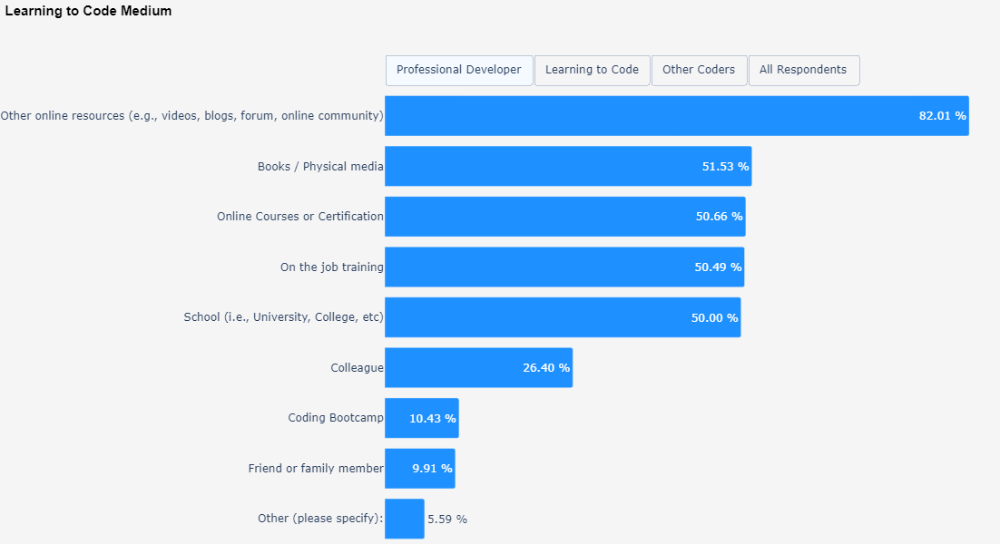

In [58]:
plot_multi_indexed_df(
    data_frame=respondents_learn_code, ch_title='Learning to Code Medium',worked_with_col='% of No Respondents', height=600, width=1100,
    plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke"
)

#### What online resources do you use to learn to code?

In [59]:

data_frame = df
data_frame_columns = ['MainBranch', 'LearnCodeOnline']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

respondents_learn_code_online = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)


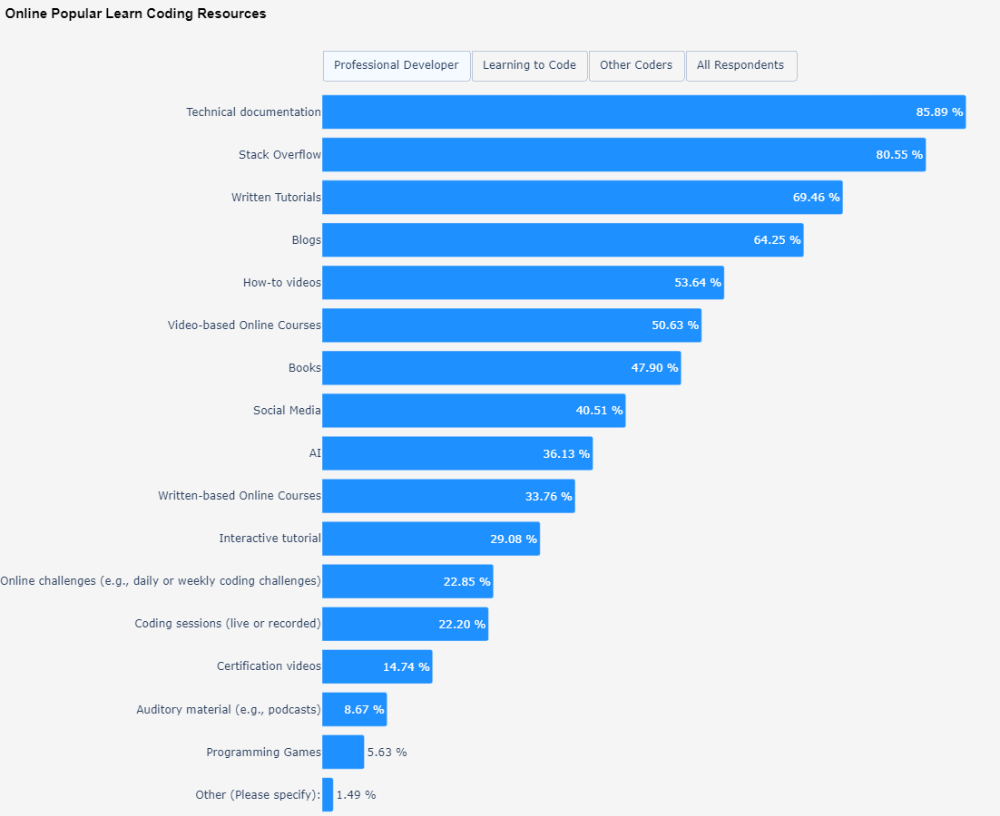

In [60]:
plot_multi_indexed_df(
    data_frame=respondents_learn_code_online, ch_title='Online Popular Learn Coding Resources', worked_with_col='% of No Respondents',
    height=900, width=1100,
    plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke"
)

#### What is the source of the technical documentation you use most often to learn to code?

In [61]:

data_frame = df
data_frame_columns = ['MainBranch', 'TechDoc']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

respondents_tech_doc_use = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)


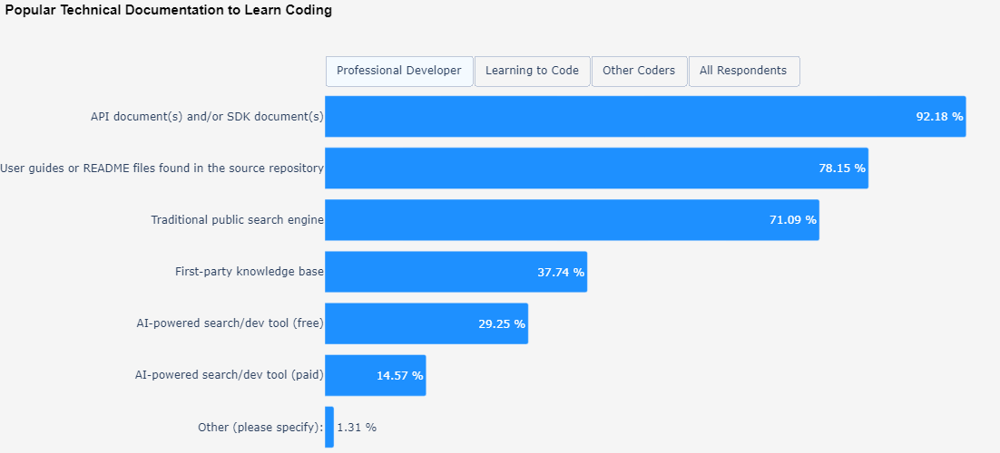

In [62]:
plot_multi_indexed_df(
    data_frame=respondents_tech_doc_use, ch_title='Popular Technical Documentation to Learn Coding', worked_with_col='% of No Respondents',
    height=500, width=1100,
    plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke"
)

#### When buying a new tool or software, how do you discover and research available solutions?

In [63]:

data_frame = df
data_frame_columns = ['MainBranch', 'BuyNewTool']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

respondents_buy_new_tool = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)


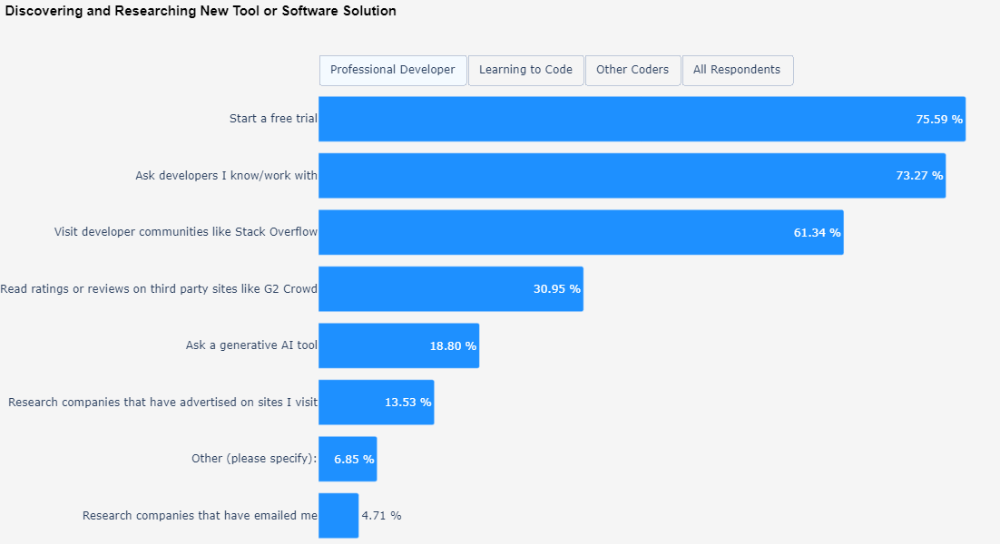

In [64]:
plot_multi_indexed_df(
    data_frame=respondents_buy_new_tool, ch_title='Discovering and Researching New Tool or Software Solution', worked_with_col='% of No Respondents',
    height=600, width=1100,
    plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke"
)

#### When asked to provide a recommendation for solving a problem at work with a new tool or software, what has been your most recent choice of the following?

In [65]:

data_frame = df
data_frame_columns = ['MainBranch', 'BuildvsBuy']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

respondents_buy_vs_build = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
all_respondents_buy_vs_build = respondents_buy_vs_build['All Respondents']


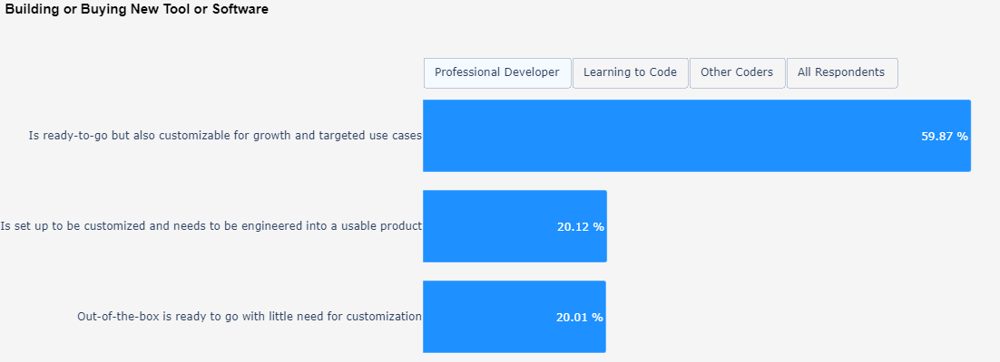

In [66]:
plot_multi_indexed_df(
    data_frame=respondents_buy_vs_build, ch_title='Building or Buying New Tool or Software', worked_with_col='% of No Respondents',
    height=400, width=1100,
    plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke"
)

#### What product feature do you care about most when endorsing a technology purchase?

In [67]:

data_frame = df
data_frame_columns = ['MainBranch', 'TechEndorse']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

respondents_feature_endorse = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
all_respondents_feature_endorse = respondents_feature_endorse['All Respondents']


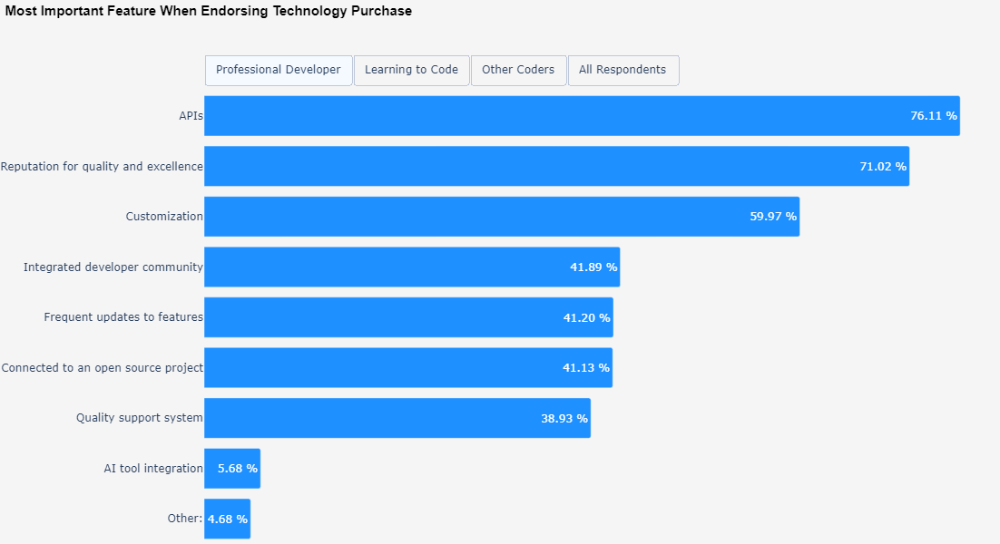

In [68]:
plot_multi_indexed_df(
    data_frame=respondents_feature_endorse, ch_title='Most Important Feature When Endorsing Technology Purchase', worked_with_col='% of No Respondents',
    height=600, width=1100,
    plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke"
)

#### Which programming, scripting, and markup languages have you done extensive development work in over the past year, and which do you want to work in over the next year? 

In [69]:

data_frame = df
data_frame_columns = ['MainBranch', 'LanguageHaveWorkedWith', 'LanguageWantToWorkWith', 'LanguageAdmired']

new_columns_names = [
    '% Language Worked With',
    '% Language Want to Work With',
    '% Language Admired'    
]

respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

languages_combined_df = get_multi_index_perce_combined_category_dfs(data_frame, data_frame_columns, new_columns_names)
languages_combined_df

Professional Developer                               \
                        % Language Worked With % Language Want to Work With   
JavaScript                               64.83                        43.09   
SQL                                      54.25                        41.68   
HTML/CSS                                 53.29                        37.07   
Python                                   47.58                        41.58   
TypeScript                               43.53                        39.35   
Bash/Shell (all shells)                  34.44                        23.94   
Java                                     30.59                        18.89   
C#                                       28.83                        24.05   
C++                                      20.85                        16.66   
PHP                                      18.73                        10.04   
C                                        17.58                        12.03   
Go                                       14.48                        26.02   
PowerShell                               13.99                         7.37   
Rust                                     12.00                        30.66   
Kotlin                                   10.05                        13.49   
Dart                                      6.13                         6.51   
Ruby                                      5.75                         4.98   
Lua                                       5.46                         5.12   
Swift                                     4.91                         6.94   
Assembly                                  4.30                         3.90   
Visual Basic (.Net)                       4.13                         1.37   
Groovy                                    3.77                         1.57   
R                                         3.19                         2.71   
VBA                                       3.13                         0.83   
MATLAB                                    3.06                         1.08   
Scala                                     2.89                         3.41   
Objective-C                               2.32                         1.10   
Perl                                      2.30                         1.09   
Elixir                                    2.29                         5.53   
GDScript                                  1.88                         2.46   
Delphi                                    1.82                         0.96   
Haskell                                   1.69                         3.51   
Lisp                                      1.30                         1.95   
Clojure                                   1.29                         2.41   
MicroPython                               1.12                         1.38   
Solidity                                  1.09                         1.63   
Erlang                                    0.92                         2.06   
Zig                                       0.92                         6.22   
F#                                        0.87                         2.39   
Fortran                                   0.82                         0.52   
Apex                                      0.80                         0.55   
Julia                                     0.78                         1.54   
Prolog                                    0.71                         0.58   
Ada                                       0.65                         0.70   
OCaml                                     0.59                         1.75   
Cobol                                     0.58                         0.51   
Crystal                                   0.34                         0.59   
Zephyr                                    0.27                         0.36   
Nim                                       0.24                         0.6

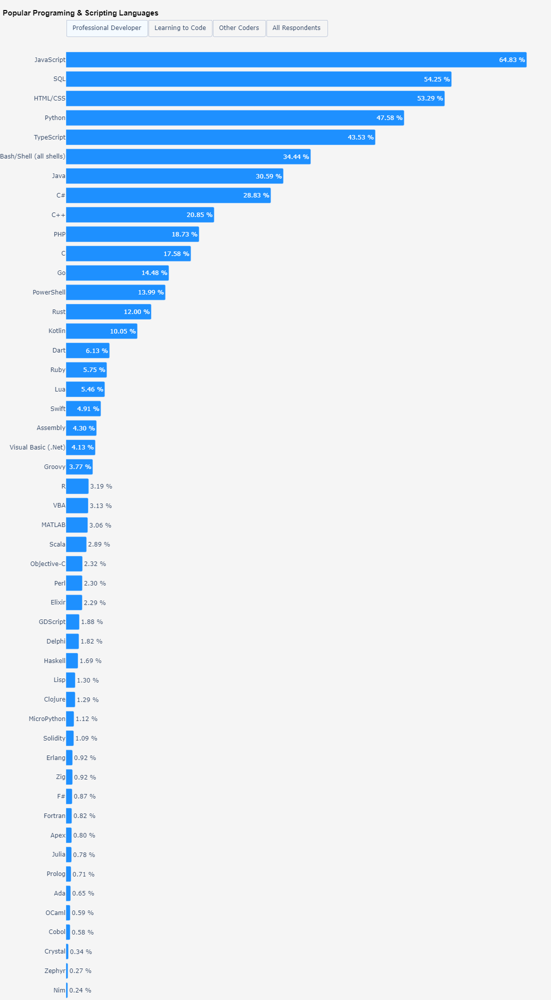

In [70]:
plot_multi_indexed_df(
    data_frame=languages_combined_df, ch_title='Popular Programing & Scripting Languages', worked_with_col='% Language Worked With',
    height=2000, width=1100,
    plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke"
)

In [71]:

def plot_dumbels_from_multi_index_df(data_frame, ch_title, height=1500, paper_bgcolor='mintcream', want_to="Want to Work With", admired="Admired"):
    
    groups = data_frame.columns.get_level_values(0).unique()
    cols = data_frame.columns.get_level_values(1).unique()[1:]  
    items = data_frame.index  
    
    fig = go.Figure()
    
    # Loop over each group and create scatter plots for each
    for i, group in enumerate(groups):
        data = dict(line_x=[], line_y=[], want_to_work_with=[], admired=[])
        
        # Loop over each item in the DataFrame
        for item in items:
            data['want_to_work_with'].append(data_frame.loc[item][group][cols[0]])
            data['admired'].append(data_frame.loc[item][group][cols[1]])
            data['line_x'].extend(
                [
                    data_frame.loc[item][group][cols[0]],
                    data_frame.loc[item][group][cols[1]],
                    None  # This ensures separation in line traces
                ]
            )
            data['line_y'].extend([item, item, None])  # Ensures horizontal line per item
        
        # Add line trace
        fig.add_trace(go.Scatter(
            x=data['line_x'][::-1],
            y=data['line_y'][::-1],
            name="",
            mode='lines',
            marker=dict(color='black', size=5),
            visible=(i == 0),  # Make only the first group's traces visible initially
            showlegend=False
        ))
    
        # Add 'want_to_work_with' scatter
        fig.add_trace(go.Scatter(
            x=data['want_to_work_with'][::-1],
            y=items[::-1],  # Use items instead of 'languages' for consistency
            name=want_to,
            mode='markers',
            marker=dict(color='dodgerblue', size=12),
            hovertemplate=('<i>item</i> : %{y}<br>'+'<i>Percentage</i> : %{x}%<extra></extra>'),
            visible=(i == 0)  # Make only the first group's traces visible initially
        ))
    
        # Add 'admired' scatter
        fig.add_trace(go.Scatter(
            x=data['admired'][::-1],
            y=items[::-1],  # Same here, using items
            name=admired,
            mode='markers',
            marker=dict(color='orange', size=12),
            hovertemplate=('<i>item</i> : %{y}<br>'+'<i>Percentage</i> : %{x}%<extra></extra>'),
            visible=(i == 0)  # Make only the first group's traces visible initially
        ))
    
    # Create buttons for each group
    buttons = []
    num_traces_per_group = 3  # 3 traces (lines, want_to_work_with, admired) per group
    for i, group in enumerate(groups):
        visibility = [False] * len(groups) * num_traces_per_group
        start_idx = i * num_traces_per_group
        visibility[start_idx:start_idx + num_traces_per_group] = [True, True, True]
        
        button = dict(
            method='update',
            label=group,
            args=[{'visible': visibility}]
        )
        buttons.append(button)
    
    # Add buttons to layout
    fig.update_layout(
        updatemenus=[
            dict(
                type='buttons',
                buttons=buttons,
                direction='right',
                x=0.00,
                xanchor='left',
                y=0.9995,
                yanchor='bottom',
                pad=dict(r=20, t=10)
            )
        ]
    )
    
    # Layout updates (legend, margins, background, etc.)
    fig.update_layout(
        margin=dict(t=70, b=5, r=20),
        width=1100,
        height=height,
        legend=dict(
            orientation="h",  # Horizontal legend
            x=0.1,            # Center the legend horizontally
            y=0.950,           # Position the legend above the chart
            xanchor='center',  # Anchor the legend from the center
            yanchor='bottom'   # Anchor the y-position from the top
        ),
        paper_bgcolor=paper_bgcolor,
        plot_bgcolor=paper_bgcolor,
        xaxis=dict(showgrid=False, zeroline=False)
    )

    fig.update_layout(
        yaxis=dict(
            showgrid=True,           # Ensure that the grid is visible
            gridcolor='white',    # Set the desired color for the horizontal grid lines
            gridwidth=1,              # Set the width of the grid lines
            griddash='dashdot'           # Make the grid lines dashed ('dash', 'dot', 'dashdot')
        )
    )

    fig.update_layout(
        title={
            'text': ch_title,  # Title text
            'y': 0.990,  # Vertical position
            'x': 0.005,  # Horizontal position (centered)
            'xanchor': 'left',  # X anchor position
            'yanchor': 'top',  # Y anchor position
            'font': {'size': 15, 'color': 'black', 'family': 'sans-serif', 'weight': 'bold'},  # Bold title
        }
        )
    
    # Show the figure
    fig.show()

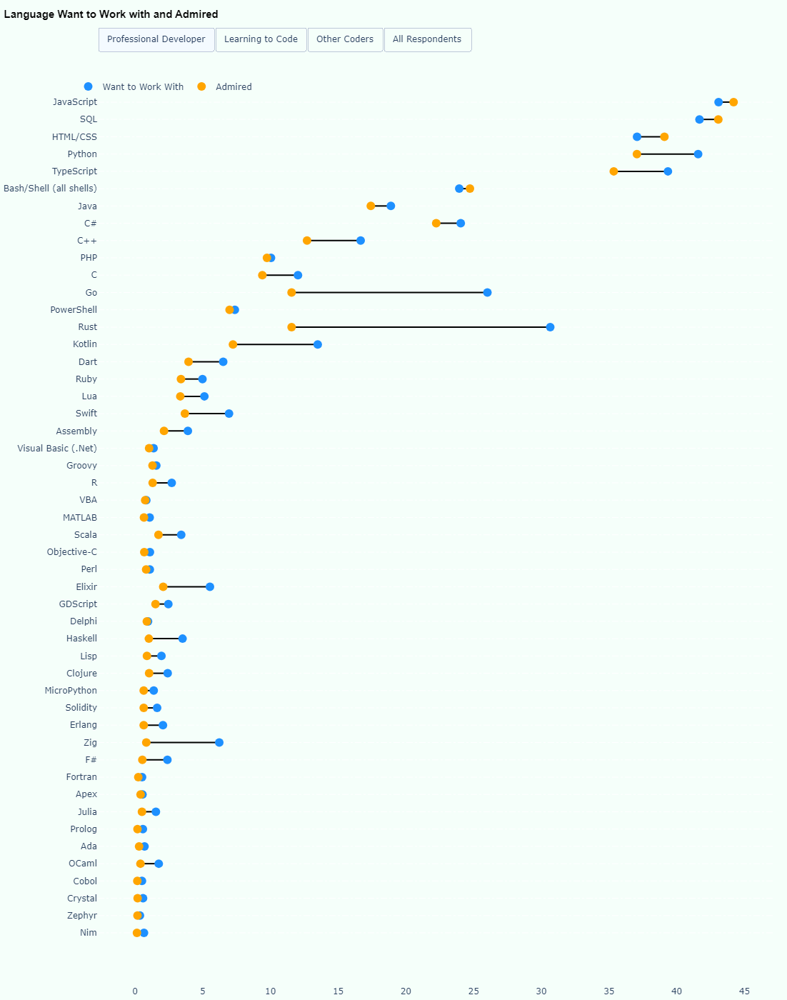

In [72]:
data_frame = languages_combined_df 
ch_title= 'Language Want to Work with and Admired'

plot_dumbels_from_multi_index_df(data_frame,ch_title,height=1400,paper_bgcolor='mintcream')


#### Which database environments have you done extensive development work in over the past year, and which do you want to work in over the next year?

In [73]:

data_frame = df	
data_frame_columns = ['MainBranch', 'DatabaseHaveWorkedWith', 'DatabaseWantToWorkWith', 'DatabaseAdmired']

new_columns_names = [
    '% Database Worked With',
    '% Database Want to Work With',
    '% Database Admired'    
]

respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

databases_combined_df = get_multi_index_perce_combined_category_dfs(data_frame, data_frame_columns, new_columns_names)


In [74]:
databases_combined_df

Professional Developer  \
                           % Database Worked With   
PostgreSQL                                  53.38   
MySQL                                       40.64   
SQLite                                      33.29   
Microsoft SQL Server                        27.66   
MongoDB                                     26.05   
Redis                                       23.27   
MariaDB                                     17.60   
Elasticsearch                               14.51   
Oracle                                      10.51   
Dynamodb                                     9.30   
Firebase Realtime Database                   5.80   
Cloud Firestore                              5.57   
BigQuery                                     5.12   
H2                                           4.39   
Supabase                                     3.99   
Cosmos DB                                    3.81   
Microsoft Access                             3.47   
Snowflake                                    2.82   
InfluxDB                                     2.68   
Cassandra                                    2.63   
Neo4J                                        1.99   
Databricks SQL                               1.98   
Clickhouse                                   1.86   
IBM DB2                                      1.82   
Solr                                         1.59   
DuckDB                                       1.38   
Firebird                                     1.09   
Couch DB                                     1.01   
Cockroachdb                                  0.95   
Couchbase                                    0.72   
Presto                                       0.66   
Datomic                                      0.33   
EventStoreDB                                 0.30   
RavenDB                                      0.28   
TiDB                                         0.20   

                                                                            \
                           % Database Want to Work With % Database Admired   
PostgreSQL                                        58.48              51.76   
MySQL                                             27.14              27.30   
SQLite                                            30.36              26.86   
Microsoft SQL Server                              19.31              19.74   
MongoDB                                           25.44              18.66   
Redis                                             27.35              20.20   
MariaDB                                           13.43              12.61   
Elasticsearch                                     16.01               9.33   
Oracle                                             5.82               5.05   
Dynamodb                                           9.00               5.96   
Firebase Realtime Database                         5.47               3.37   
Cloud Firestore                                    4.71               3.69   
BigQuery                                           5.82               3.30   
H2                                                 2.59               2.41   
Supabase                                           6.56               3.09   
Cosmos DB                                          4.41               2.46   
Microsoft Access                                   0.99               0.84   
Snowflake                                          4.17               1.85   
InfluxDB                                           2.52               1.50   
Cassandra                                          5.81               1.21   
Neo4J                                              3.78               1.21   
Databricks SQL                                     2.69               1.23   
Clickhouse                                         3.30               1.44   
IBM DB2                                            0.79               0.61   
Solr                                 

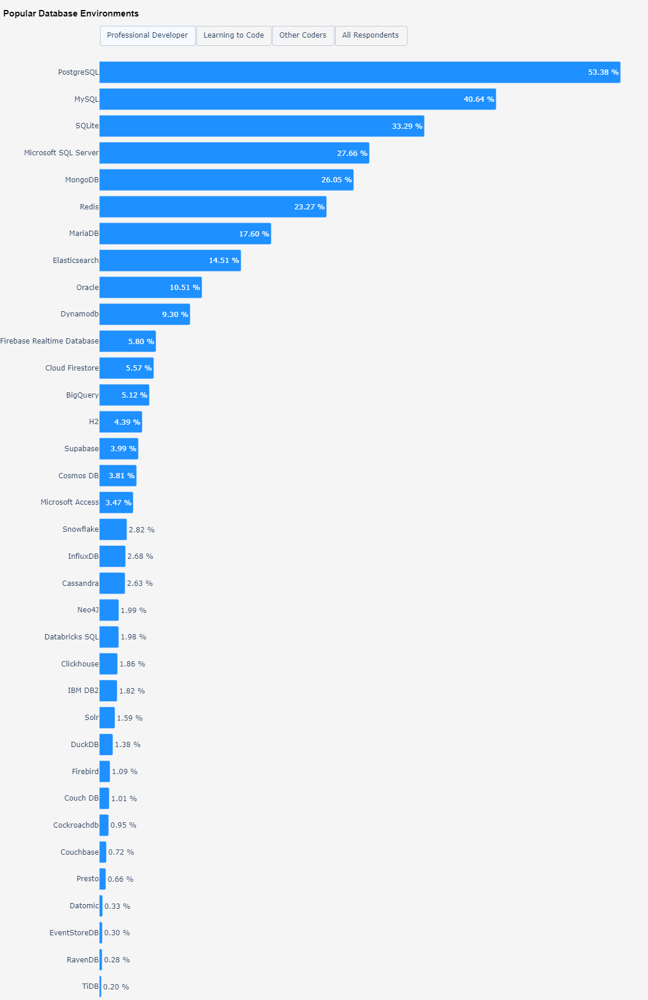

In [75]:
plot_multi_indexed_df(
    data_frame=databases_combined_df, ch_title= 'Popular Database Environments',
    worked_with_col='% Database Worked With', height=1700, width=1100,
    plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke"
)

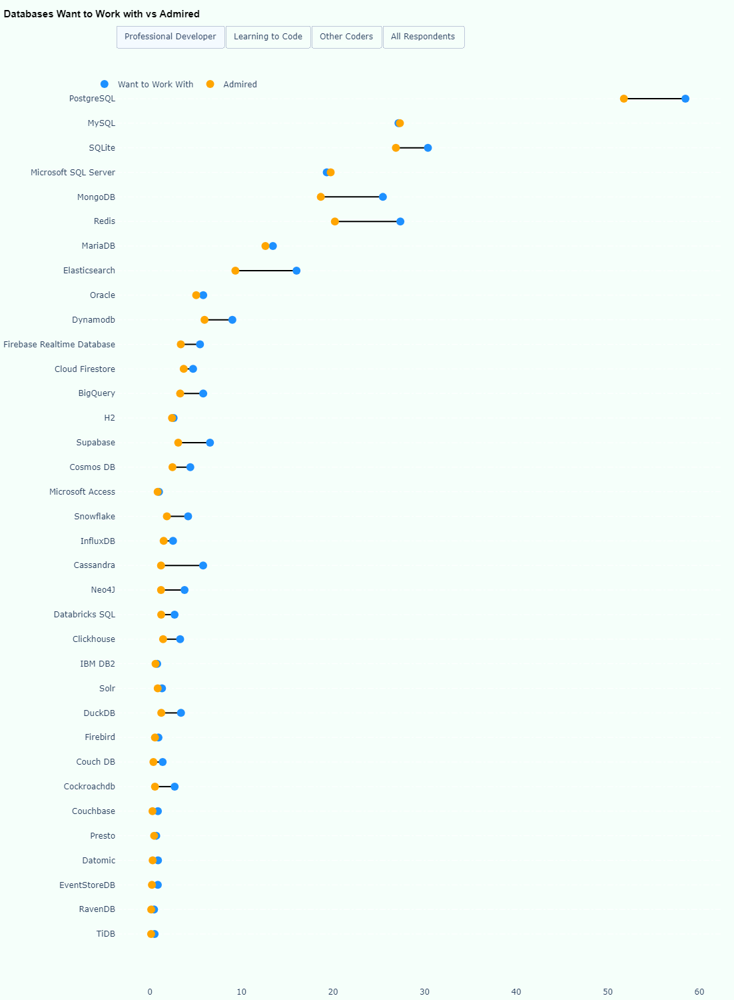

In [76]:
data_frame = databases_combined_df 

plot_dumbels_from_multi_index_df(data_frame,ch_title='Databases Want to Work with vs Admired')

#### Which cloud platforms have you done extensive development work in over the past year, and which do you want to work in over the next year? 

In [77]:

data_frame = df	

data_frame_columns = ['MainBranch', 'PlatformHaveWorkedWith', 'PlatformWantToWorkWith', 'PlatformAdmired']

new_columns_names = [
    '% Platform Worked With',
    '% Platform Want to Work With',
    '% Platform Admired'    
]

respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

cloud_platforms_combined_df = get_multi_index_perce_combined_category_dfs(data_frame, data_frame_columns, new_columns_names)

In [78]:
cloud_platforms_combined_df

Professional Developer  \
                                  % Platform Worked With   
Amazon Web Services (AWS)                          55.62   
Microsoft Azure                                    31.68   
Google Cloud                                       26.73   
Cloudflare                                         15.78   
Firebase                                           15.06   
Digital Ocean                                      13.20   
Vercel                                             12.41   
Heroku                                              8.96   
Netlify                                             7.20   
VMware                                              6.27   
Hetzner                                             5.43   
Supabase                                            3.96   
OVH                                                 3.26   
Linode, now Akamai                                  3.23   
Managed Hosting                                     3.20   
Fly.io                                              2.82   
Render                                              2.74   
OpenShift                                           2.73   
Oracle Cloud Infrastructure (OCI)                   2.53   
Databricks                                          2.08   
Vultr                                               1.73   
OpenStack                                           1.49   
PythonAnywhere                                      1.41   
Alibaba Cloud                                       0.98   
IBM Cloud Or Watson                                 0.97   
Scaleway                                            0.92   
Colocation                                          0.60   

                                                                \
                                  % Platform Want to Work With   
Amazon Web Services (AWS)                                54.19   
Microsoft Azure                                          30.31   
Google Cloud                                             27.50   
Cloudflare                                               18.84   
Firebase                                                 13.65   
Digital Ocean                                            13.07   
Vercel                                                   12.50   
Heroku                                                    4.62   
Netlify                                                   5.73   
VMware                                                    3.79   
Hetzner                                                   6.98   
Supabase                                                  6.31   
OVH                                                       2.84   
Linode, now Akamai                                        3.88   
Managed Hosting                                           2.90   
Fly.io                                                    4.97   
Render                                                    2.30   
OpenShift                                                 2.82   
Oracle Cloud Infrastructure (OCI)                         2.63   
Databricks                                                3.14   
Vultr                                                     1.69   
OpenStack                                                 2.16   
PythonAnywhere                                            1.49   
Alibaba Cloud                                             1.13   
IBM Cloud Or Watson                                       1.16   
Scaleway                                                  0.96   
Colocation                                                0.81   

                                                           Learning to Code  \
                                  % Platform Admired % Platform Worked With   
Amazon Web Services (AWS)                      47.56                  27.63   
Microsoft Azure                                25.39                  17.04   
Google Cloud                                   19.82          

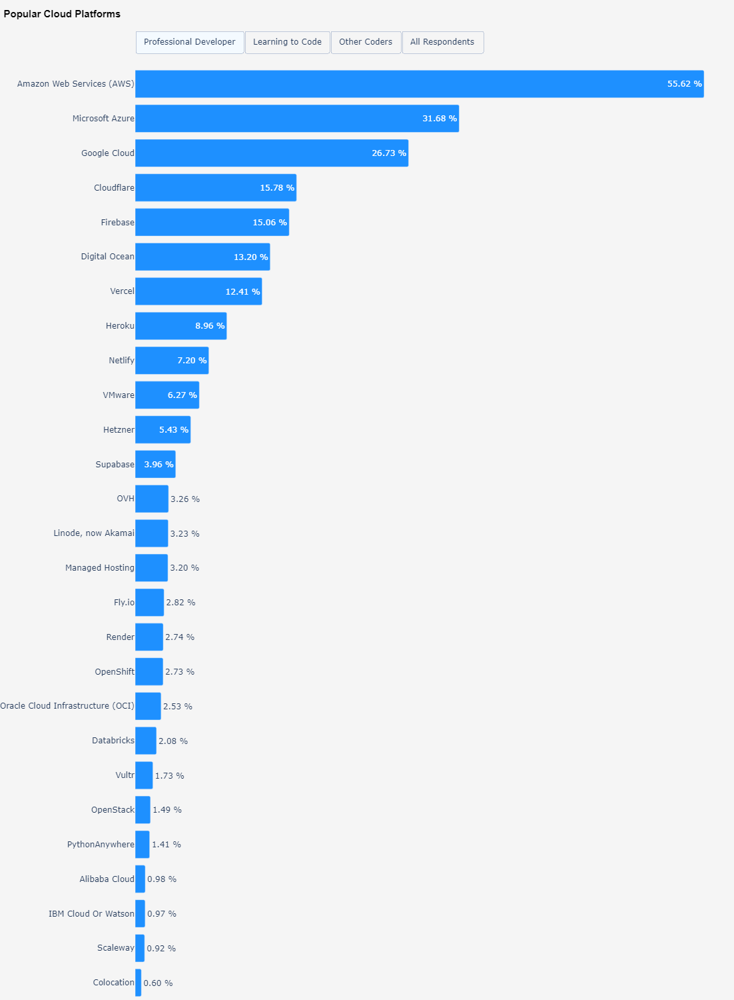

In [79]:
plot_multi_indexed_df(
    data_frame=cloud_platforms_combined_df, ch_title='Popular Cloud Platforms', worked_with_col='% Platform Worked With',
    height=1500, width=1100,
    plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke"
)

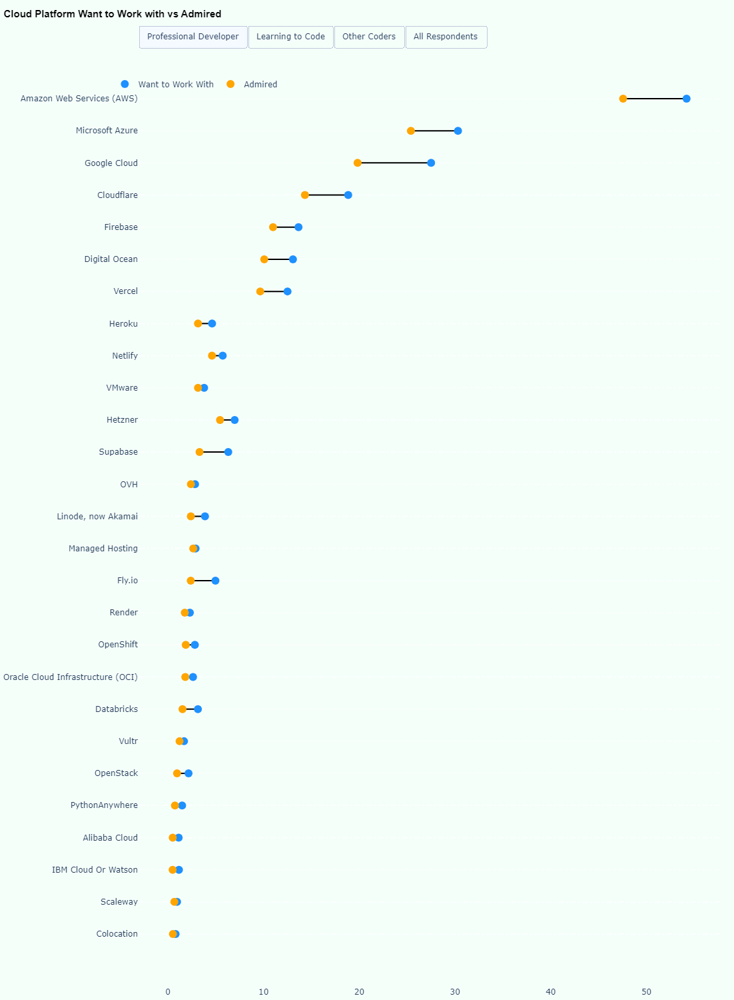

In [80]:
data_frame = cloud_platforms_combined_df 

plot_dumbels_from_multi_index_df(data_frame,ch_title='Cloud Platform Want to Work with vs Admired')

#### Which web frameworks and web technologies have you done extensive development work in over the past year, and which do you want to work in over the next year?

In [81]:

data_frame = df	

data_frame_columns = ['MainBranch', 'WebframeHaveWorkedWith', 'WebframeWantToWorkWith', 'WebframeAdmired']

new_columns_names = [
    '% Web_frameworks Worked With',
    '% Web_frameworks Want to Work With',
    '% Web_frameworks Admired'    
]

respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

Web_frameworks_combined_df = get_multi_index_perce_combined_category_dfs(data_frame, data_frame_columns, new_columns_names)


In [82]:
Web_frameworks_combined_df

Professional Developer  \
               % Web_frameworks Worked With   
React                                 43.97   
Node.js                               43.16   
jQuery                                23.60   
Angular                               20.33   
ASP.NET CORE                          19.98   
Next.js                               19.77   
Express                               19.40   
Vue.js                                17.51   
Spring Boot                           15.04   
ASP.NET                               14.95   
Flask                                 12.49   
Django                                12.18   
WordPress                             11.66   
FastAPI                               10.78   
Laravel                                9.04   
AngularJS                              7.77   
NestJS                                 6.94   
Svelte                                 6.36   
Blazor                                 5.67   
Ruby on Rails                          5.42   
Nuxt.js                                4.05   
Symfony                                3.71   
Htmx                                   3.45   
Astro                                  3.04   
Fastify                                2.51   
Phoenix                                2.19   
Drupal                                 1.99   
Strapi                                 1.99   
Deno                                   1.94   
CodeIgniter                            1.84   
Gatsby                                 1.75   
Remix                                  1.69   
Solid.js                               1.23   
Yii 2                                  1.01   
Play Framework                         0.87   
Elm                                    0.63   

                                                                            \
               % Web_frameworks Want to Work With % Web_frameworks Admired   
React                                       40.54                    34.96   
Node.js                                     37.28                    35.38   
jQuery                                      10.32                    10.27   
Angular                                     17.32                    14.01   
ASP.NET CORE                                19.46                    18.48   
Next.js                                     21.86                    14.84   
Express                                     14.19                    12.81   
Vue.js                                      19.97                    13.49   
Spring Boot                                 14.06                    12.10   
ASP.NET                                      8.53                     7.86   
Flask                                        8.95                     7.04   
Django                                      11.69                     7.81   
WordPress                                    5.51                     4.88   
FastAPI                                     12.62                     8.93   
Laravel                                      8.07                     6.50   
AngularJS                                    4.14                     2.11   
NestJS                                       8.51                     5.45   
Svelte                                      13.34                     5.77   
Blazor                                       8.26                     4.44   
Ruby on Rails                                5.91                     3.82   
Nuxt.js                                      5.76                     3.08   
Symfony                                      3.17                     2.59   
Htmx                                        10.84                     3.21   
Astro                                        5.57                     2.77   
Fastify                                      3.04                     1.79   
Phoenix                                      4.33                     2.35   
Drupal                                       0.96 

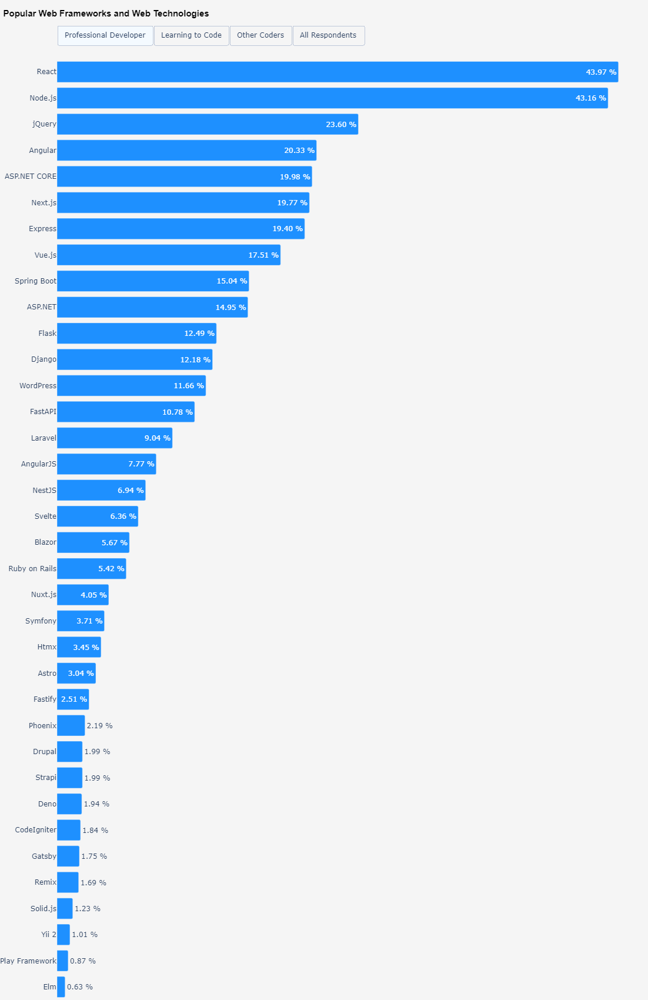

In [83]:
plot_multi_indexed_df(
    data_frame=Web_frameworks_combined_df, ch_title="Popular Web Frameworks and Web Technologies",worked_with_col='% Web_frameworks Worked With',
    height=1700, width=1100,
    plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke"
)

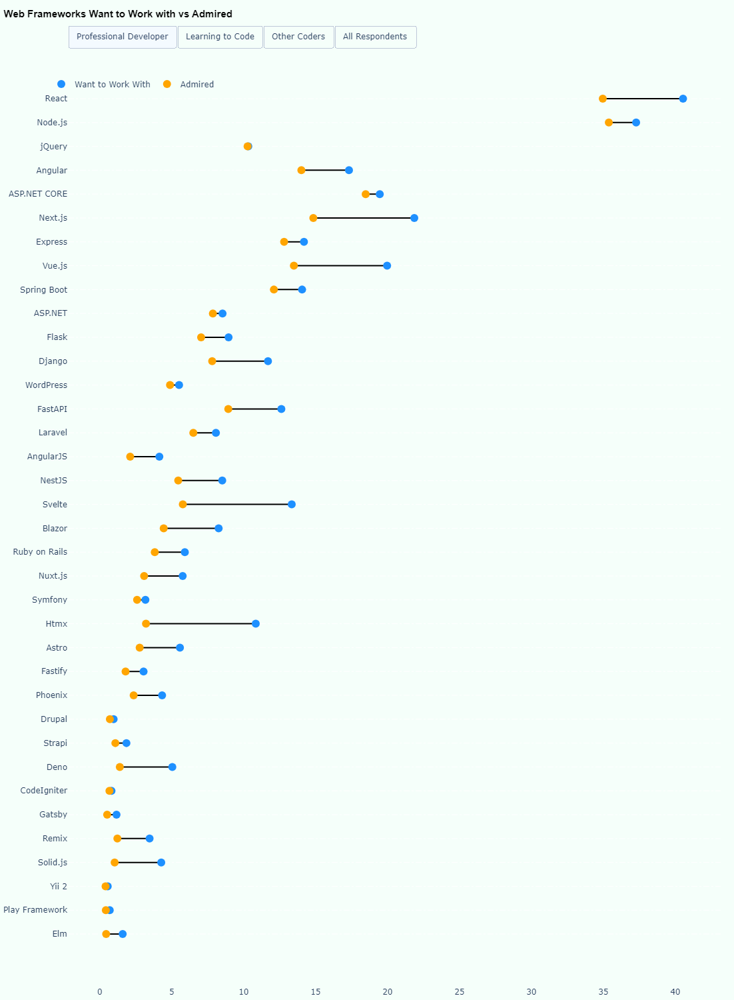

In [84]:
data_frame = Web_frameworks_combined_df 

plot_dumbels_from_multi_index_df(data_frame,ch_title='Web Frameworks Want to Work with vs Admired')

#### Which embedded systems and technologies have you done extensive development work in over the past year, and which do you want to work in over the next year?

In [85]:

data_frame = df	

data_frame_columns = ['MainBranch', 'EmbeddedHaveWorkedWith', 'EmbeddedWantToWorkWith', 'EmbeddedAdmired'	]

new_columns_names = [
    '% Embedded_Systems Worked With',
    '% Embedded_Systems Want to Work With',
    '% Embedded_Systems Admired'    
]

respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

embeded_systems_combined_df = get_multi_index_perce_combined_category_dfs(data_frame, data_frame_columns, new_columns_names)


In [86]:
embeded_systems_combined_df

Professional Developer  \
             % Embedded_Systems Worked With   
Rasberry Pi                           49.37   
CMake                                 37.04   
GNU GCC                               35.04   
Arduino                               34.63   
LLVM's Clang                          21.98   
Cargo                                 19.76   
MSVC                                  11.74   
Ninja                                 10.32   
PlatformIO                             6.21   
Meson                                  3.50   
QMake                                  3.23   
Catch2                                 2.59   
cppunit                                2.06   
Boost.Test                             1.46   
doctest                                1.39   
SCons                                  1.37   
ZMK                                    1.09   
Micronaut                              1.00   
build2                                 0.48   
CUTE                                   0.31   

                                                                              \
             % Embedded_Systems Want to Work With % Embedded_Systems Admired   
Rasberry Pi                                 55.40                      48.66   
CMake                                       26.57                      24.91   
GNU GCC                                     31.52                      31.41   
Arduino                                     34.66                      27.50   
LLVM's Clang                                23.85                      21.37   
Cargo                                       26.01                      21.94   
MSVC                                         7.95                       7.87   
Ninja                                        9.70                       8.50   
PlatformIO                                   6.69                       5.61   
Meson                                        3.82                       2.51   
QMake                                        1.90                       1.54   
Catch2                                       2.83                       2.30   
cppunit                                      1.97                       1.30   
Boost.Test                                   1.26                       0.90   
doctest                                      1.56                       1.14   
SCons                                        0.99                       0.72   
ZMK                                          1.47                       1.05   
Micronaut                                    1.19                       0.74   
build2                                       0.55                       0.28   
CUTE                                         0.37                       0.23   

                           Learning to Code  \
             % Embedded_Systems Worked With   
Rasberry Pi                           35.63   
CMake                                 27.16   
GNU GCC                               37.61   
Arduino                               49.64   
LLVM's Clang                          16.39   
Cargo                                 16.47   
MSVC                                   7.92   
Ninja                                  6.25   
PlatformIO                             4.51   
Meson                                  2.69   
QMake                                  2.30   
Catch2                                 1.90   
cppunit                                1.27   
Boost.Test                             1.98   
doctest                                1.98   
SCons                                  1.11   
ZMK                                    0.95   
Micronaut                              0.71   
build2                                 1.66   
CUTE                                   1.35   

                                                                              \
             % Embedded_Systems Want to Work With % Embedded_Systems Admired   
Rasberry Pi                   

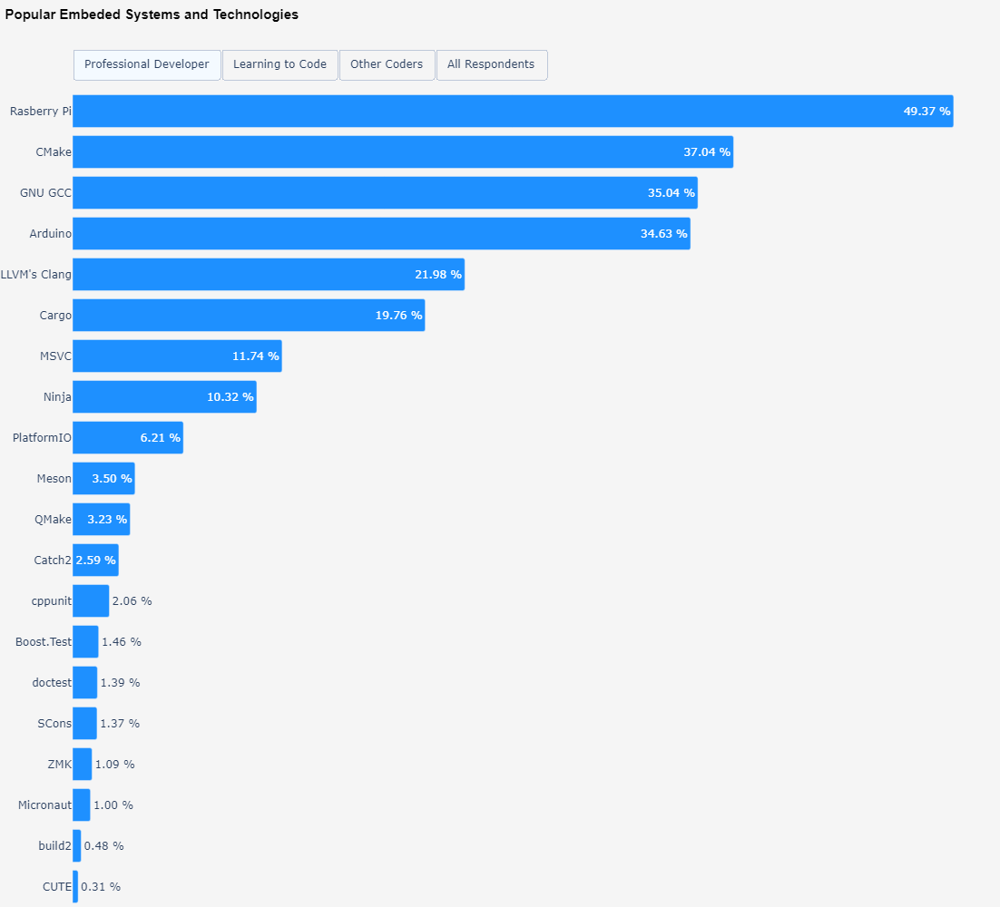

In [87]:
plot_multi_indexed_df(
    data_frame=embeded_systems_combined_df, ch_title="Popular Embeded Systems and Technologies", worked_with_col='% Embedded_Systems Worked With',
    height=1000, width=1100,
    plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke"
)

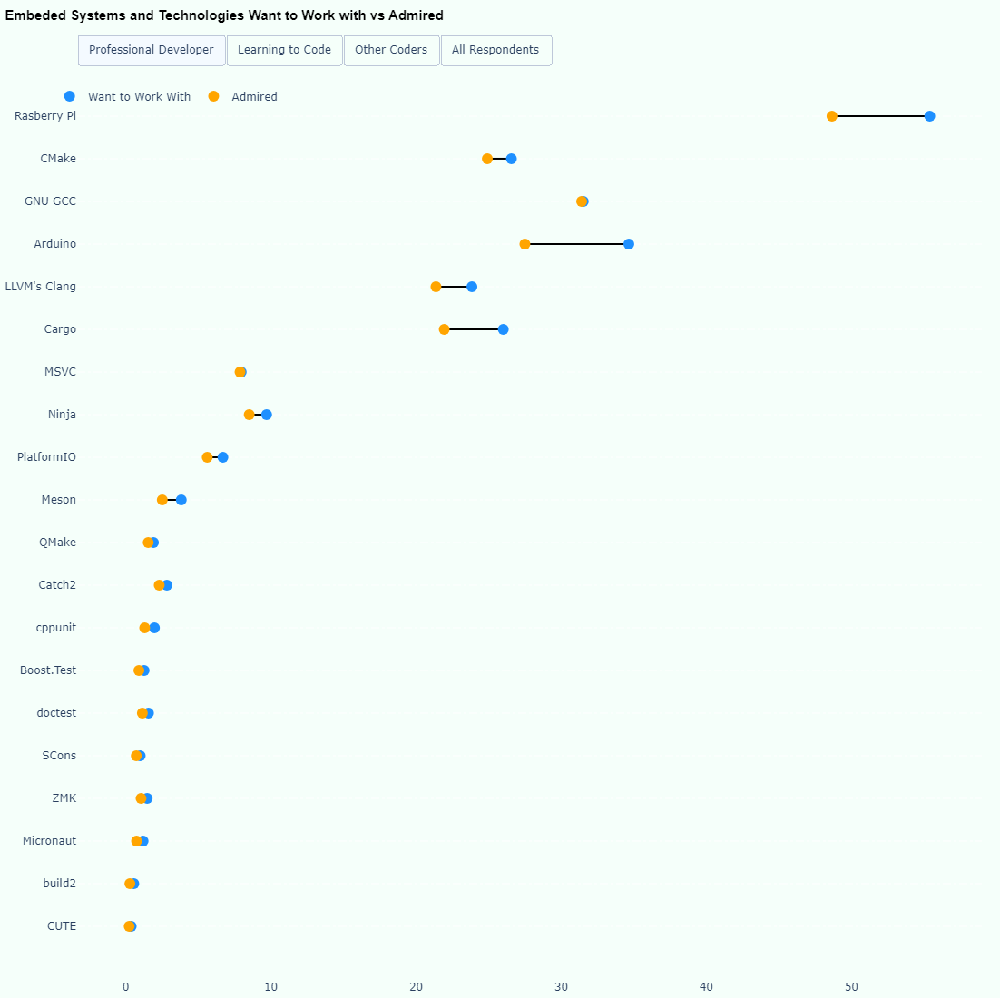

In [88]:
data_frame = embeded_systems_combined_df 

plot_dumbels_from_multi_index_df(data_frame,ch_title='Embeded Systems and Technologies Want to Work with vs Admired', height=1100)

#### Which other frameworks and libraries have you done extensive development work in over the past year, and which do you want to work in over the next year?

In [89]:

data_frame = df	

data_frame_columns = ['MainBranch', 'MiscTechHaveWorkedWith', 'MiscTechWantToWorkWith', 'MiscTechAdmired']

new_columns_names = [
    '% other_frameworks_and_libraries Worked With',
    '% other_frameworks_and_libraries Want to Work With',
    '% other_frameworks_and_libraries Admired'    
]

respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

other_frameworks_and_libraries_combined_df = get_multi_index_perce_combined_category_dfs(data_frame, data_frame_columns, new_columns_names)


In [90]:
other_frameworks_and_libraries_combined_df

Professional Developer  \
                           % other_frameworks_and_libraries Worked With   
.NET (5+)                                                         30.98   
Pandas                                                            21.74   
NumPy                                                             21.49   
.NET Framework (1.0 - 4.8)                                        20.58   
Spring Framework                                                  14.75   
RabbitMQ                                                          14.74   
Apache Kafka                                                      12.32   
Flutter                                                           10.94   
Torch/PyTorch                                                     10.84   
Scikit-Learn                                                      10.56   
TensorFlow                                                        10.42   
React Native                                                      10.39   
Opencv                                                             8.90   
Qt                                                                 7.60   
Electron                                                           7.26   
OpenGL                                                             6.63   
CUDA                                                               6.06   
Apache Spark                                                       5.30   
SwiftUI                                                            4.95   
Hugging Face Transformers                                          4.93   
Keras                                                              4.30   
.NET MAUI                                                          3.89   
Xamarin                                                            3.62   
Ruff                                                               3.60   
Ionic                                                              3.23   
Cordova                                                            2.88   
Hadoop                                                             2.65   
Tauri                                                              2.49   
GTK                                                                2.33   
Capacitor                                                          2.24   
Roslyn                                                             2.11   
DirectX                                                            1.86   
Quarkus                                                            1.70   
OpenCL                                                             1.64   
Ktor                                                               1.51   
mlflow                                                             1.39   
MFC                                                                1.23   
Tidyverse                                                          1.19   
JAX                                                                1.12   

                                                                               \
                           % other_frameworks_and_libraries Want to Work With   
.NET (5+)                                                               30.61   
Pandas                                                                  19.78   
NumPy                                                                   20.07   
.NET Framework (1.0 - 4.8)                                               8.40   
Spring Framework                                                        13.25   
RabbitMQ                                                                16.94   
Apache Kafka                                                            17.73   
Flutter                                                                 14.10   
Torch/PyTorch                                                           16.82   
Scikit-Learn                                                            10.81   
T

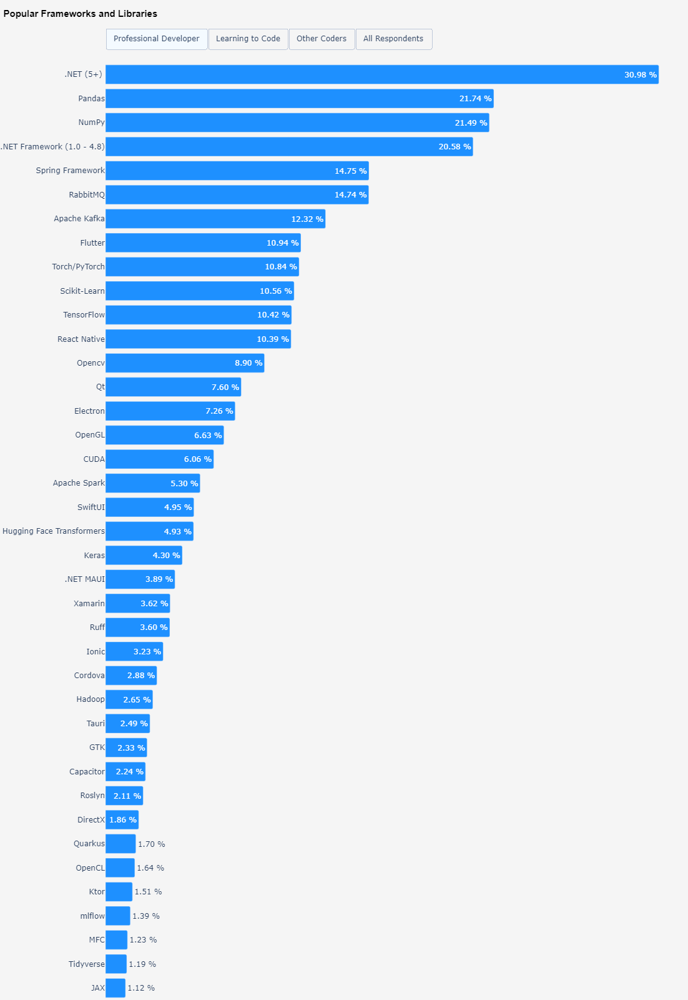

In [91]:
plot_multi_indexed_df(
    data_frame=other_frameworks_and_libraries_combined_df, worked_with_col='% other_frameworks_and_libraries Worked With',
    ch_title="Popular Frameworks and Libraries",
    height=1600, width=1100,
    plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke"
)

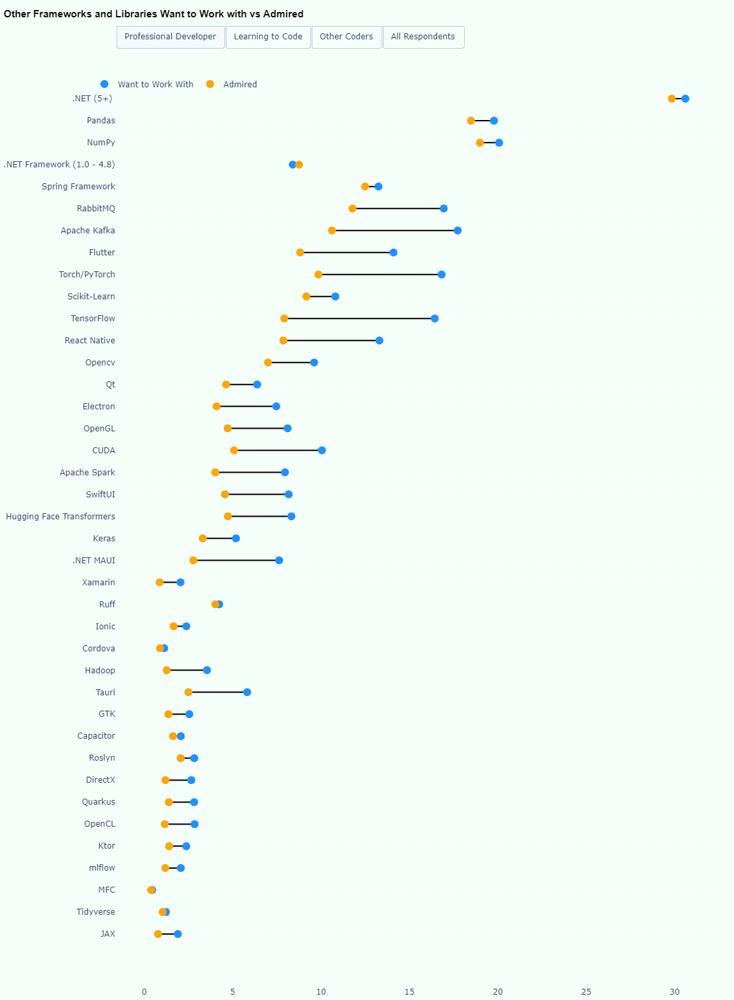

In [92]:
data_frame = other_frameworks_and_libraries_combined_df 

plot_dumbels_from_multi_index_df(data_frame,ch_title='Other Frameworks and Libraries Want to Work with vs Admired', height=1500)


#### Which developer tools for compiling, building and testing have you done extensive development work in over the past year, and which do you want to work in over the next year?

In [93]:

data_frame = df	

data_frame_columns = ['MainBranch', 'ToolsTechHaveWorkedWith', 'ToolsTechWantToWorkWith', 'ToolsTechAdmired']

new_columns_names = [
    '% compiling_building_testing_tools Worked With',
    '% compiling_building_testing_tools to Work With',
    '% compiling_building_testing_tools Admired'    
]

respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

compiling_building_testing_tools_combined_df = get_multi_index_perce_combined_category_dfs(data_frame, data_frame_columns, new_columns_names)


In [94]:
compiling_building_testing_tools_combined_df

Professional Developer  \
                       % compiling_building_testing_tools Worked With   
Docker                                                          59.88   
npm                                                             53.47   
Pip                                                             30.77   
Homebrew                                                        24.83   
Kubernetes                                                      22.28   
Yarn                                                            21.63   
Vite                                                            21.62   
Webpack                                                         21.42   
Make                                                            20.67   
NuGet                                                           18.22   
Maven (build tool)                                              17.09   
Gradle                                                          16.30   
Visual Studio Solution                                          15.79   
MSBuild                                                         12.64   
Terraform                                                       12.04   
APT                                                              9.99   
Composer                                                         9.83   
pnpm                                                             9.68   
Chocolatey                                                       8.83   
Ansible                                                          8.21   
Pacman                                                           5.82   
Podman                                                           5.29   
Unity 3D                                                         4.85   
Ninja                                                            4.07   
Bun                                                              3.82   
Godot                                                            3.61   
Google Test                                                      3.32   
Ant                                                              3.08   
Nix                                                              2.61   
Unreal Engine                                                    2.59   
Dagger                                                           1.33   
Puppet                                                           1.11   
Pulumi                                                           1.02   
Chef                                                             0.73   

                                                                        \
                       % compiling_building_testing_tools to Work With   
Docker                                                           59.94   
npm                                                              37.57   
Pip                                                              22.08   
Homebrew                                                         20.40   
Kubernetes                                                       30.78   
Yarn                                                             14.09   
Vite                                                             22.79   
Webpack                                                          10.62   
Make                                                             15.02   
NuGet                                                            14.73   
Maven (build tool)                                               11.64   
Gradle                                                           11.65   
Visual Studio Solution                                           13.07   
MSBuild                                                           9.14   
Terraform                                                        14.51   
APT                                                               8.22   
Composer                                                          7.46   
pnpm        

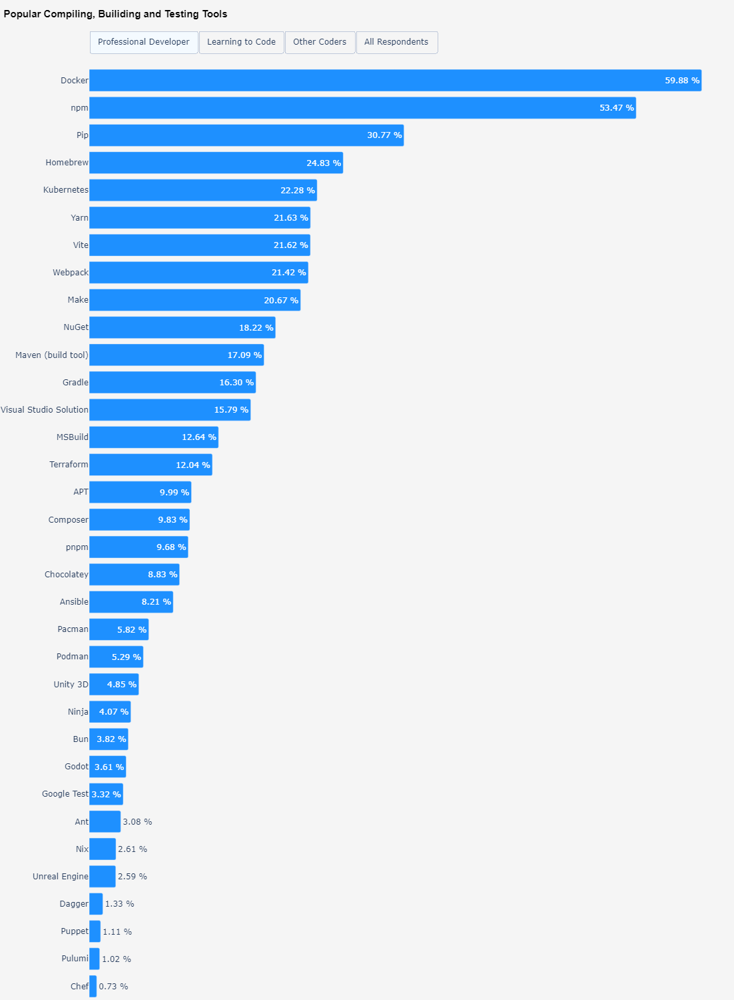

In [95]:
plot_multi_indexed_df(
    data_frame=compiling_building_testing_tools_combined_df, worked_with_col='% compiling_building_testing_tools Worked With',
    ch_title="Popular Compiling, Builiding and Testing Tools",
    height=1500, width=1100,
    plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke"
)

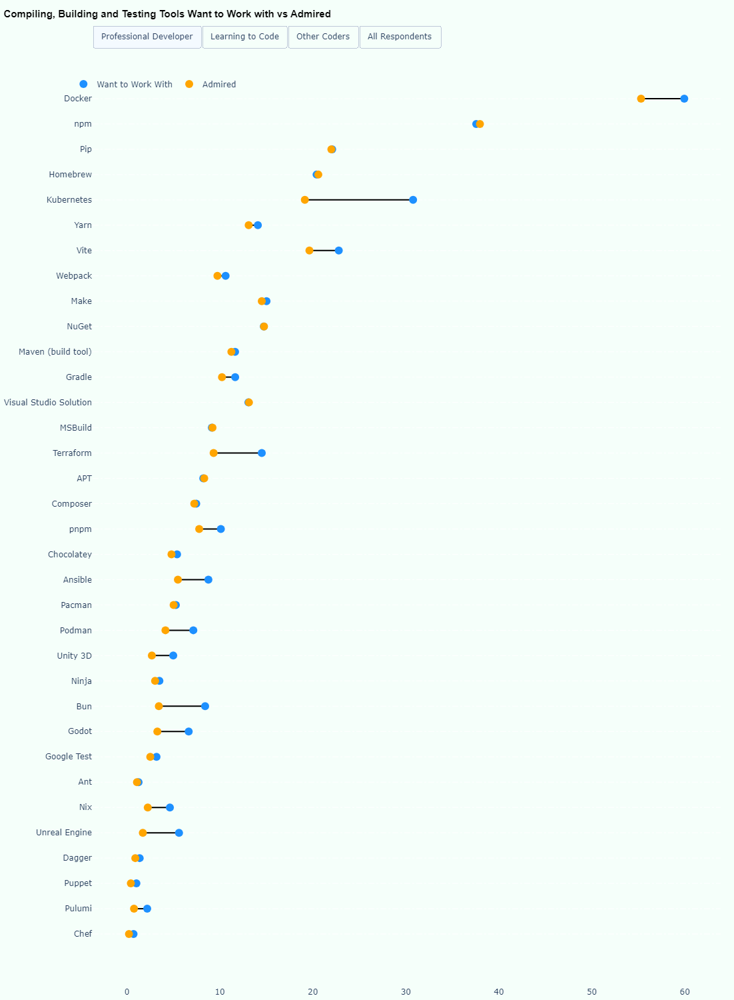

In [96]:
data_frame = compiling_building_testing_tools_combined_df 

plot_dumbels_from_multi_index_df(data_frame,ch_title='Compiling, Building and Testing Tools Want to Work with vs Admired', height=1500)


#### Which development environments did you use regularly over the past year, and which do you want to work with over the next year?

In [97]:

data_frame = df	

data_frame_columns = ['MainBranch', 'NEWCollabToolsHaveWorkedWith', 'NEWCollabToolsWantToWorkWith', 'NEWCollabToolsAdmired']

new_columns_names = [
    '% Dev_Environment Worked With',
    '% Dev_Environment to Work With',
    '% Dev_Environment Admired'    
]

respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

dev_environment_combined_df = get_multi_index_perce_combined_category_dfs(data_frame, data_frame_columns, new_columns_names)


In [98]:
dev_environment_combined_df

Professional Developer  \
                                 % Dev_Environment Worked With   
Visual Studio Code                                       74.55   
Visual Studio                                            29.87   
IntelliJ IDEA                                            28.33   
Notepad++                                                24.02   
Vim                                                      21.85   
Android Studio                                           16.16   
PyCharm                                                  14.19   
Neovim                                                   11.73   
Jupyter Notebook/JupyterLab                              11.40   
Sublime Text                                             11.03   
Xcode                                                    10.12   
Eclipse                                                   9.28   
Nano                                                      8.79   
WebStorm                                                  8.35   
PhpStorm                                                  6.70   
Rider                                                     6.38   
DataGrip                                                  5.79   
CLion                                                     4.33   
IPython                                                   4.23   
VSCodium                                                  4.06   
Emacs                                                     3.97   
Goland                                                    3.68   
Netbeans                                                  2.76   
Qt Creator                                                2.52   
RStudio                                                   1.92   
Fleet                                                     1.69   
Helix                                                     1.55   
Code::Blocks                                              1.54   
Kate                                                      1.53   
RubyMine                                                  1.26   
Spyder                                                    1.01   
Rad Studio (Delphi, C++ Builder)                          1.01   
BBEdit                                                    0.83   
Geany                                                     0.81   
Spacemacs                                                 0.34   

                                                                 \
                                 % Dev_Environment to Work With   
Visual Studio Code                                        65.59   
Visual Studio                                             21.57   
IntelliJ IDEA                                             23.85   
Notepad++                                                 17.31   
Vim                                                       18.58   
Android Studio                                            11.30   
PyCharm                                                   11.85   
Neovim                                                    14.56   
Jupyter Notebook/JupyterLab                                9.51   
Sublime Text                                               7.22   
Xcode                                                      7.69   
Eclipse                                                    3.50   
Nano                                                       6.02   
WebStorm                                                   7.54   
PhpStorm                                                   5.35   
Rider                                                      6.80   
DataGrip                                                   5.34   
CLion                                                      3.68   
IPython                                                    3.59   
VSCodium                                                   4.25   
Emacs                                                      3.76   
Goland                                                  

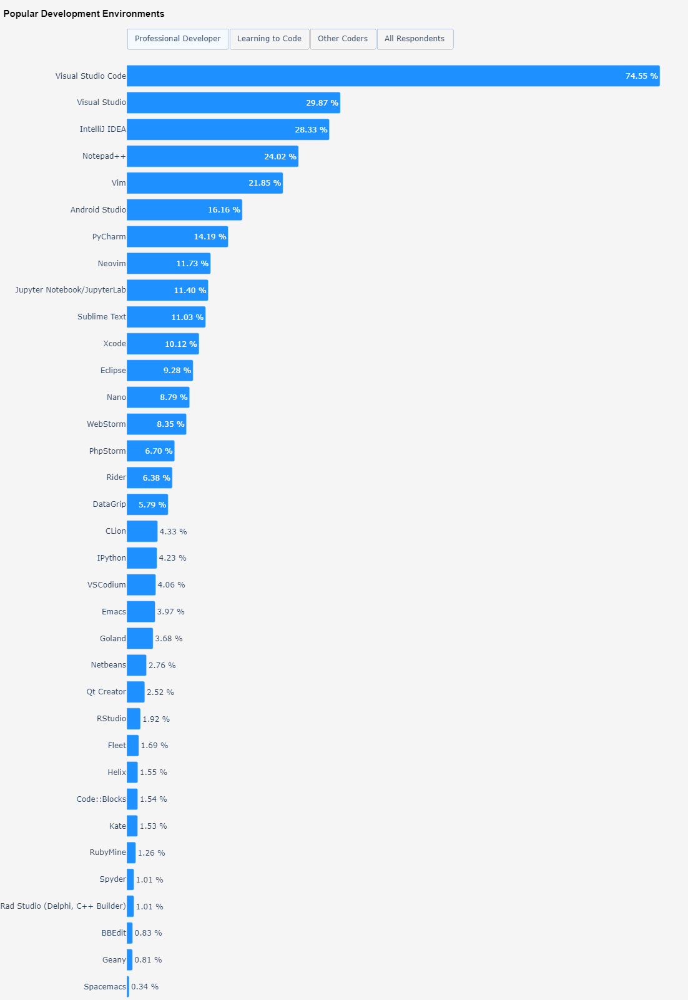

In [99]:
plot_multi_indexed_df(
    data_frame=dev_environment_combined_df, worked_with_col='% Dev_Environment Worked With',
    ch_title="Popular Development Environments",
    height=1600, width=1100,
    plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke"
)

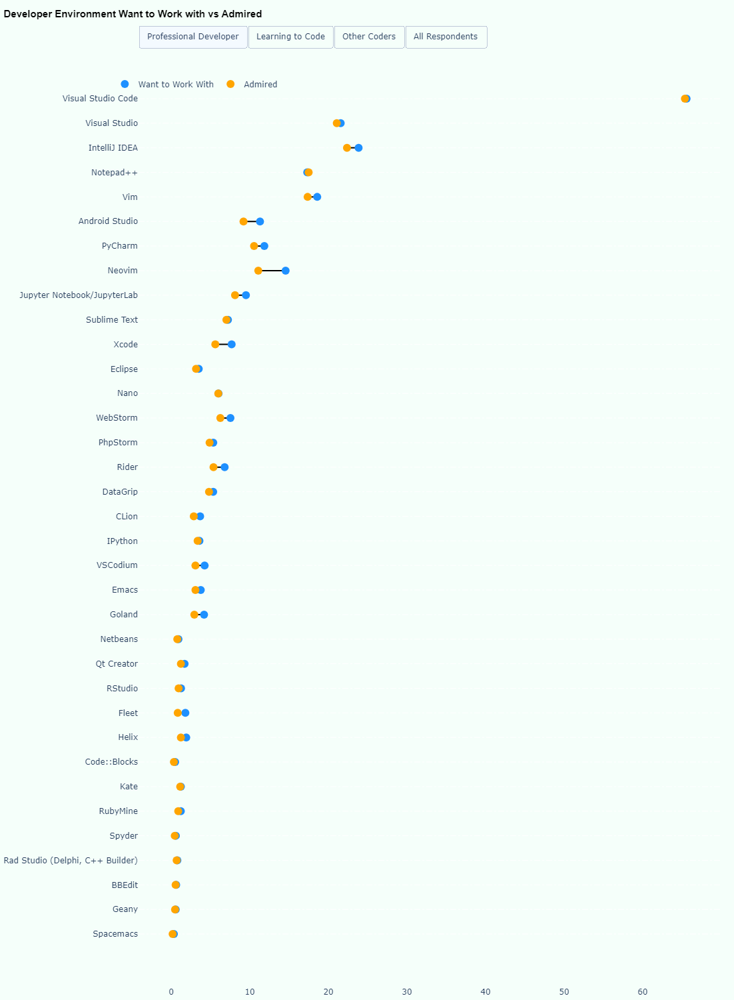

In [100]:
data_frame = dev_environment_combined_df 

plot_dumbels_from_multi_index_df(data_frame,ch_title='Developer Environment Want to Work with vs Admired', height=1500)

####  What is the primary operating system in which you work?

In [101]:

data_frame = df	

data_frame_columns = ['MainBranch', 'OpSysPersonal use', 'OpSysProfessional use']

new_columns_names = [
    '% OpSys Personal Use',
    '% OpSysProfessional Use'   
]

respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

opSys_combined_df = get_multi_index_perce_combined_category_dfs(data_frame, data_frame_columns, new_columns_names)


In [102]:
opSys_combined_df

Professional Developer  \
                                    % OpSys Personal Use   
Windows                                            58.31   
MacOS                                              34.90   
Ubuntu                                             28.56   
Windows Subsystem for Linux (WSL)                  17.36   
Android                                            17.06   
iOS                                                11.98   
Debian                                              9.47   
Other Linux-based                                   7.83   
Arch                                                7.29   
iPadOS                                              5.22   
Fedora                                              4.43   
Other (please specify):                             2.56   
Red Hat                                             2.16   
ChromeOS                                            1.35   
Cygwin                                              1.01   
BSD                                                 0.90   
Solaris                                             0.27   
AIX                                                 0.19   
Haiku                                               0.15   

                                                           \
                                  % OpSysProfessional Use   
Windows                                             50.90   
MacOS                                               38.28   
Ubuntu                                              31.19   
Windows Subsystem for Linux (WSL)                   18.81   
Android                                              9.29   
iOS                                                  8.43   
Debian                                               9.87   
Other Linux-based                                    8.39   
Arch                                                 4.07   
iPadOS                                               2.87   
Fedora                                               3.35   
Other (please specify):                              2.16   
Red Hat                                              5.27   
ChromeOS                                             0.92   
Cygwin                                               1.04   
BSD                                                  0.63   
Solaris                                              0.35   
AIX                                                  0.38   
Haiku                                                0.12   

                                      Learning to Code  \
                                  % OpSys Personal Use   
Windows                                          72.82   
MacOS                                            15.55   
Ubuntu                                           22.61   
Windows Subsystem for Linux (WSL)                16.52   
Android                                          27.44   
iOS                                               9.88   
Debian                                            7.97   
Other Linux-based                                 8.58   
Arch                                             10.37   
iPadOS                                            4.57   
Fedora                                            6.19   
Other (please specify):                           2.17   
Red Hat                                           1.68   
ChromeOS                                          5.31   
Cygwin                                            1.04   
BSD                                               0.94   
Solaris                                           0.68   
AIX                                               1.36   
Haiku                                             0.62   

                                                           \
                                  % OpSysProfessional Use   
Windows                                             63.95   
MacOS                                               17.92   
Ubuntu                      

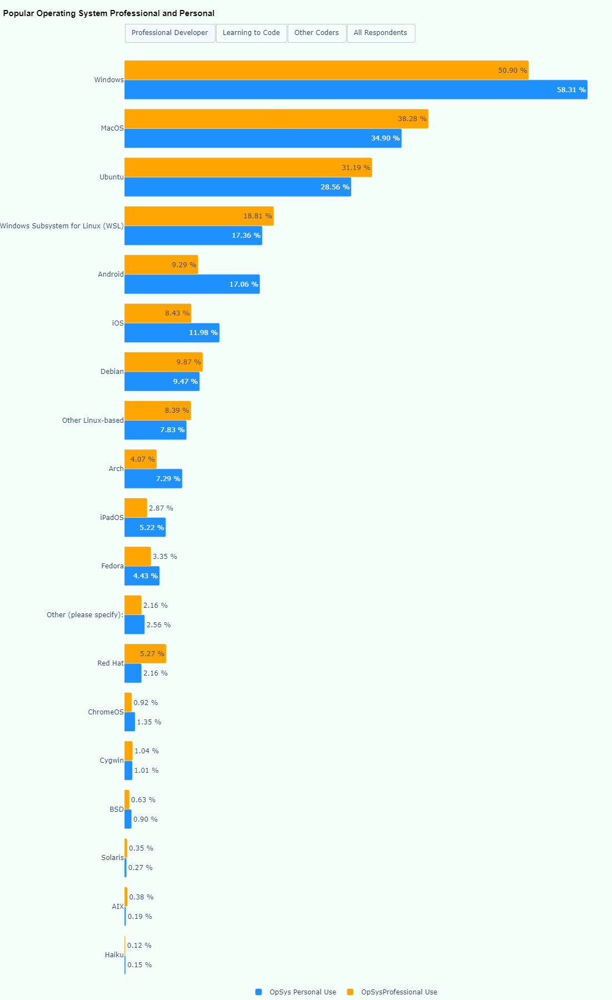

In [103]:
# Get the unique respondent categories (these should be level 0 if MultiIndex exists)
groups = opSys_combined_df.columns.get_level_values(0).unique()
worked_with_cols = opSys_combined_df.columns.get_level_values(1).unique()

# Create an empty figure
fig = go.Figure()

for group in groups:
    # Select data for the current group
    df_group = opSys_combined_df[group][worked_with_cols]
    
    for i, col in enumerate(worked_with_cols):
        # Add a trace for the horizontal bar chart
        fig.add_trace(go.Bar(
            x=df_group[col][::-1],  # Horizontal bar, so x is the data
            y=df_group.index[::-1],  # y-axis is the languages
            text=df_group[col][::-1],
            texttemplate='%{text:.2f} %',
            textposition='auto',
            marker_color='dodgerblue' if i == 0 else 'orange',  # Different color for each column
            marker=dict(cornerradius=2.5),
            name=f'{col[2:]}',  # Label for each trace
            orientation='h',  # Horizontal bar chart
            visible=(group == groups[0]),  # Show only the first group initially
            hovertemplate=(f'<i>Category</i>: {group}<br>'  # Show category (respondent group)
                '<i>Percentage</i>: %{x:.1f}%<br>'  # Show the percentage
                '<i>item</i>: %{y}'  # Show the language (y-axis)
                          )
        ))

# Create buttons for toggling visibility between groups
buttons = []
for i, group in enumerate(groups):
    # Make two traces visible for each group (if two metrics are added)
    visibility = [False] * (2 * len(groups))
    visibility[2 * i] = True  # Make the first trace for the group visible
    visibility[2 * i + 1] = True  # Make the second trace for the group visible
    
    button = dict(
        method="update",
        label=group,
        args=[{"visible": visibility}],  # Show only the current group's traces
    )
    buttons.append(button)

# Update the layout with individual buttons instead of a dropdown
fig.update_layout(
    updatemenus=[{
        "type": "buttons",
        "buttons": buttons,
        "direction": "right",
        "x": 0.0,
        "xanchor": "left",
        "y": 1.015,  # Position buttons above the chart
        "yanchor": "bottom",
        "pad": {"r": 10, "t": 10}  # Padding around the buttons
    }],
    xaxis=dict(showticklabels=False, showgrid=False, zeroline=True),
    yaxis=dict(showticklabels=True, showgrid=False, zeroline=True),
    width=1100,
    height=1800,
    margin=dict(t=100),  # Adjust the top margin to fit the buttons
    plot_bgcolor="mintcream",  # Set the plot background color
    paper_bgcolor='mintcream'  # Set the chart background color
)

# Update the title
fig.update_layout(
    title={
        'text': "Popular Operating System Professional and Personal",  # Title text
        'y': 0.990,  # Vertical position
        'x': 0.005,  # Horizontal position (centered)
        'xanchor': 'left',  # X anchor position
        'yanchor': 'top',  # Y anchor position
        'font': {'size': 15, 'color': 'black', 'family': 'sans-serif', 'weight': 'bold'},  # Bold title
    }
)

fig.update_layout(
    barmode='group'
)

fig.update_layout(
        legend=dict(
            orientation="h",  # Horizontal legend
            x=0.45,            # Center the legend horizontally
            y=-0.005,           # Position the legend below the chart
            xanchor='center',  # Anchor the legend from the center
            yanchor='top',      # Anchor the y-position from the top
        ),
    margin = dict(t=100, l=0, r=0, b=0)
    
)
    
fig.show()



#### Which collaborative work management and/or code documentation tools did you use regularly over the past year, and which do you want to work with over the next year?

In [104]:

data_frame = df	

data_frame_columns = ['MainBranch', 'OfficeStackAsyncHaveWorkedWith', 'OfficeStackAsyncWantToWorkWith', 'OfficeStackAsyncAdmired']

new_columns_names = [
    '% Collab_Work_Mgt_Tool Worked With',
    '% Collab_Work_Mgt_Tool Want to Worked With',
    '% Collab_Work_Mgt_Tool Admired'
]

respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

collab_work_mgt_tool_combined_df = get_multi_index_perce_combined_category_dfs(data_frame, data_frame_columns, new_columns_names)


In [105]:
 collab_work_mgt_tool_combined_df

Professional Developer  \
                         % Collab_Work_Mgt_Tool Worked With   
Jira                                                  58.65   
Confluence                                            35.92   
Markdown File                                         28.80   
Trello                                                19.51   
Notion                                                18.79   
Azure Devops                                          18.64   
GitHub Discussions                                    16.86   
Miro                                                  15.27   
Obsidian                                              12.34   
Wikis                                                  7.43   
Asana                                                  4.95   
Clickup                                                4.60   
Doxygen                                                4.03   
Lucid                                                  3.50   
Linear                                                 3.25   
Redmine                                                3.16   
YouTrack                                               2.53   
Monday.com                                             2.52   
Microsoft Planner                                      2.46   
Stack Overflow for Teams                               2.43   
Airtable                                               2.26   
Basecamp                                               1.46   
Shortcut                                               0.90   
Microsoft Lists                                        0.84   
Smartsheet                                             0.83   

                                                                     \
                         % Collab_Work_Mgt_Tool Want to Worked With   
Jira                                                          43.05   
Confluence                                                    24.20   
Markdown File                                                 30.71   
Trello                                                        12.66   
Notion                                                        16.69   
Azure Devops                                                  16.16   
GitHub Discussions                                            17.86   
Miro                                                          10.28   
Obsidian                                                      15.02   
Wikis                                                          6.96   
Asana                                                          3.02   
Clickup                                                        3.06   
Doxygen                                                        3.48   
Lucid                                                          2.63   
Linear                                                         4.21   
Redmine                                                        1.82   
YouTrack                                                       2.48   
Monday.com                                                     1.56   
Microsoft Planner                                              1.68   
Stack Overflow for Teams                                       3.65   
Airtable                                                       1.37   
Basecamp                                                       1.37   
Shortcut                                                       0.75   
Microsoft Lists                                                0.67   
Smartsheet                                                     0.37   

                                                         \
                         % Collab_Work_Mgt_Tool Admired   
Jira                                              41.84   
Confluence                                        24.08   
Markdown File                                     31.36   
Trello                                            11.34   
Notion                                            14.80   
Azur

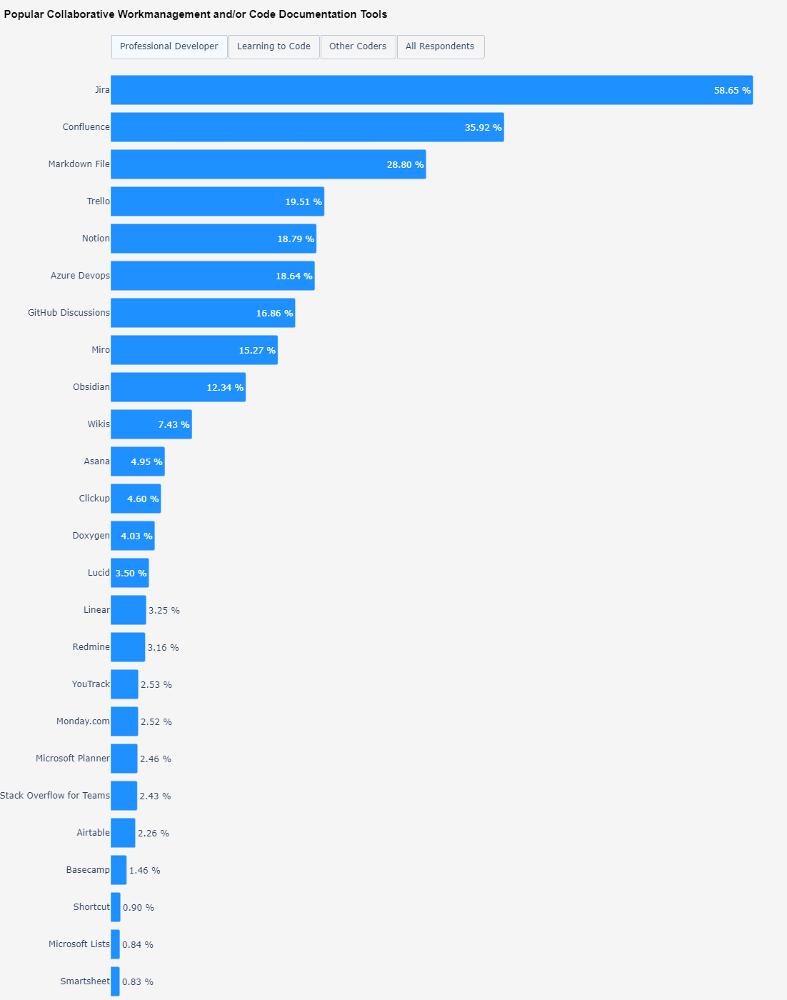

In [106]:
plot_multi_indexed_df(
    data_frame=collab_work_mgt_tool_combined_df, worked_with_col='% Collab_Work_Mgt_Tool Worked With',
    ch_title="Popular Collaborative Workmanagement and/or Code Documentation Tools",
    height=1400, width=1100,
    plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke"
)

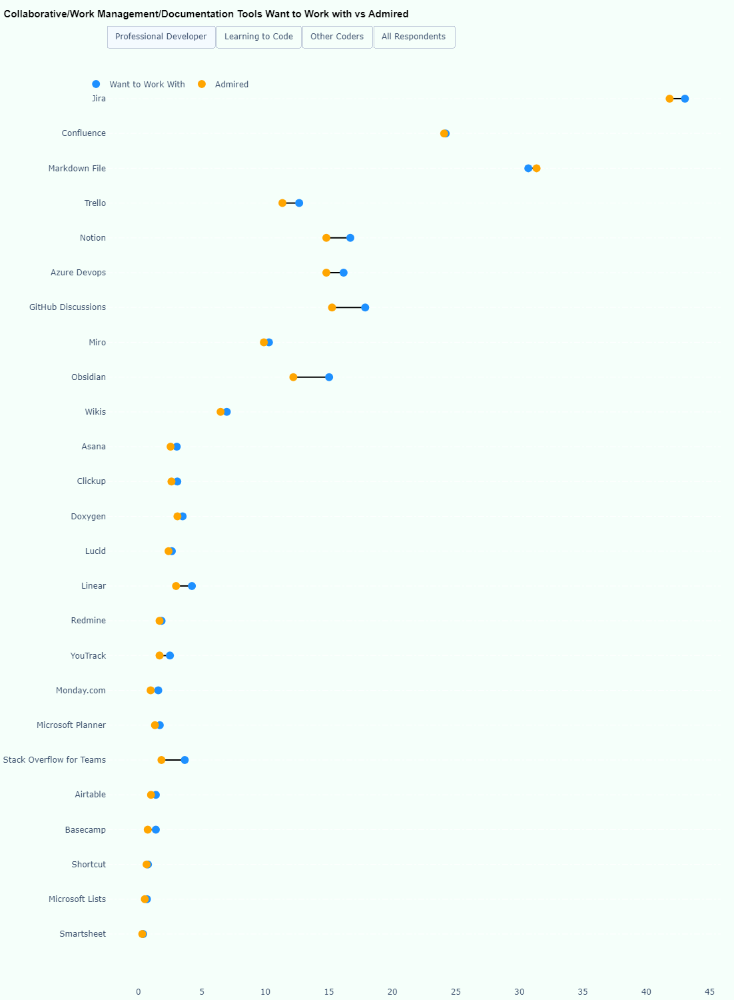

In [107]:
data_frame = collab_work_mgt_tool_combined_df 

plot_dumbels_from_multi_index_df(
    data_frame,ch_title='Collaborative/Work Management/Documentation Tools Want to Work with vs Admired',
    height=1500
)

#### Which communication tools did you use regularly over the past year, and which do you want to work with over the next year?

In [108]:

data_frame = df	

data_frame_columns = ['MainBranch', 'OfficeStackSyncHaveWorkedWith', 'OfficeStackSyncWantToWorkWith', 'OfficeStackSyncAdmired']

new_columns_names = [
    '% Communication_Tool Worked With',
    '% Communication_Tool Want to Worked With',
    '% Communication_Tool Admired'
]

respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

communication_tool_combined_df = get_multi_index_perce_combined_category_dfs(data_frame, data_frame_columns, new_columns_names)


In [109]:
communication_tool_combined_df

Professional Developer  \
                  % Communication_Tool Worked With   
Microsoft Teams                              56.44   
Slack                                        49.14   
Zoom                                         40.09   
Google Meet                                  39.27   
Discord                                      34.60   
Whatsapp                                     29.23   
Telegram                                     19.70   
Skype                                        12.50   
Signal                                       11.18   
Google Chat                                  11.09   
Cisco Webex Teams                             5.69   
Mattermost                                    4.08   
Matrix                                        2.86   
Jitsi                                         2.82   
IRC                                           2.36   
Rocketchat                                    1.65   
Zulip                                         1.29   
Ringcentral                                   0.48   
Symphony                                      0.32   
Wire                                          0.26   
Wickr                                         0.15   
Unify Circuit                                 0.10   
Coolfire Core                                 0.07   

                                                            \
                  % Communication_Tool Want to Worked With   
Microsoft Teams                                      33.67   
Slack                                                46.27   
Zoom                                                 22.76   
Google Meet                                          31.89   
Discord                                              31.85   
Whatsapp                                             21.14   
Telegram                                             16.60   
Skype                                                 5.20   
Signal                                               11.55   
Google Chat                                           7.15   
Cisco Webex Teams                                     2.07   
Mattermost                                            3.71   
Matrix                                                4.36   
Jitsi                                                 2.89   
IRC                                                   3.07   
Rocketchat                                            1.28   
Zulip                                                 1.61   
Ringcentral                                           0.25   
Symphony                                              0.20   
Wire                                                  0.24   
Wickr                                                 0.14   
Unify Circuit                                         0.10   
Coolfire Core                                         0.10   

                                                \
                  % Communication_Tool Admired   
Microsoft Teams                          33.96   
Slack                                    43.04   
Zoom                                     22.92   
Google Meet                              32.15   
Discord                                  29.97   
Whatsapp                                 21.84   
Telegram                                 16.33   
Skype                                     5.12   
Signal                                   10.28   
Google Chat                               6.86   
Cisco Webex Teams                         1.91   
Mattermost                                2.93   
Matrix                                    2.50   
Jitsi                                     2.11   
IRC                                       1.81   
Rocketchat                                0.87   
Zulip                                     0.98   
Ringcentral                               0.21   
Symphony                                  0.13   
Wire                                      0.15   
Wickr                     

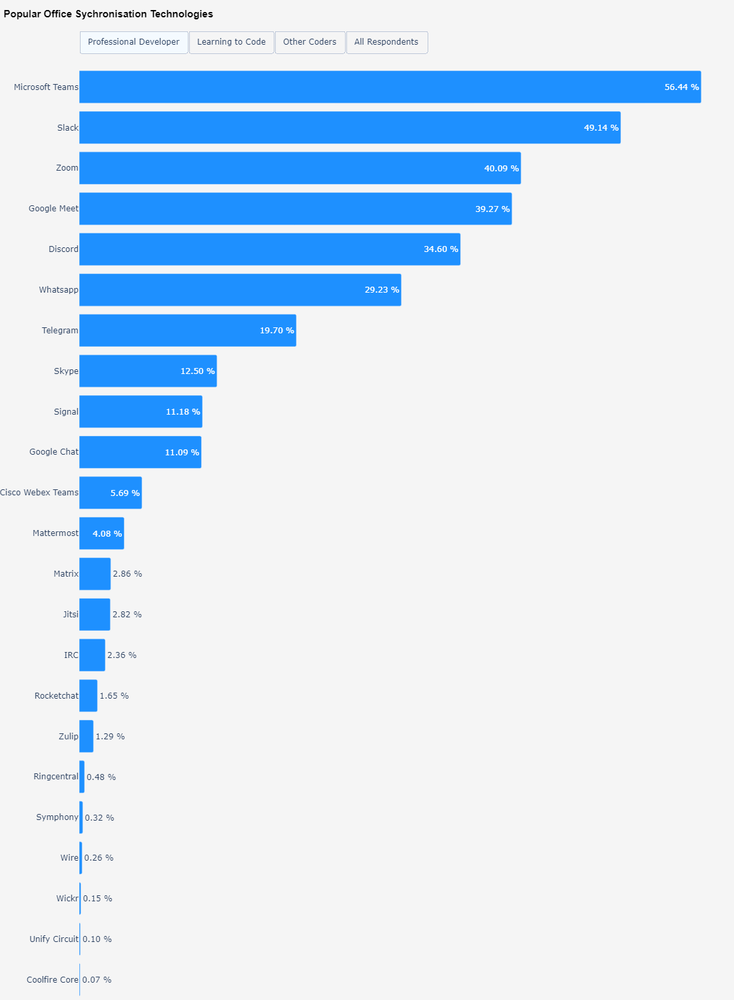

In [110]:
plot_multi_indexed_df(
    data_frame=communication_tool_combined_df, ch_title="Popular Office Sychronisation Technologies", worked_with_col='% Communication_Tool Worked With',
    height=1500, width=1100,
    plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke"
)

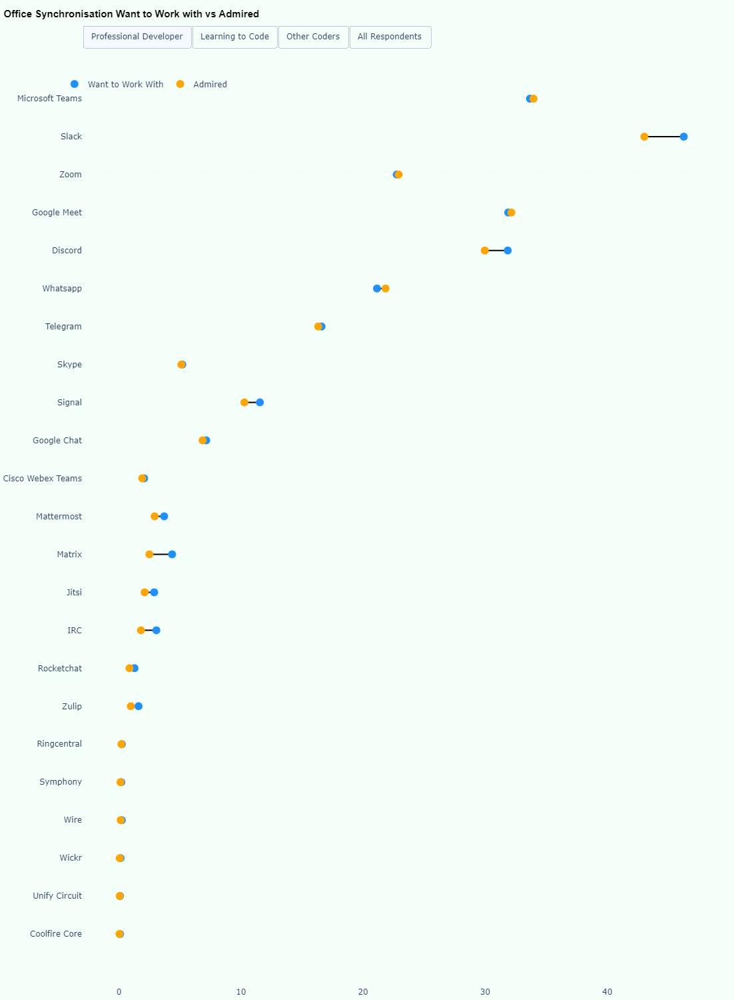

In [111]:
data_frame = communication_tool_combined_df 

plot_dumbels_from_multi_index_df(
    data_frame,ch_title='Office Synchronisation Want to Work with vs Admired',
    height=1500
)

## 

### Artificial Intelligence

#### Do you currently use AI tools in your development process?

In [112]:

data_frame = df
data_frame_columns = ['MainBranch', 'AISelect']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

ai_select = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
ai_select

Professional Developer                      \
                                No Respondents % of No Respondents   
                                                                     
Yes                                      29638               63.26   
No, and I don't plan to                  10959               23.39   
No, but I plan to soon                    6256               13.35   

                        Learning to Code                       Other Coders  \
                          No Respondents % of No Respondents No Respondents   
                                                                              
Yes                                 2280               66.20           5744   
No, and I don't plan to              569               16.52           3309   
No, but I plan to soon               595               17.28           1557   

                                            All Respondents  \
                        % of No Respondents  No Respondents   
                                                              
Yes                                   54.14           37662   
No, and I don't plan to               31.19           14837   
No, but I plan to soon                14.67            8408   

                                             
                        % of No Respondents  
                                             
Yes                                   61.84  
No, and I don't plan to               24.36  
No, but I plan to soon                13.80

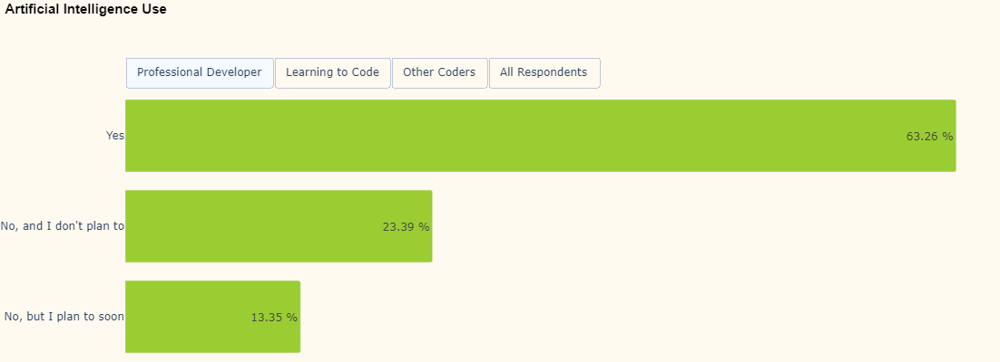

In [113]:
plot_multi_indexed_df(
    ai_select, worked_with_col='% of No Respondents', ch_title="Artificial Intelligence Use",
    height=400, width=1100,
    plot_bgcolor="floralwhite", paper_bgcolor="floralwhite", marker_color='yellowgreen'
)

#### How favorable is your stance on using AI tools as part of your development workflow?

In [114]:

data_frame = df
data_frame_columns = ['MainBranch', 'AISent']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

ai_sent = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
ai_sent

Professional Developer                     Learning to Code  \
                         No Respondents % of No Respondents   No Respondents   
                                                                               
Favorable                         17274               48.31             1405   
Very favorable                     8456               23.65              699   
Indifferent                        6748               18.87              449   
Unfavorable                        1880                5.26              124   
Unsure                              964                2.70              140   
Very unfavorable                    431                1.21               24   

                                       Other Coders                      \
                 % of No Respondents No Respondents % of No Respondents   
                                                                          
Favorable                      49.45           3488               47.92   
Very favorable                 24.60           1693               23.26   
Indifferent                    15.80           1367               18.78   
Unfavorable                     4.36            377                5.18   
Unsure                          4.93            253                3.48   
Very unfavorable                0.84            101                1.39   

                 All Respondents                      
                  No Respondents % of No Respondents  
                                                      
Favorable                  22167               48.32  
Very favorable             10848               23.65  
Indifferent                 8564               18.67  
Unfavorable                 2381                5.19  
Unsure                      1357                2.96  
Very unfavorable             556                1.21

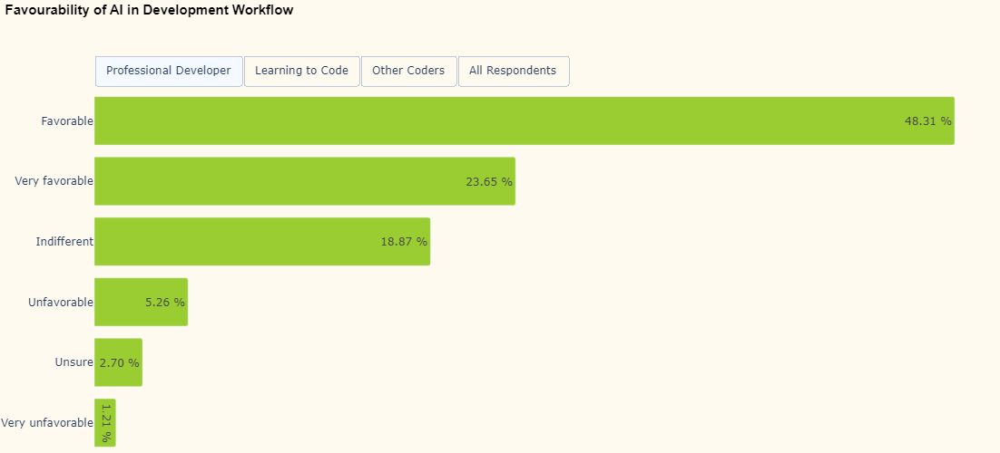

In [115]:
plot_multi_indexed_df(
    ai_sent, worked_with_col='% of No Respondents', ch_title="Favourability of AI in Development Workflow",
    height=500, width=1100,
    plot_bgcolor="floralwhite", paper_bgcolor="floralwhite", marker_color='yellowgreen'
)

#### For the AI tools you use as part of your development workflow, what are the MOST important benefits you are hoping to achieve?

In [116]:

data_frame = df
data_frame_columns = ['MainBranch', 'AIBen']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

ai_benefits = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
ai_benefits


Professional Developer                      \
                                      No Respondents % of No Respondents   
                                                                           
Increase productivity                          23998               82.59   
Speed up learning                              17688               60.87   
Greater efficiency                             16984               58.45   
Improve accuracy in coding                      8346               28.72   
Make workload more manageable                   7052               24.27   
Improve collaboration                           2181                7.51   
Other (please specify):                         1399                4.81   

                              Learning to Code                      \
                                No Respondents % of No Respondents   
                                                                     
Increase productivity                     1598               72.18   
Speed up learning                         1691               76.38   
Greater efficiency                        1277               57.68   
Improve accuracy in coding                 879               39.70   
Make workload more manageable              695               31.39   
Improve collaboration                      267               12.06   
Other (please specify):                     99                4.47   

                                Other Coders                      \
                              No Respondents % of No Respondents   
                                                                   
Increase productivity                   4296               76.41   
Speed up learning                       3643               64.80   
Greater efficiency                      3325               59.14   
Improve accuracy in coding              1940               34.51   
Make workload more manageable           1487               26.45   
Improve collaboration                    419                7.45   
Other (please specify):                  341                6.07   

                              All Respondents                      
                               No Respondents % of No Respondents  
                                                                   
Increase productivity                   29892               81.02  
Speed up learning                       23022               62.40  
Greater efficiency                      21586               58.51  
Improve accuracy in coding              11165               30.26  
Make workload more manageable            9234               25.03  
Improve collaboration                    2867                7.77  
Other (please specify):                  1839                4.98

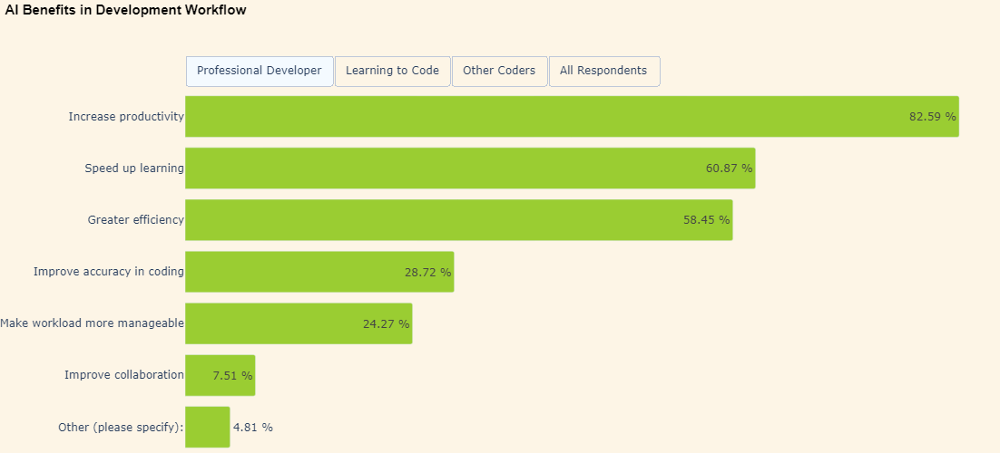

In [117]:
plot_multi_indexed_df(
    ai_benefits, worked_with_col='% of No Respondents', ch_title="AI Benefits in Development Workflow",
    height=500, width=1100,
    plot_bgcolor="oldlace", paper_bgcolor="oldlace", marker_color='yellowgreen')

#### How much do you trust the accuracy of the output from AI tools as part of your development workflow?

In [118]:

data_frame = df
data_frame_columns = ['MainBranch', 'AIAcc']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

ai_accuracy = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
ai_accuracy


Professional Developer                      \
                                   No Respondents % of No Respondents   
                                                                        
Somewhat trust                              11512               39.18   
Neither trust nor distrust                   8006               27.25   
Somewhat distrust                            6769               23.04   
Highly distrust                              2432                8.28   
Highly trust                                  660                2.25   

                           Learning to Code                      \
                             No Respondents % of No Respondents   
                                                                  
Somewhat trust                         1094               49.08   
Neither trust nor distrust              548               24.59   
Somewhat distrust                       357               16.02   
Highly distrust                         100                4.49   
Highly trust                            130                5.83   

                             Other Coders                     All Respondents  \
                           No Respondents % of No Respondents  No Respondents   
                                                                                
Somewhat trust                       2433               42.73           15039   
Neither trust nor distrust           1366               23.99            9920   
Somewhat distrust                    1269               22.29            8395   
Highly distrust                       400                7.02            2932   
Highly trust                          226                3.97            1016   

                                                
                           % of No Respondents  
                                                
Somewhat trust                           40.32  
Neither trust nor distrust               26.59  
Somewhat distrust                        22.51  
Highly distrust                           7.86  
Highly trust                              2.72

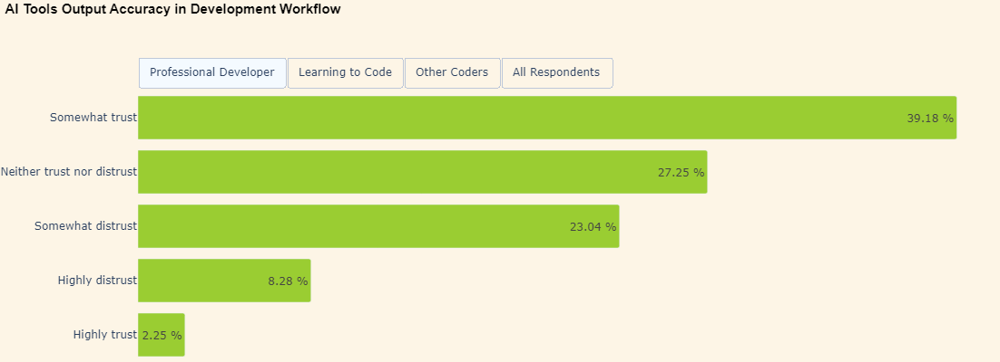

In [119]:
plot_multi_indexed_df(
    ai_accuracy, worked_with_col='% of No Respondents', ch_title="AI Tools Output Accuracy in Development Workflow",
    height=400, width=1100,
    plot_bgcolor="oldlace", paper_bgcolor="oldlace", marker_color='yellowgreen')


##### AI Accuracy Response in Various Age Groups.

In [120]:
age_group_ai_accuracy = percentages_pivoted_by_column(data_frame=df, data_frame_columns=['AIAcc', 'Age'], grouping_columns=['Age','AIAcc']) 


In [121]:
# sorting the age index
index_order = ['Under 18 years old','18-24 years old','25-34 years old','35-44 years old','45-54 years old','55-64 years old','65 years or older',
               'Prefer not to say']

age_group_ai_accuracy=sort_categorical_index(age_group_ai_accuracy, index_order)
age_group_ai_accuracy

,% Highly distrust,% Highly trust,% Neither trust nor distrust,% Somewhat distrust,% Somewhat trust
Age,,,,,
Under 18 years old,7.05,4.23,22.83,22.97,42.92
18-24 years old,6.73,2.23,26.91,21.91,42.22
25-34 years old,7.53,2.45,27.81,22.32,39.89
35-44 years old,9.61,2.78,25.92,23.45,38.24
45-54 years old,7.96,3.89,24.87,22.71,40.57
55-64 years old,9.06,3.74,24.90,22.54,39.76
65 years or older,4.62,6.72,19.75,15.13,53.78
Prefer not to say,15.38,4.27,20.51,27.35,32.48


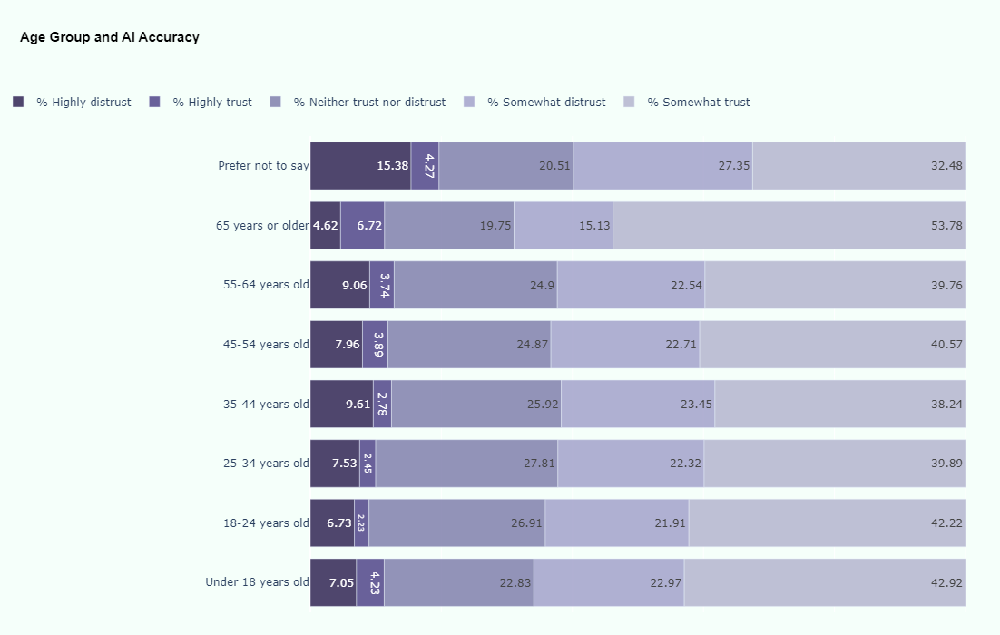

In [122]:
make_plotly_horizontal_stacked_bars_from_df(age_group_ai_accuracy, ch_title="Age Group and AI Accuracy ",
                                         paper_bgcolor="mintcream", plot_bgcolor="mintcream",
                                         width=1100, height=700)

#### How well do the AI tools you use in your development workflow handle complex tasks?

In [123]:

data_frame = df
data_frame_columns = ['MainBranch', 'AIComplex']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

ai_handling_complex_task = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
ai_handling_complex_task

Professional Developer  \
                                                      No Respondents   
                                                                       
Bad at handling complex tasks                                   9431   
Good, but not great at handling complex tasks                   9174   
Neither good or bad at handling complex tasks                   6077   
Very poor at handling complex tasks                             3671   
Very well at handling complex tasks                              836   

                                                                   \
                                              % of No Respondents   
                                                                    
Bad at handling complex tasks                               32.31   
Good, but not great at handling complex tasks               31.43   
Neither good or bad at handling complex tasks               20.82   
Very poor at handling complex tasks                         12.58   
Very well at handling complex tasks                          2.86   

                                              Learning to Code  \
                                                No Respondents   
                                                                 
Bad at handling complex tasks                              531   
Good, but not great at handling complex tasks              888   
Neither good or bad at handling complex tasks              458   
Very poor at handling complex tasks                        191   
Very well at handling complex tasks                        130   

                                                                   \
                                              % of No Respondents   
                                                                    
Bad at handling complex tasks                               24.16   
Good, but not great at handling complex tasks               40.40   
Neither good or bad at handling complex tasks               20.84   
Very poor at handling complex tasks                          8.69   
Very well at handling complex tasks                          5.91   

                                                Other Coders  \
                                              No Respondents   
                                                               
Bad at handling complex tasks                           1621   
Good, but not great at handling complex tasks           2040   
Neither good or bad at handling complex tasks           1171   
Very poor at handling complex tasks                      553   
Very well at handling complex tasks                      249   

                                                                   \
                                              % of No Respondents   
                                                                    
Bad at handling complex tasks                               28.77   
Good, but not great at handling complex tasks               36.21   
Neither good or bad at handling complex tasks               20.78   
Very poor at handling complex tasks                          9.82   
Very well at handling complex tasks                          4.42   

                                              All Respondents  \
                                               No Respondents   
                                                                
Bad at handling complex tasks                           11583   
Good, but not great at handling complex tasks           12102   
Neither good or bad at handling complex tasks            7706   
Very poor at handling complex tasks                      4415   
Very well at handling complex tasks                      1215   

                                                                   
                                              % of No Respondents  
                                                                   
Bad at handling complex tasks              

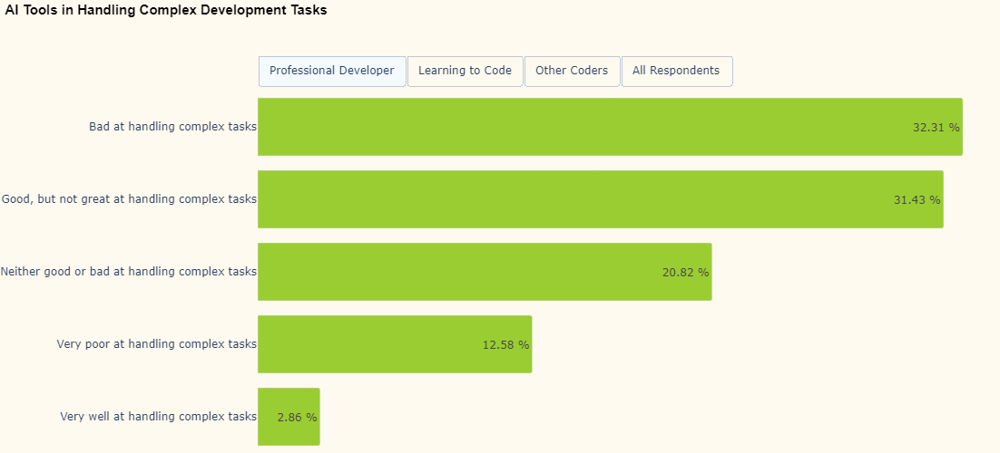

In [124]:
plot_multi_indexed_df(
    ai_handling_complex_task, worked_with_col='% of No Respondents', ch_title="AI Tools in Handling Complex Development Tasks",
    height=500, width=1100, plot_bgcolor="floralwhite",
    paper_bgcolor="floralwhite", marker_color='yellowgreen')

In [125]:
ai_complex_issues_handling = df['AIComplex'].value_counts().to_frame()
ai_complex_issues_handling

,count
AIComplex,
"Good, but not great at handling complex tasks",12102
Bad at handling complex tasks,11583
Neither good or bad at handling complex tasks,7706
Very poor at handling complex tasks,4415
Very well at handling complex tasks,1215


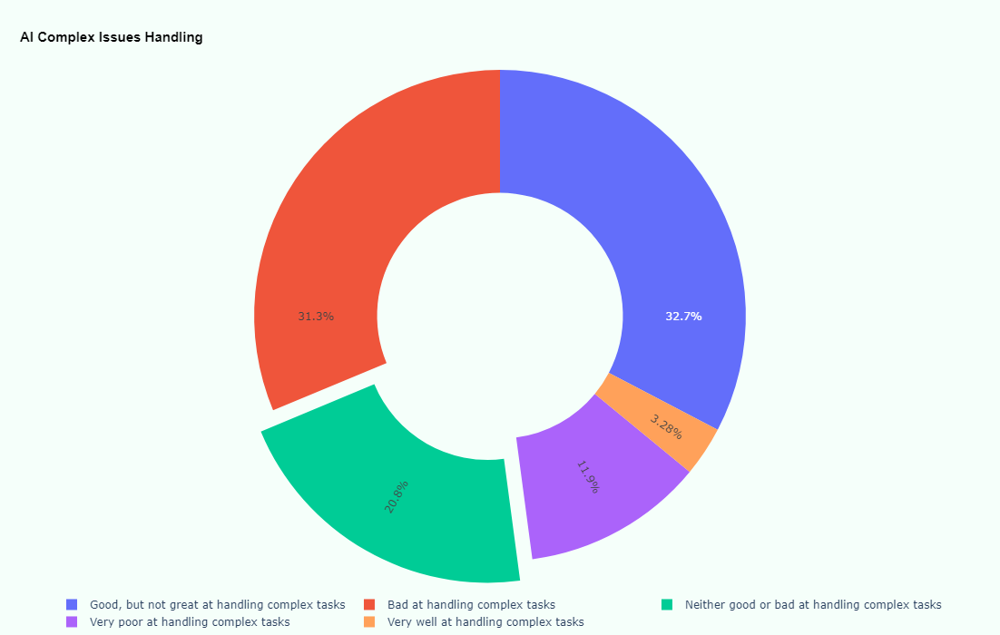

In [126]:
labels = ai_complex_issues_handling.index
values = ai_complex_issues_handling['count']

doughtnut_plot(labels, values, hole=0.5, pull_section=2, offset=0.1, ch_title='AI Complex Issues Handling', width=1100, height=700)


#####  AI in handling complex tasks in development workflow in various industries.

In [127]:

complex_task_handling = percentages_pivoted_by_column(
    data_frame=df, data_frame_columns=['Industry','AIComplex'],
    grouping_columns=['Industry','AIComplex']
) 
complex_task_handling

,% Bad at handling complex tasks,"% Good, but not great at handling complex tasks",% Neither good or bad at handling complex tasks,% Very poor at handling complex tasks,% Very well at handling complex tasks
Industry,,,,,
Banking/Financial Services,32.22,30.41,21.26,13.14,2.96
Computer Systems Design and Services,29.09,32.54,21.98,12.28,4.09
Energy,34.76,26.50,19.94,14.25,4.56
Fintech,34.99,31.06,19.08,12.82,2.06
Government,30.10,35.26,18.35,10.52,5.77
Healthcare,33.58,31.49,20.66,12.67,1.60
Higher Education,34.18,30.08,21.29,11.72,2.73
Insurance,34.36,28.19,22.03,11.89,3.52
"Internet, Telecomm or Information Services",33.30,31.20,20.50,12.90,2.10


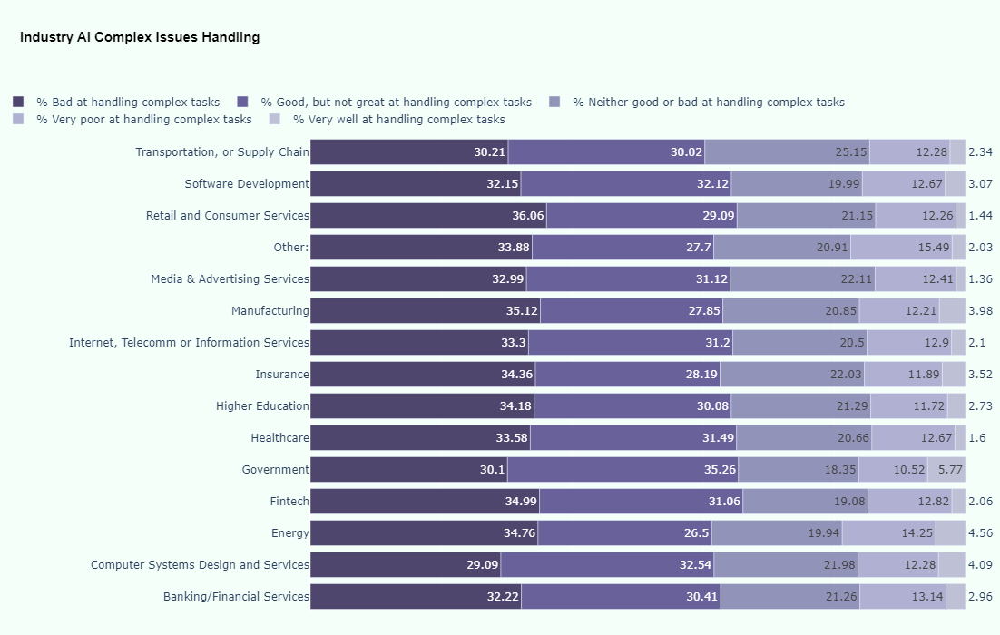

In [128]:
data_frame = complex_task_handling
ch_title= 'Industry AI Complex Issues Handling'

make_plotly_horizontal_stacked_bars_from_df(data_frame, ch_title)

#### Which AI-powered search and developer tools did you use regularly over the past year, and which do you want to work with over the next year?

In [129]:

data_frame = df	

data_frame_columns = ['MainBranch', 'AISearchDevHaveWorkedWith', 'AISearchDevWantToWorkWith', 'AISearchDevAdmired']

new_columns_names = [
    '% AI Search Worked With',
    '% AI Search Want to Worked With',
    '% AI Search Admired'
]

respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

ai_search_combined_result = get_multi_index_perce_combined_category_dfs(data_frame, data_frame_columns, new_columns_names)


In [130]:
ai_search_combined_result

Professional Developer  \
                          % AI Search Worked With   
ChatGPT                                     84.99   
GitHub Copilot                              46.04   
Google Gemini                               23.46   
Bing AI                                     14.66   
Visual Studio Intellicode                   14.22   
Claude                                       8.06   
Codeium                                      5.99   
Perplexity AI                                5.14   
Tabnine                                      5.05   
WolframAlpha                                 4.70   
Phind                                        3.83   
Meta AI                                      2.92   
Amazon Q                                     2.84   
Cody                                         1.35   
You.com                                      1.19   
OpenAI Codex                                 1.11   
Whispr AI                                    0.96   
Snyk Code                                    0.89   
Quora Poe                                    0.73   
Lightning AI                                 0.25   
Replit Ghostwriter                           0.25   
AskCodi                                      0.22   
Andi                                         0.15   
Neeva AI                                     0.13   
Metaphor                                     0.12   

                                                                               \
                          % AI Search Want to Worked With % AI Search Admired   
ChatGPT                                             77.85               78.98   
GitHub Copilot                                      52.62               41.48   
Google Gemini                                       24.59               18.08   
Bing AI                                             10.04                9.41   
Visual Studio Intellicode                           14.57               12.87   
Claude                                               9.77                6.29   
Codeium                                              6.17                4.99   
Perplexity AI                                        5.38                4.03   
Tabnine                                              2.85                2.21   
WolframAlpha                                         4.71                3.76   
Phind                                                3.06                2.81   
Meta AI                                              4.34                2.00   
Amazon Q                                             2.91                1.65   
Cody                                                 1.22                0.83   
You.com                                              0.85                0.62   
OpenAI Codex                                         1.95                0.73   
Whispr AI                                            1.29                0.61   
Snyk Code                                            1.03                0.56   
Quora Poe                                            0.60                0.44   
Lightning AI                                         0.52                0.19   
Replit Ghostwriter                                   0.33                0.11   
AskCodi                                              0.30                0.11   
Andi                                                 0.19                0.09   
Neeva AI                                             0.20                0.07   
Metaphor                                             0.24                0.09   

                                 Learning to Code  \
                          % AI Search Worked With   
ChatGPT                                     89.82   
GitHub Copilot                              31.66   
Google Gemini                               36.96   
Bing AI                                     26.43   
Visual Studio Intellicode                   14.11   
Claude                              

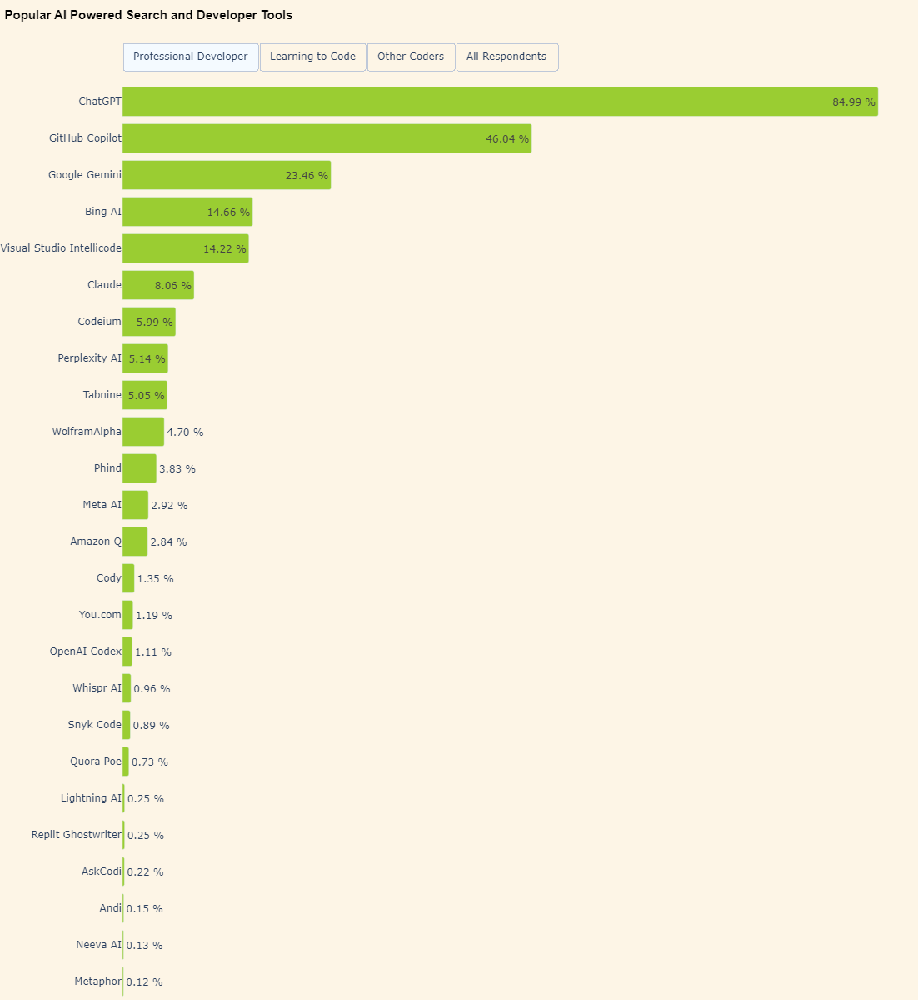

In [131]:
plot_multi_indexed_df(
    ai_search_combined_result, worked_with_col='% AI Search Worked With', ch_title="Popular AI Powered Search and Developer Tools",
    height=1200, width=1100,
    plot_bgcolor="oldlace", paper_bgcolor="oldlace", marker_color='yellowgreen'
)

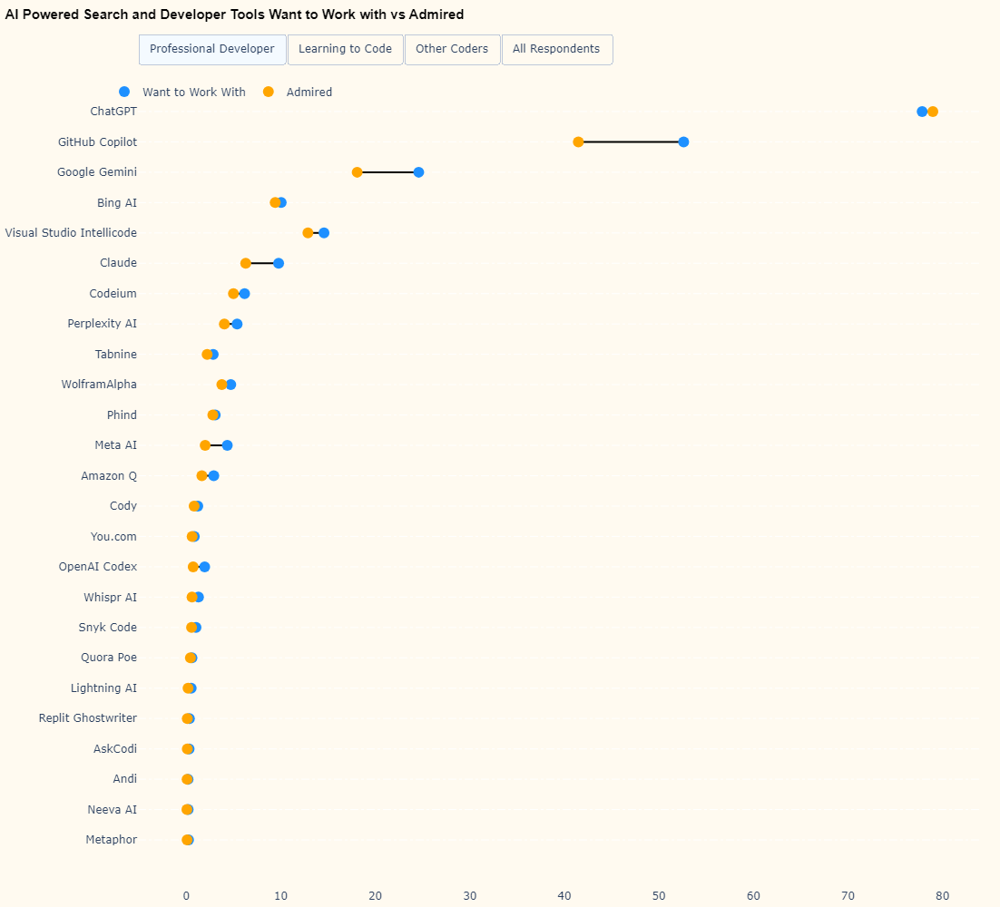

In [132]:
data_frame = ai_search_combined_result 

plot_dumbels_from_multi_index_df(data_frame,ch_title='AI Powered Search and Developer Tools Want to Work with vs Admired', paper_bgcolor='floralwhite', height=1000)

#### Which parts of your development workflow are you currently using AI tools for and which are you interested in using AI tools for over the next year?

In [133]:

data_frame = df	

data_frame_columns = ['MainBranch','AIToolCurrently Using', 'AIToolInterested in Using', 'AIToolNot interested in Using']

new_columns_names = [
    '% AI Tool Currently Using',
    '% AI Tool Interested in Using',
    '% AI Tool Not Interested in Using'
]

respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

ai_tools_comb_report = get_multi_index_perce_combined_category_dfs(data_frame, data_frame_columns, new_columns_names)

ai_tools_comb_report

Professional Developer  \
                                     % AI Tool Currently Using   
Writing code                                             84.76   
Search for answers                                       68.92   
Debugging and getting help                               56.74   
Documenting code                                         42.43   
Generating content or synthetic data                     36.41   
Learning about a codebase                                30.36   
Testing code                                             29.65   
Committing and reviewing code                            12.96   
Project planning                                         11.31   
Predictive analytics                                      4.90   
Deployment and monitoring                                 4.32   
Other (please specify):                                   1.16   

                                                                    \
                                     % AI Tool Interested in Using   
Writing code                                                 10.36   
Search for answers                                           21.01   
Debugging and getting help                                   31.62   
Documenting code                                             44.48   
Generating content or synthetic data                         39.10   
Learning about a codebase                                    48.82   
Testing code                                                 54.14   
Committing and reviewing code                                49.03   
Project planning                                             36.26   
Predictive analytics                                         47.83   
Deployment and monitoring                                    47.74   
Other (please specify):                                       0.83   

                                                                        \
                                     % AI Tool Not Interested in Using   
Writing code                                                      8.16   
Search for answers                                               11.93   
Debugging and getting help                                       13.80   
Documenting code                                                 17.77   
Generating content or synthetic data                             26.51   
Learning about a codebase                                        27.71   
Testing code                                                     22.99   
Committing and reviewing code                                    48.21   
Project planning                                                 64.64   
Predictive analytics                                             56.18   
Deployment and monitoring                                        58.97   
Other (please specify):                                           3.88   

                                              Learning to Code  \
                                     % AI Tool Currently Using   
Writing code                                             77.34   
Search for answers                                       72.81   
Debugging and getting help                               66.98   
Documenting code                                         32.97   
Generating content or synthetic data                     33.47   
Learning about a codebase                                42.08   
Testing code                                             24.30   
Committing and reviewing code                            22.61   
Project planning                                         22.31   
Predictive analytics                                      7.52   
Deployment and monitoring                                 7.12   
Other (please specify):                                   1.99   

                                                                    \
                                     % AI Tool Interested in Using   
Writing code                    

In [134]:

def two_tier_buttonns_hbar_multi_indexed_df(data_frame, ch_title, height=800, paper_bgcolor='floralwhite',btn_slice_index=9):

    groups = data_frame.columns.get_level_values(0).unique()
    cols = data_frame.columns.get_level_values(1).unique()
    
    fig = go.Figure()
    
    # Add traces for each group and column
    for group in groups:
        for col in cols:
            fig.add_trace(
                go.Bar(
                    x=data_frame[group][col][::-1],
                    y=data_frame.index[::-1],
                    orientation='h',
                    text=data_frame[group][col][::-1],
                    texttemplate='%{text:.2f}%',
                    textposition='auto',
                    hovertemplate=(
                        f"<i>Category</i>: {group}<br>" +
                        f"<i>Status</i>: {col[btn_slice_index:]}<br>" +
                        "<i>AI Tool</i>: %{y}<br>" +
                        "<i>Percentage</i>: %{x:.2f}%<extra></extra>"
                    ),
                    name=f'{group} - {col[btn_slice_index:]}',
                    marker=dict(color='dodgerblue',cornerradius=2.5),
                    visible=False  # Initially hide all traces
                )
            )
    
    # Initially, show only the first group and column
    fig.data[0].visible = True
    
    # Track the selected group and column
    selected_group = groups[0]
    selected_col = cols[0][btn_slice_index:]
    
    # Function to update visibility based on the selected group and column
    def update_visibility(selected_group, selected_col):
        visibility = []
        for trace in fig.data:
            trace_group, trace_col = trace.name.split(' - ')
            visibility.append(trace_group == selected_group and trace_col == selected_col)
        return visibility
    
    # Create buttons for the top tier (groups)
    group_buttons = []
    for group in groups:
        group_buttons.append(dict(
            label=group,
            method="update",
            args=[{"visible": update_visibility(group, selected_col)},]  # Update visibility based on group and selected column
        ))
    
    # Create buttons for the bottom tier (cols)
    col_buttons = []
    for col in cols:
        col_buttons.append(dict(
            label=col[btn_slice_index:],  # Adjust the label to match the naming scheme
            method="update",
            args=[{"visible": update_visibility(selected_group, col[btn_slice_index:])},]  # Update visibility based on selected group and column
        ))
    
    # Add the two tiers of buttons
    fig.update_layout(
        updatemenus=[
            dict(
                buttons=group_buttons,
                direction="right",
                pad={"r": 10, "t": 10},
                showactive=True,
                type='buttons',
                x=0.0,  # Adjust the x position if needed
                xanchor="left",
                y=1.09,  # Adjust the y position if needed
                yanchor="bottom"
            ),
            dict(
                buttons=col_buttons,
                direction="right",
                pad={"r": 10, "t": 10},
                showactive=True,
                type='buttons',
                x=0.0,  # Adjust the x position if needed
                xanchor="left",
                y=1.005,  # Adjust the y position if needed
                yanchor="bottom"
            )
        ],
        margin=dict(t=150, b=10, l=0,r=0),
        height=800,
        width=1100,
        plot_bgcolor=paper_bgcolor,
        paper_bgcolor=paper_bgcolor
    )
    # Update the title
    fig.update_layout(
        title={
            'text':ch_title,  # Title text
            'y': 0.990,  # Vertical position
            'x': 0.005,  # Horizontal position (centered)
            'xanchor': 'left',  # X anchor position
            'yanchor': 'top',  # Y anchor position
            'font': {'size': 15, 'color': 'black', 'family': 'sans-serif', 'weight': 'bold'},  # Bold title
        }
    )
    
    fig.show()

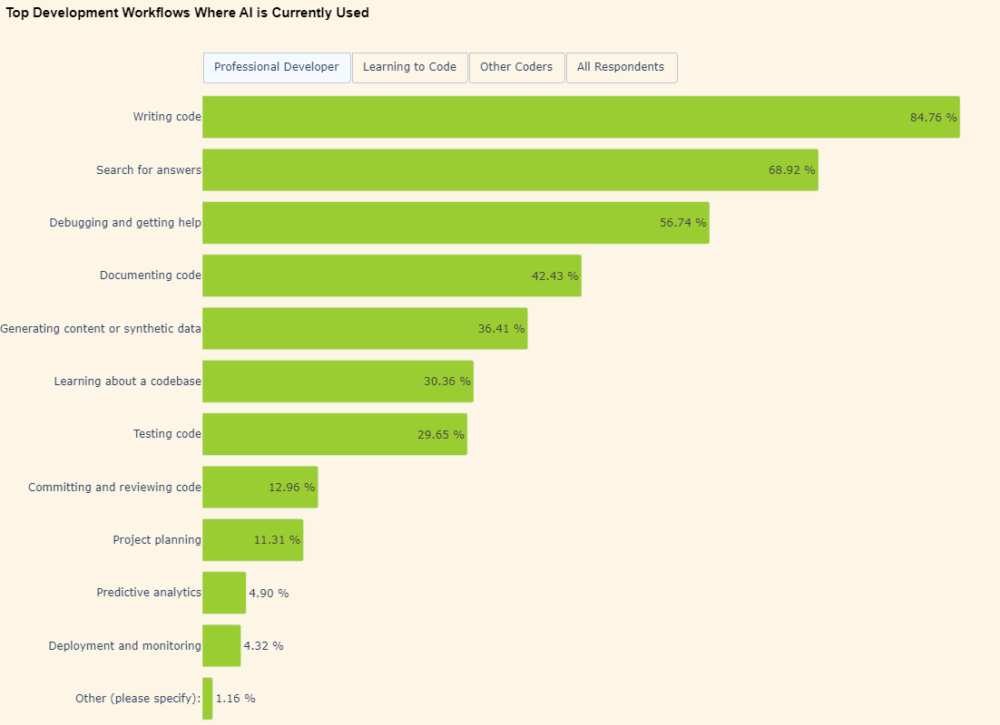

In [135]:
plot_multi_indexed_df(
    ai_tools_comb_report, worked_with_col='% AI Tool Currently Using', ch_title="Top Development Workflows Where AI is Currently Used",
    height=800, width=1100,
    plot_bgcolor="oldlace", paper_bgcolor="oldlace", marker_color='yellowgreen'
)

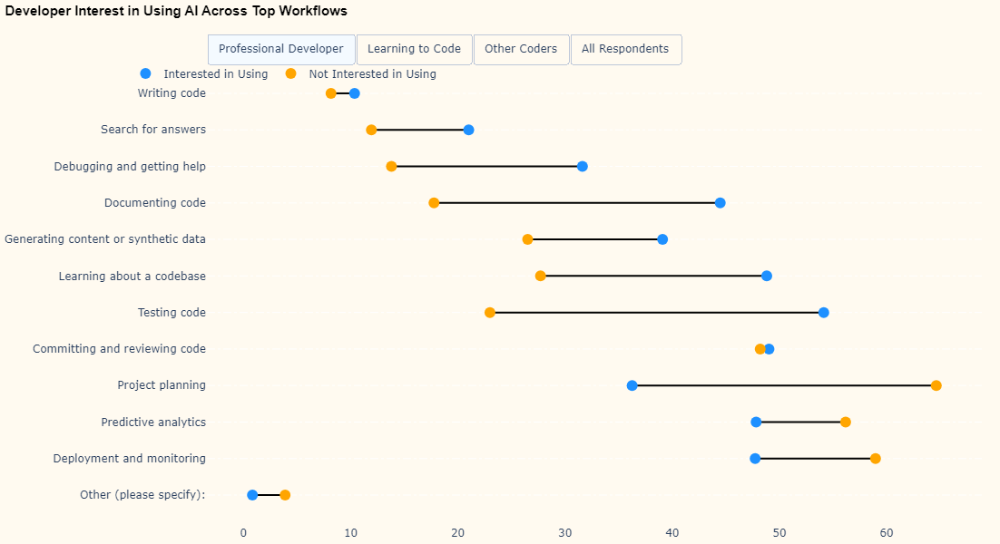

In [136]:
data_frame=ai_tools_comb_report
ch_title="Developer Interest in Using AI Across Top Workflows"

plot_dumbels_from_multi_index_df(data_frame, ch_title, height=600, paper_bgcolor='floralwhite', want_to="Interested in Using", admired="Not Interested in Using")

#### Do you believe AI is a threat to your current job?

In [137]:

data_frame = df
data_frame_columns = ['MainBranch', 'AIThreat']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

ai_threat = get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)


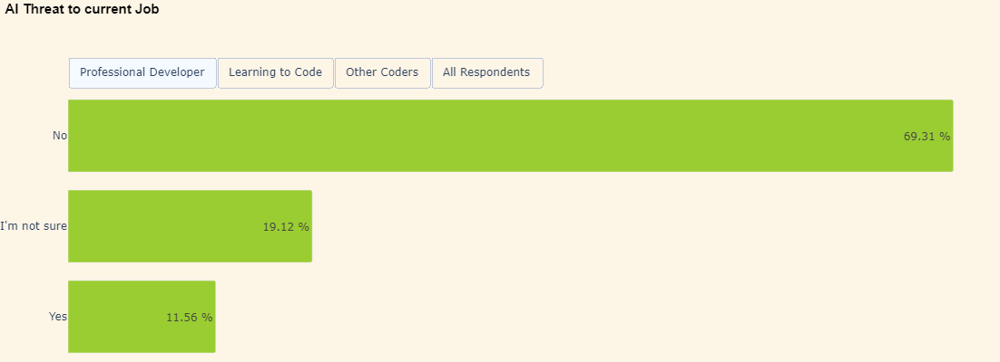

In [138]:
plot_multi_indexed_df(
    ai_threat, worked_with_col='% of No Respondents', ch_title="AI Threat to current Job",
    height=400, width=1100,
    plot_bgcolor="oldlace", paper_bgcolor="oldlace", marker_color='yellowgreen')

In [139]:
ai_job_threat = df['AIThreat'].dropna().value_counts().to_frame()
ai_job_threat

,count
AIThreat,
No,30423
I'm not sure,8878
Yes,5388


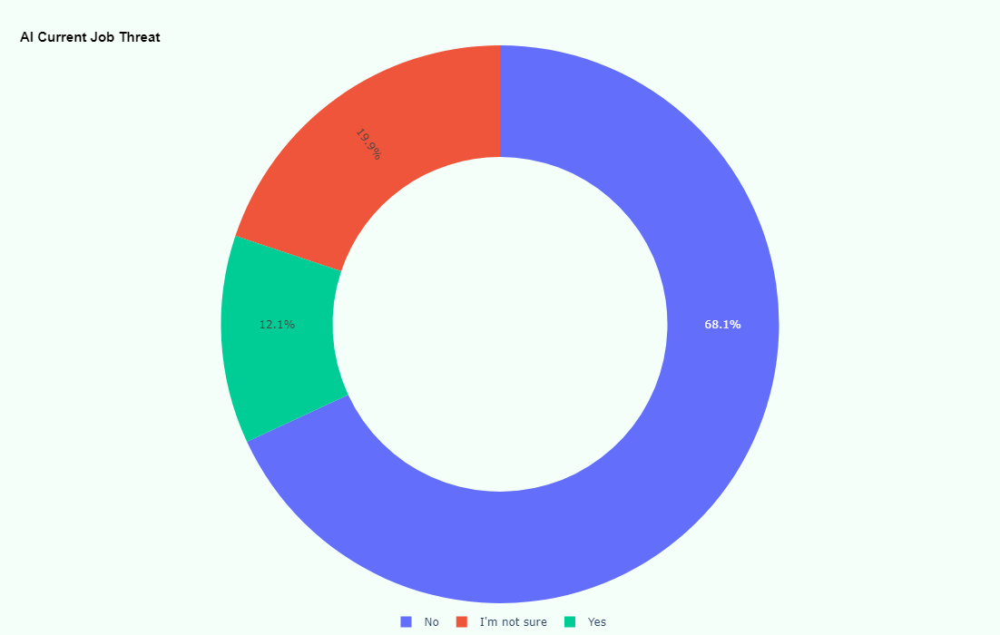

In [140]:
labels = ai_job_threat.index
values = ai_job_threat['count']

doughtnut_plot(labels, values, hole=0.6, pull_section=2, offset=0, ch_title='AI Current Job Threat', width=1100, height=700)

##### AI Threat Response in Various Industries

In [141]:
AI_threat_per_industry = percentages_pivoted_by_column(
    data_frame=df, data_frame_columns=['Industry', 'AIThreat'],
    grouping_columns=['Industry', 'AIThreat']
) 
AI_threat_per_industry

,% I'm not sure,% No,% Yes
Industry,,,
Banking/Financial Services,16.46,73.78,9.76
Computer Systems Design and Services,16.39,73.24,10.37
Energy,18.60,72.56,8.84
Fintech,19.43,68.63,11.94
Government,16.62,73.78,9.60
Healthcare,16.63,72.62,10.75
Higher Education,16.43,74.64,8.93
Insurance,17.17,70.71,12.12
"Internet, Telecomm or Information Services",18.07,71.41,10.52


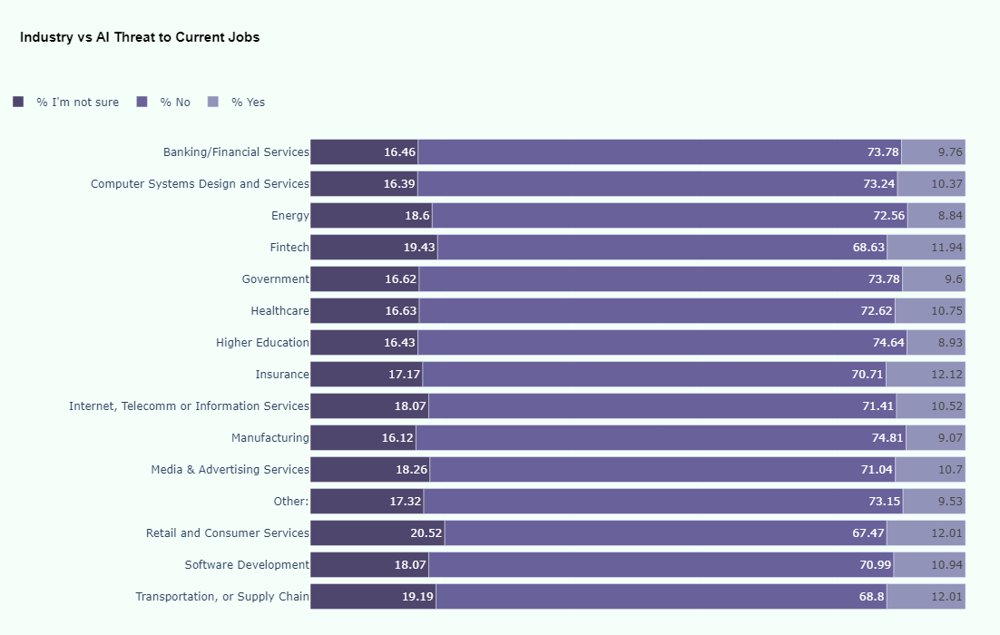

In [142]:
data_frame = AI_threat_per_industry[::-1]
ch_title= 'Industry vs AI Threat to Current Jobs'

make_plotly_horizontal_stacked_bars_from_df(data_frame, ch_title)

##### AI Threat and Age

In [143]:
AI_threat_per_age_group = percentages_pivoted_by_column(
    data_frame=df, data_frame_columns=['Age', 'AIThreat'],
    grouping_columns=['Age', 'AIThreat']
) 


In [144]:
# sorting the age index
index_order = ['Under 18 years old','18-24 years old','25-34 years old','35-44 years old','45-54 years old','55-64 years old','65 years or older',
               'Prefer not to say']

AI_threat_per_age_group = sort_categorical_index(AI_threat_per_age_group, index_order)
AI_threat_per_age_group

,% I'm not sure,% No,% Yes
Age,,,
Under 18 years old,24.44,61.09,14.47
18-24 years old,23.53,63.45,13.03
25-34 years old,18.98,69.45,11.57
35-44 years old,19.18,68.79,12.03
45-54 years old,17.65,70.14,12.22
55-64 years old,13.79,77.45,8.76
65 years or older,12.40,78.55,9.04
Prefer not to say,27.52,55.03,17.45


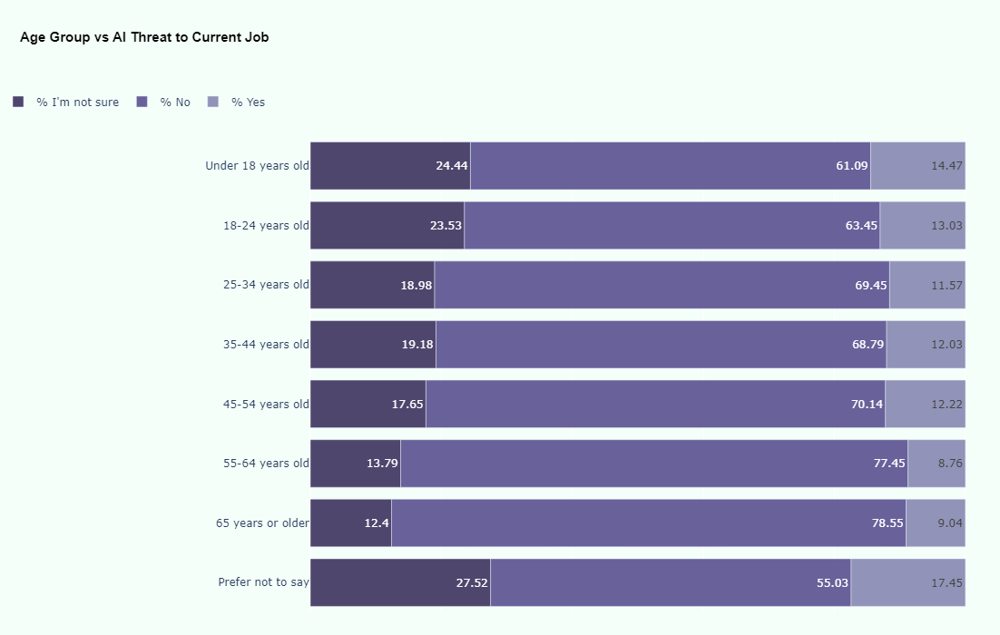

In [145]:
data_frame = AI_threat_per_age_group[::-1]
ch_title= 'Age Group vs AI Threat to Current Job'

make_plotly_horizontal_stacked_bars_from_df(data_frame, ch_title)

#### Which AI ethical responsibilities are most important to you?

In [146]:

data_frame = df
data_frame_columns = ['MainBranch', 'AIEthics']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

all_responses_on_ethics =  get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
all_responses_on_ethics

Professional Developer  \
                                                           No Respondents   
                                                                            
Circulating misinformation or disinformation                        26031   
Missing or incorrect attribution for sources of...                  21107   
Biased results that do not represent diverse vi...                  16170   
Imitating a person's likeness                                       12407   
Energy demand                                                       11898   
Replacing jobs without options for new employme...                  10908   
Other (please specify):                                              2094   

                                                                        \
                                                   % of No Respondents   
                                                                         
Circulating misinformation or disinformation                     80.03   
Missing or incorrect attribution for sources of...               64.89   
Biased results that do not represent diverse vi...               49.72   
Imitating a person's likeness                                    38.15   
Energy demand                                                    36.58   
Replacing jobs without options for new employme...               33.54   
Other (please specify):                                           6.44   

                                                   Learning to Code  \
                                                     No Respondents   
                                                                      
Circulating misinformation or disinformation                   1701   
Missing or incorrect attribution for sources of...             1423   
Biased results that do not represent diverse vi...             1213   
Imitating a person's likeness                                   822   
Energy demand                                                   680   
Replacing jobs without options for new employme...             1028   
Other (please specify):                                         115   

                                                                        \
                                                   % of No Respondents   
                                                                         
Circulating misinformation or disinformation                     70.52   
Missing or incorrect attribution for sources of...               59.00   
Biased results that do not represent diverse vi...               50.29   
Imitating a person's likeness                                    34.08   
Energy demand                                                    28.19   
Replacing jobs without options for new employme...               42.62   
Other (please specify):                                           4.77   

                                                     Other Coders  \
                                                   No Respondents   
                                                                    
Circulating misinformation or disinformation                 5201   
Missing or incorrect attribution for sources of...           4306   
Biased results that do not represent diverse vi...           3383   
Imitating a person's likeness                                2446   
Energy demand                                                2308   
Replacing jobs without options for new employme...           2238   
Other (please specify):                                       450   

                                                                        \
                                                   % of No Respondents   
                                                                         
Circulating misinformation or disinformation                     78.67   
Missing or incorrect attribution for sources of...               65.13   
Biased results that do not

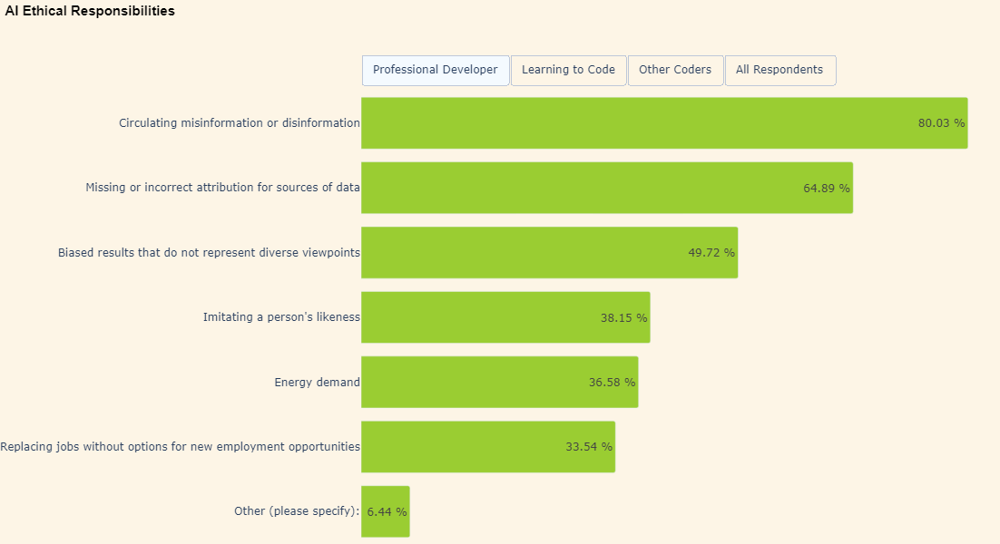

In [147]:
plot_multi_indexed_df(
    all_responses_on_ethics, worked_with_col='% of No Respondents', ch_title="AI Ethical Responsibilities",
    height=600, width=1100,
    plot_bgcolor="oldlace", paper_bgcolor="oldlace", marker_color='yellowgreen'
)

#### What are the challenges to your company/whole team using AI code assistants or GenAI tools?

In [148]:

data_frame = df
data_frame_columns = ['MainBranch', 'AIChallenges']
report_headers = ['', 'No Respondents']
respondents_categories = ['Professional Developer', 'Learning to Code', 'Other Coders', 'All Respondents']

all_responses_on_challenges =  get_multi_indexed_response_perce_cat(data_frame, data_frame_columns, report_headers, respondents_categories)
all_responses_on_challenges

Professional Developer  \
                                                           No Respondents   
                                                                            
Don’t trust the output or answers                                   19733   
AI tools lack context of codebase,  internal ar...                  19177   
We don’t have the right policies in place to re...                   9953   
Lack of proper training and education on new tools                   9148   
Not everyone uses them                                               7676   
They create more work (more code/PRs to review,...                   3962   
Lack of executive buy-in                                             3605   
Other (please specify):                                              1861   

                                                                        \
                                                   % of No Respondents   
                                                                         
Don’t trust the output or answers                                65.38   
AI tools lack context of codebase,  internal ar...               63.54   
We don’t have the right policies in place to re...               32.98   
Lack of proper training and education on new tools               30.31   
Not everyone uses them                                           25.43   
They create more work (more code/PRs to review,...               13.13   
Lack of executive buy-in                                         11.94   
Other (please specify):                                           6.17   

                                                   Learning to Code  \
                                                     No Respondents   
                                                                      
Don’t trust the output or answers                              1082   
AI tools lack context of codebase,  internal ar...              958   
We don’t have the right policies in place to re...              492   
Lack of proper training and education on new tools              697   
Not everyone uses them                                          474   
They create more work (more code/PRs to review,...              359   
Lack of executive buy-in                                        181   
Other (please specify):                                         100   

                                                                        \
                                                   % of No Respondents   
                                                                         
Don’t trust the output or answers                                59.22   
AI tools lack context of codebase,  internal ar...               52.44   
We don’t have the right policies in place to re...               26.93   
Lack of proper training and education on new tools               38.15   
Not everyone uses them                                           25.94   
They create more work (more code/PRs to review,...               19.65   
Lack of executive buy-in                                          9.91   
Other (please specify):                                           5.47   

                                                     Other Coders  \
                                                   No Respondents   
                                                                    
Don’t trust the output or answers                            3635   
AI tools lack context of codebase,  internal ar...           3090   
We don’t have the right policies in place to re...           1747   
Lack of proper training and education on new tools           1998   
Not everyone uses them                                       1300   
They create more work (more code/PRs to review,...            854   
Lack of executive buy-in                                      547   
Other (please specify):                                       386   

                               

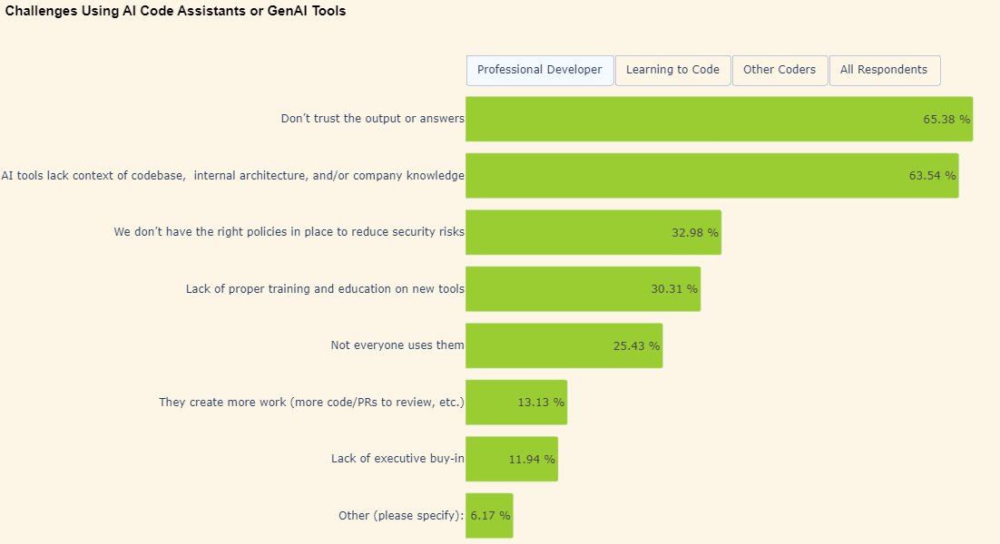

In [149]:
plot_multi_indexed_df(
    all_responses_on_challenges, worked_with_col='% of No Respondents', ch_title="Challenges Using AI Code Assistants or GenAI Tools",
    height=600, width=1100,
    plot_bgcolor="oldlace", paper_bgcolor="oldlace", marker_color='yellowgreen'
)

### Organisation size and the current developers' work station

In [150]:
org_size_order = [
    'Just me - I am a freelancer, sole proprietor, etc.',
    '2 to 9 employees',
    '10 to 19 employees',
    '20 to 99 employees',
    '100 to 499 employees',
    '500 to 999 employees',
    '1,000 to 4,999 employees',
    '5,000 to 9,999 employees',
    '10,000 or more employees',
    'I don’t know'
]
    

In [151]:

data_frame = df
data_frame_columns = ['MainBranch', 'OrgSize']
report_headers=[' ', 'No Respondents']

respondents_org_size = get_response_count_with_percentages(data_frame, data_frame_columns, report_headers, category_filter='All Respondents').head(10)

all_respondents_org_size = sort_categorical_index(respondents_org_size, org_size_order)

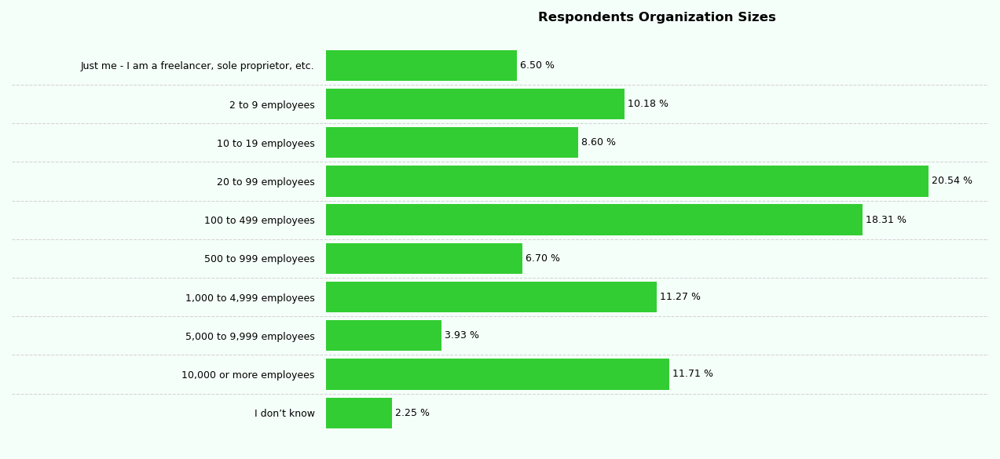

In [152]:
x_values = all_respondents_org_size.index[::-1]
y_values = all_respondents_org_size['% of No Respondents'].iloc[::-1]
# bar_color='dodgerblue'

create_custom_barh(x_values, y_values, ch_title="Respondents Organization Sizes", figsize=(8,4), face_color='mintcream', bar_color='limegreen')

In [153]:
organisation_size_workstation = percentages_pivoted_by_column(
    data_frame=df, data_frame_columns=['OrgSize','RemoteWork'], grouping_columns=['OrgSize','RemoteWork']
) 


In [154]:
organisation_size_workstation = organisation_size_workstation=sort_categorical_index(organisation_size_workstation, org_size_order)
organisation_size_workstation

,"% Hybrid (some remote, some in-person)",% In-person,% Remote
OrgSize,,,
"Just me - I am a freelancer, sole proprietor, etc.",25.20,6.71,68.09
2 to 9 employees,32.76,21.72,45.52
10 to 19 employees,35.26,25.19,39.55
20 to 99 employees,39.93,23.38,36.69
100 to 499 employees,44.04,18.35,37.61
500 to 999 employees,45.10,17.69,37.21
"1,000 to 4,999 employees",50.93,15.21,33.86
"5,000 to 9,999 employees",49.81,15.91,34.28
"10,000 or more employees",55.59,13.30,31.11


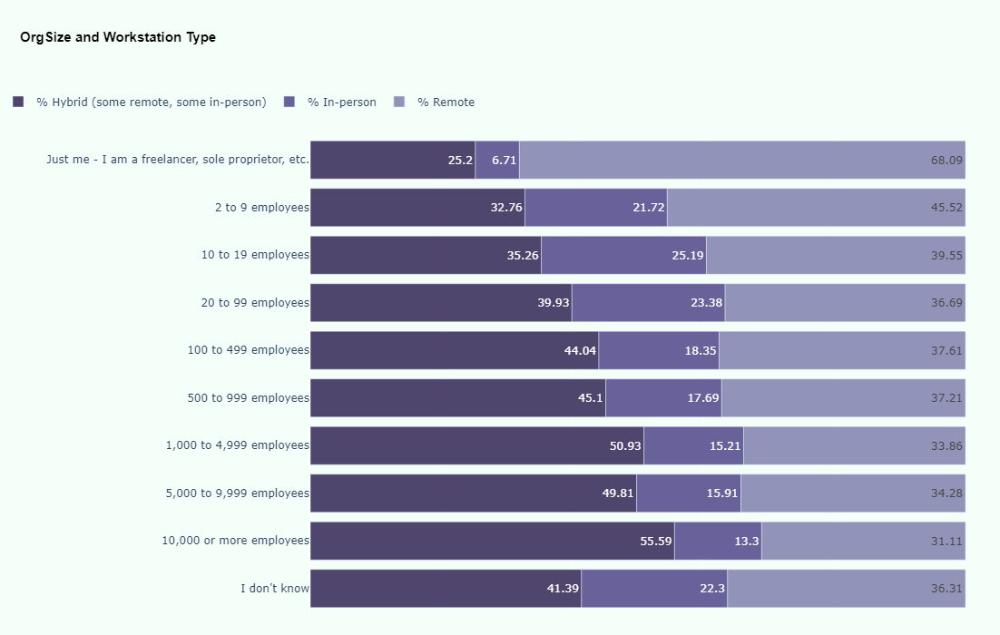

In [155]:
data_frame = organisation_size_workstation[::-1]
ch_title= 'OrgSize and Workstation Type'

make_plotly_horizontal_stacked_bars_from_df(data_frame, ch_title)

### Compensation Related Analysis

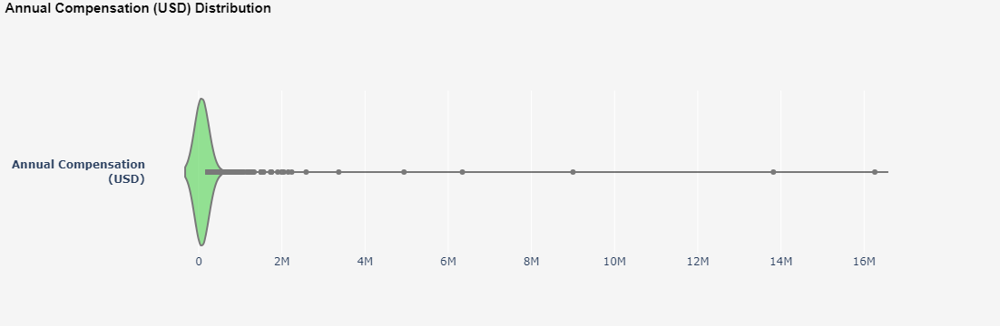

In [156]:
fig = go.Figure(data=go.Violin(x=df['ConvertedCompYearly'], box_visible=False, line_color='black', meanline_visible=False,
                               fillcolor='limegreen', opacity=0.5, orientation='h', y0="<b>Annual Compensation<br>(USD)</b>", width=1100 ))

fig.update_layout(xaxis_zeroline=False, plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke",
                 title={
        'text': 'Annual Compensation (USD) Distribution',  # Title text underlined
        'y': 0.990,  # Vertical position
        'x': 0.005,  # Horizontal position (centered)
        'xanchor': 'left',  # X anchor position
        'yanchor': 'top',  # Y anchor position
        'font': {'size': 15, 'color': 'black', 'family': 'sans-serif', 'weight': 'bold'},  # Bold title
    })

fig.show()

##### Details of Outliers.

In [157]:
'''
Getting the Developer who earned more than a million dollars per year.
Their education level, years of coding as a pro, workstation,country, developer type and their industry.
'''

df.loc[
df['ConvertedCompYearly'] >1000000,
['EdLevel','YearsCodePro','RemoteWork','Country', 'DevType','Industry', 'ConvertedCompYearly']
].sort_values(
    by='ConvertedCompYearly', ascending=False
).reset_index(drop=True)


,EdLevel,YearsCodePro,RemoteWork,Country,DevType,Industry,ConvertedCompYearly
0,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",5,In-person,Ethiopia,Project manager,NaN,16256603.0
1,"Professional degree (JD, MD, Ph.D, Ed.D, etc.)",10,"Hybrid (some remote, some in-person)",South Africa,"Senior Executive (C-Suite, VP, etc.)",Media & Advertising Services,13818022.0
2,"Professional degree (JD, MD, Ph.D, Ed.D, etc.)",7,"Hybrid (some remote, some in-person)",Taiwan,Hardware Engineer,Computer Systems Design and Services,9000000.0
3,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",13,Remote,Brazil,"Developer, back-end",Software Development,6340564.0
4,"Professional degree (JD, MD, Ph.D, Ed.D, etc.)",11,Remote,Ukraine,"Developer, mobile",Software Development,4936778.0
5,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",7,In-person,India,"Developer, front-end",Other:,3367716.0
6,"Professional degree (JD, MD, Ph.D, Ed.D, etc.)",5,Remote,Pakistan,"Developer, desktop or enterprise applications",NaN,2584118.0
7,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",5,Remote,Brazil,"Developer, full-stack",NaN,2237846.0
8,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",2,In-person,Pakistan,"Developer, front-end",Software Development,2153432.0
9,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",12,Remote,Australia,"Developer, full-stack",Media & Advertising Services,2048046.0


##### Outliers Trimmed

In [158]:
compensation_without_outliers_df = df.loc[df['ConvertedCompYearly'] <1000000, 'ConvertedCompYearly'].dropna().to_frame().reset_index(drop=True)


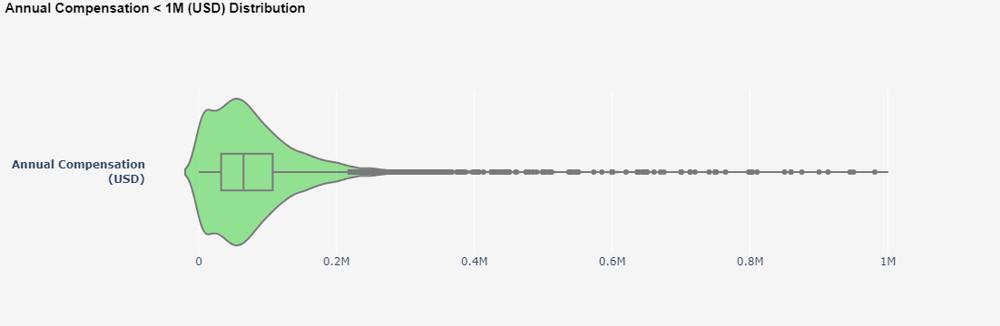

In [159]:
fig = go.Figure(data=go.Violin(x=compensation_without_outliers_df['ConvertedCompYearly'], box_visible=True, line_color='black', meanline_visible=False,
                               fillcolor='limegreen', opacity=0.5, orientation='h', y0="<b>Annual Compensation<br>(USD)</b>", width=1100 ))

fig.update_layout(xaxis_zeroline=False, plot_bgcolor="whitesmoke", paper_bgcolor="whitesmoke",
                 title={
        'text': 'Annual Compensation < 1M (USD) Distribution',  # Title text underlined
        'y': 0.990,  # Vertical position
        'x': 0.005,  # Horizontal position (centered)
        'xanchor': 'left',  # X anchor position
        'yanchor': 'top',  # Y anchor position
        'font': {'size': 15, 'color': 'black', 'family': 'sans-serif', 'weight': 'bold'},  # Bold title
    })
fig.show()

In [160]:

def get_all_cats_grouped_median_df(data_frame, data_frame_columns, report_headers, respondents_categories):
    
    made_data_frame = make_data_frame(data_frame_columns, data_frame,)
    cleaned_data = clean_data(made_data_frame)
    
    cat_filtered_data_dfs = [get_category_of_interest(cleaned_data, category)
                              for category in respondents_categories]
    
    grouped_agg_mean_series = [(cat_filtered_data_df.groupby(cat_filtered_data_df.columns[1])[cat_filtered_data_df.columns[2]].median())
                               for cat_filtered_data_df in cat_filtered_data_dfs]
    
    grouped_data_dfs = [pd.DataFrame(grouped_data_item) for grouped_data_item in grouped_agg_mean_series]
    
    for df_item in grouped_data_dfs:
        df_item.index.name = report_headers[0]
    
    for df_item in grouped_data_dfs:
        df_item.columns = [report_headers[i] for i in range(1, len(report_headers))]
    
    return grouped_data_dfs
    

##### Highest Education Level and Median Annual Compensation

In [161]:
data_frame = df
data_frame_columns = ['MainBranch','EdLevel', 'ConvertedCompYearly']
report_headers = ['Highest Education Level','Median Annual Compensation']
respondents_categories = ['All Respondents','Professional Developer', 'Learning to Code', 'Other Coders']

All_cats = get_all_cats_grouped_median_df(data_frame, data_frame_columns, report_headers, respondents_categories)
All_cats[0].style.format('{:.1f}').bar(cmap='tab20c')

,Median Annual Compensation
Highest Education Level,
"Associate degree (A.A., A.S., etc.)",60147.0
"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",67129.0
"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",68203.0
Primary/elementary school,36088.0
"Professional degree (JD, MD, Ph.D, Ed.D, etc.)",79962.0
"Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)",45111.0
Some college/university study without earning a degree,59288.0
Something else,53793.0


##### Proffessional Experince and Median Annual Compensation.

In [162]:
data_frame = df
data_frame_columns = ['MainBranch','YearsCodePro', 'ConvertedCompYearly']
report_headers = ['Years Coding Proffessionally','Median Annual Compensation']
respondents_categories = ['All Respondents','Professional Developer', 'Learning to Code', 'Other Coders']
index_order = ['Less than 1 year']+[str(i) for i in range(1,51)]+['More than 50 years']

year_and_median_comp = get_all_cats_grouped_median_df(data_frame, data_frame_columns, report_headers, respondents_categories)
all_repsp_exp_comp = year_and_median_comp[0]
coding_experience_vs_median_salary_df = sort_categorical_index(all_repsp_exp_comp, index_order)
coding_experience_vs_median_salary_df.head(5)


,Median Annual Compensation
Years Coding Proffessionally,
Less than 1 year,21289.0
1,23302.5
2,30709.0
3,37592.0
4,45784.0


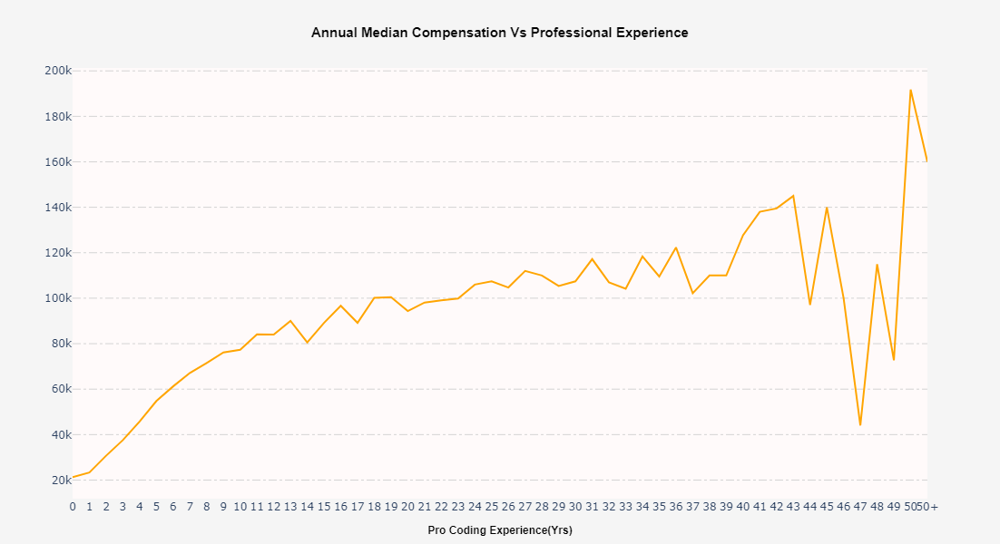

In [163]:
x=coding_experience_vs_median_salary_df.index
y=coding_experience_vs_median_salary_df['Median Annual Compensation']

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=x,
    y=y,
    line=dict(color='orange'),
    name="",
    hovertemplate=(
        "<i>Median Compensation(USD)</i>: %{y:,.1f}<br>" +
        "<i>Pro Experience(yrs)</i>: %{x}<extra></extra>")
))

fig.update_layout(
    paper_bgcolor="whitesmoke",plot_bgcolor='snow', 
    width=1100, height=600,
    margin=dict(t=75,b=50),
    xaxis=dict(showgrid=False, zeroline=False)
)

ticktext=list(range(51))+['50+']

fig.update_xaxes(
    title=dict(
        text='Pro Coding Experience(Yrs)',
        font=dict(size=12, family="sans-serif",color="black", weight="bold")
    ),
    tickvals=x,
    tickangle=0,
    ticktext=ticktext[:len(x)]
)

fig.update_layout(
    yaxis=dict(
        showgrid=True,           # Ensure that the grid is visible
        gridcolor='lightgray',    # Set the desired color for the horizontal grid lines
        gridwidth=1,              # Set the width of the grid lines
        griddash='dashdot'           # Make the grid lines dashed ('dash', 'dot', 'dashdot')
    )
)

fig.update_layout(
    title=dict(
        text="Annual Median Compensation Vs Professional Experience",  # Title text 
        y=0.950,  # Vertical position
        x=0.50,  # Horizontal position (centered)
        xanchor='center',  # X anchor position
        yanchor='top',  # Y anchor position
        font={'size': 15, 'color': 'black', 'family': 'sans-serif', 'weight': 'bold'},  # Bold title
    )
)

fig.show()


##### Programming, Scripting and Markup Language Worked with against Median Annual Compensation

In [164]:
# Get a array of languages worked with.
unique_lang_df = get_unique_column_items(data_frame=df, column_name='LanguageHaveWorkedWith', sep=';')


In [165]:
# Get language worked with annual median compensation data frame.

data_frame = df
analysis_columns = ['MainBranch','LanguageHaveWorkedWith','ConvertedCompYearly']
report_col = ['Technology', 'Median Annual Salary']
tech_list = unique_lang_df

lang_median_sal_df = median_yr_sal_per_tech(data_frame, analysis_columns, report_col, tech_list)

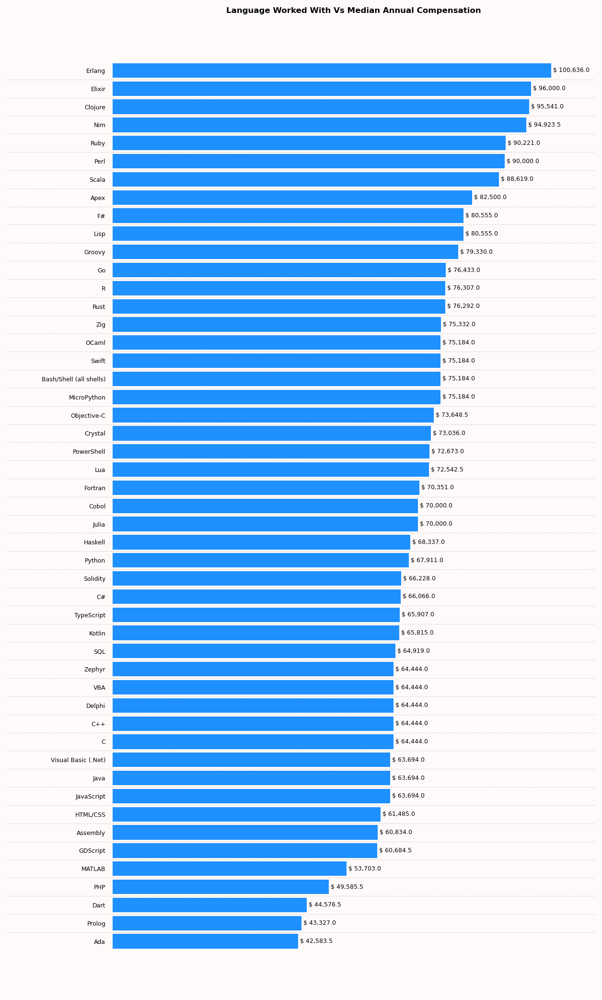

In [166]:
# Plot database worked with and median annual compensation horizontal bar chart

x_values = lang_median_sal_df.index
y_values = lang_median_sal_df['Median Annual Salary']
ch_title = 'Language Worked With Vs Median Annual Compensation'
# figsize = (7,5)

create_custom_barh(x_values, y_values, ch_title, figsize=(8,14), lab_txt_pre='$')

##### Databases Worked with against Median Annual Compensation

In [167]:
# Get a list of databases worked with.
unique_db_df = get_unique_column_items(data_frame=df, column_name='DatabaseHaveWorkedWith', sep=';')


In [168]:
# Get database worked with median annual compensation dataframe.

data_frame = df
analysis_columns = ['MainBranch','DatabaseHaveWorkedWith','ConvertedCompYearly']
report_col = ['Technology', 'Median Annual Salary']
tech_list = unique_db_df

db_median_annual_comp_df = median_yr_sal_per_tech(data_frame, analysis_columns, report_col, tech_list)

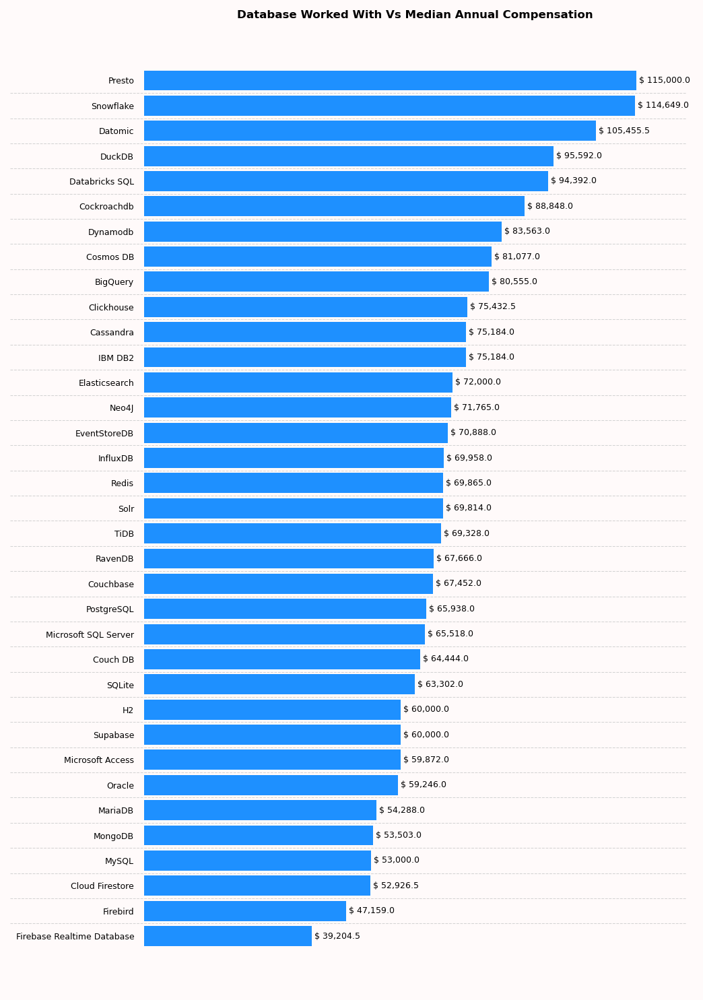

In [169]:
# Plot database worked with and median annual compensation horizontal bar chart

x_values = db_median_annual_comp_df.index
y_values = db_median_annual_comp_df['Median Annual Salary']
ch_title = 'Database Worked With Vs Median Annual Compensation'
# figsize = (7,5)

create_custom_barh(x_values, y_values, ch_title, figsize=(7,10), lab_txt_pre='$')


##### Cloud Platform Worked with Against Median Compesation

In [170]:
# Get a unique array list of cloud platforms worked with.
unique_cl_df = get_unique_column_items(data_frame=df, column_name='PlatformHaveWorkedWith', sep=';')


In [171]:
# Get Cloudplatform worked with and median salary data frame.

data_frame = df
analysis_columns = ['MainBranch','PlatformHaveWorkedWith','ConvertedCompYearly']
report_col = ['Technology', 'Median Annual Salary']
tech_list = unique_cl_df

cloud_platform_sal_df = median_yr_sal_per_tech(data_frame, analysis_columns, report_col, tech_list)

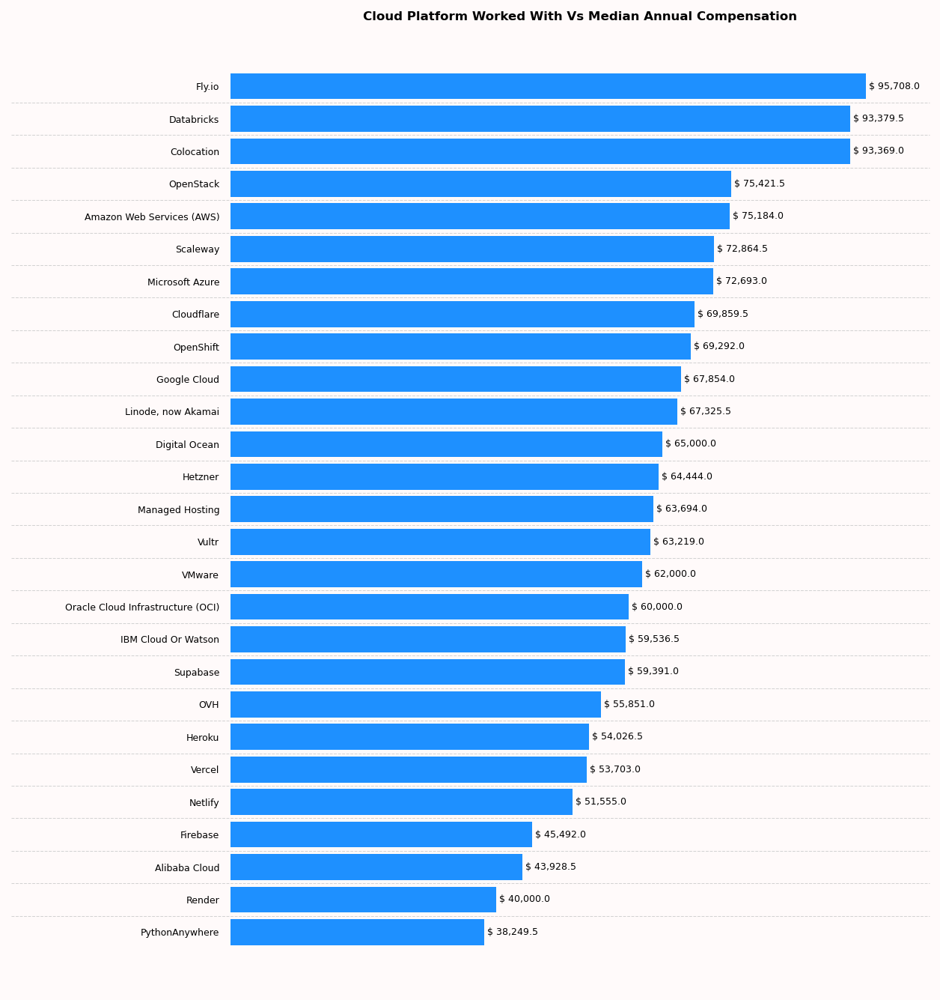

In [172]:
# Plot cloud platform worked with and median annual compensation horizontal bar chart.

x_values = cloud_platform_sal_df.index
y_values = cloud_platform_sal_df['Median Annual Salary']
ch_title = 'Cloud Platform Worked With Vs Median Annual Compensation'
# figsize = (7,5)

create_custom_barh(x_values, y_values, ch_title, figsize=(8,9), lab_txt_pre='$')


##### Developer against Median Annual Compensation

In [173]:
# Get Unique industries array.
unique_ind_df = get_unique_column_items(data_frame=df, column_name='Industry', sep=';')


In [174]:
# Get Industry median annual compensation data frame.
data_frame = df
analysis_columns = ['MainBranch','Industry','ConvertedCompYearly']
report_col = ['Industry', 'Median Annual Salary']
tech_list = unique_ind_df

industry_median_sal = median_yr_sal_per_tech(data_frame, analysis_columns, report_col, tech_list)


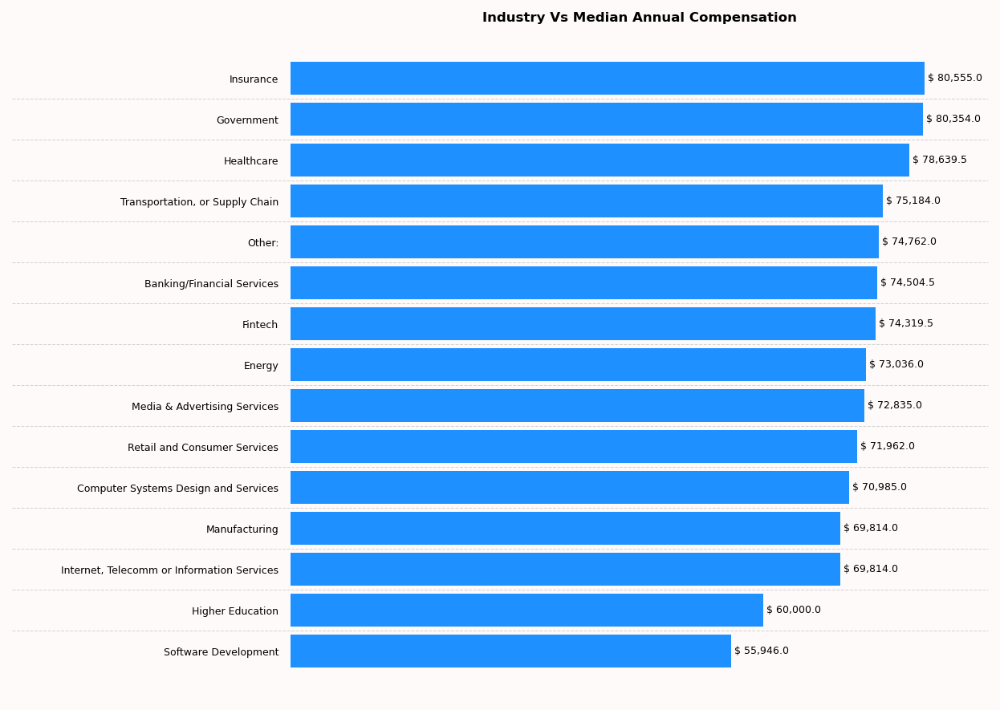

In [175]:
x_values = industry_median_sal.index
y_values = industry_median_sal['Median Annual Salary']
ch_title = 'Industry Vs Median Annual Compensation'
# figsize = (7,5)

create_custom_barh(x_values, y_values, ch_title, figsize=(8,6), lab_txt_pre='$')

##### Developer Type against Median Annual Compensation

In [176]:
# Get Developer type unique array.
unique_dev_type_df = get_unique_column_items(data_frame=df, column_name='DevType', sep=';')


In [177]:
# Get Developer type Annual median compensation data frame.

data_frame = df
analysis_columns = ['MainBranch','DevType','ConvertedCompYearly']
report_col = ['Developer Type', 'Median Annual Salary']
tech_list = unique_dev_type_df

devtype_median_sal = median_yr_sal_per_tech(data_frame, analysis_columns, report_col, tech_list)


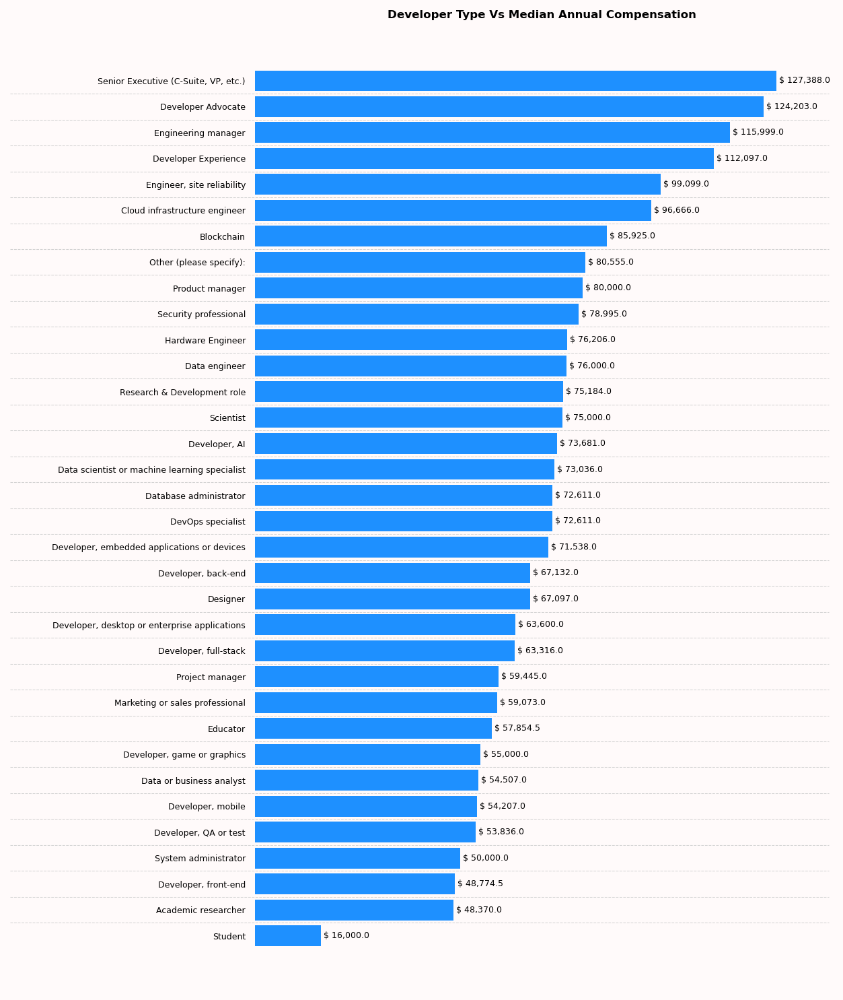

In [178]:
# Plot Developer type median annual compensation horizontal bar chart.

x_values = devtype_median_sal.index
y_values = devtype_median_sal['Median Annual Salary']
ch_title = 'Developer Type Vs Median Annual Compensation'
# figsize = (7,5)

create_custom_barh(x_values, y_values, ch_title, figsize=(8,10), lab_txt_pre='$')

##### Age against Median Annual Compensation

In [179]:
# Get the age groups.
unique_age_df = get_unique_column_items(data_frame=df, column_name='Age', sep=';')


In [180]:
# Get age group median annual compensation df.

data_frame = df
analysis_columns = ['MainBranch','Age','ConvertedCompYearly']
report_col = ['Age', 'Median Annual Salary']
tech_list = unique_age_df

age_median_salary_df = median_yr_sal_per_tech(data_frame, analysis_columns, report_col, tech_list)

index_order = ['Under 18 years old','18-24 years old','25-34 years old','35-44 years old','45-54 years old','55-64 years old','65 years or older',
               'Prefer not to say']

age_sal = sort_categorical_index(age_median_salary_df, index_order)


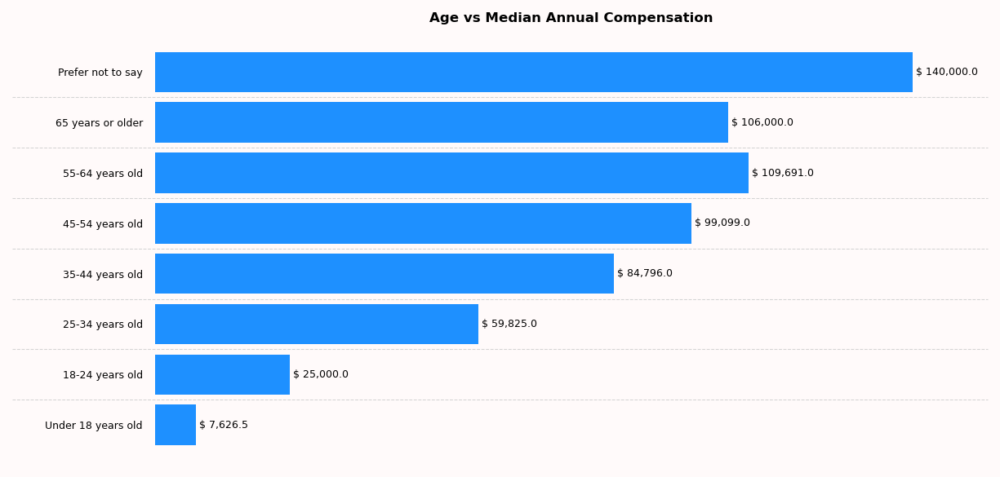

In [181]:
# plot Age Median Annual Compensation horizontal bar chart.

x_values = age_sal.index
y_values = age_sal[age_sal.columns[0]]
ch_title = 'Age vs Median Annual Compensation'
lab_txt_pre = '$'
figsize = (8, 4)

create_custom_barh(x_values, y_values, ch_title, lab_txt_pre, figsize)

##### Median Annual Compensation against Work Experience (All Devs, Python, Java, and C++ Developers)

In [182]:
dev_techs = ['All_Devs', 'Python', 'Java', 'C++']

In [183]:

bin_size = 5
max_val = max(cleaned_pro_years_code['YearsCodePro'])+bin_size

labels = ["{0} - {1} Years".format(i, i + bin_size - 1) for i in range(0, max_val - bin_size, bin_size)]
labels.append(f"{max_val-bin_size}+ Years")

data_frame = df
data_frame_columns = ['LanguageHaveWorkedWith', 'ConvertedCompYearly', 'WorkExp']

data = make_data_frame(data_frame_columns, data_frame)
cleaned_data = clean_data(data)

All_techs_and_median_sal = []
for dev_tech in dev_techs:
    if dev_tech == 'All_Devs':
        filtered_data = cleaned_data

    else:
        filtered_data = cleaned_data.loc[cleaned_data[cleaned_data.columns[0]].str.contains(dev_tech, regex=False)]

    with_gr_col = filtered_data.assign(
        Wrk_Exp_Groups = pd.cut(filtered_data['WorkExp'], bins=list(range(0, max_val, bin_size)) + [max_val], labels=labels, include_lowest=True, right=False)
        )
    groupped_df = with_gr_col.groupby('Wrk_Exp_Groups', observed=False)[data_frame_columns[1]].median()
    
    All_techs_and_median_sal.append(groupped_df.to_frame(name='Median Annual Salary'))      
           

In [184]:
all_devs_comp = All_techs_and_median_sal[0]

In [185]:
python_comp = All_techs_and_median_sal[1]

In [186]:
java_comp = All_techs_and_median_sal[2]

In [187]:
c_plus_plus_comp = All_techs_and_median_sal[3]

In [188]:
experience = all_devs_comp.index

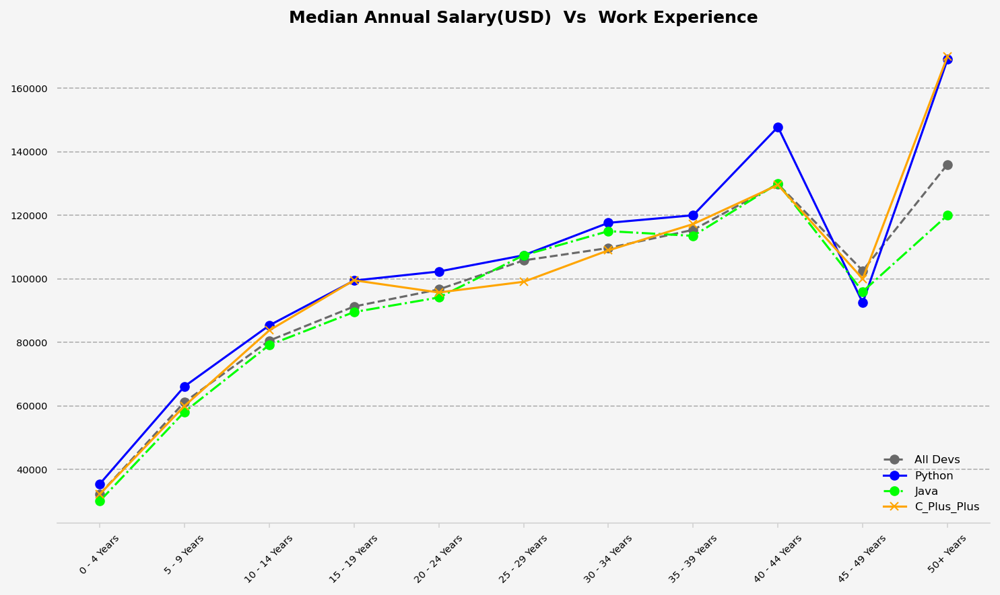

In [189]:
# Create figure and plot style
plt.style.use('seaborn-v0_8-bright')
plt.figure(figsize=(10,6), dpi=150, facecolor='whitesmoke')

# Plot the line graphs.
plt.plot(experience,all_devs_comp, color='dimgray', linestyle='--', marker='o', label='All Devs')
plt.plot(experience,python_comp, color='blue', linestyle='-', marker='o', label='Python')
plt.plot(experience,java_comp, color='lime', linestyle='-.', marker='o', label='Java')
plt.plot(experience,c_plus_plus_comp, color='orange', linestyle='-', marker='x', label='C_Plus_Plus')

# Remove borders.
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(False)

# Set the bottom border color to lightgrey.
plt.gca().spines['bottom'].set_color('lightgrey')

# Grey axes ticks.
plt.gca().tick_params(axis='x', colors='lightgrey')  # Change x-axis tick color
plt.gca().tick_params(axis='y', which='both', left=False, right=False)

# Set title(underlined) and axes ticks.
plt.title('Median Annual Salary(USD)  Vs  Work Experience', weight='bold', pad=8, color='black')
# plt.text(0.5, 1.05, 'Median Annual Salary (USD) Vs Work Experience', ha='center', va='center', fontsize=14, weight='bold', underline=True)
plt.yticks(fontsize=7, color='black')
plt.xticks(rotation=45, fontsize=7, color='black')

# Set legend location.
plt.legend(loc='lower right',frameon=False, labelcolor='black', fontsize=8)

plt.gca().set_facecolor('whitesmoke')

# Set grid style.
plt.grid(axis='y',linestyle='--')

# Ensure layout is adjusted properly.
plt.tight_layout()


### Analysis based on countries

In [190]:
# top_10_countries

data_frame = df
data_frame_columns = ['MainBranch', 'Country']
report_headers=[' ', 'No Respondents']

top_10_countries = get_response_count_with_percentages(data_frame, data_frame_columns, report_headers, category_filter='All Respondents').head(10)
top_10_countries.style.format("{:.2f}").bar(subset='% of No Respondents', cmap='tab20c')

,No Respondents,% of No Respondents
,,
United States of America,11095.00,18.83
Germany,4947.00,8.39
India,4231.00,7.18
United Kingdom of Great Britain and Northern Ireland,3224.00,5.47
Ukraine,2672.00,4.53
France,2110.00,3.58
Canada,2104.00,3.57
Poland,1534.00,2.60
Netherlands,1449.00,2.46


#### Median Annual Compensation in Top 10 Countries

In [191]:
# Median Annual salary for top 10 countries with highest respondents.

data_frame = df
data_frame_columns = ['Country', 'ConvertedCompYearly']
cou_comp_yr_df = make_data_frame(data_frame_columns, data_frame)
clean_cou_comp = clean_data(cou_comp_yr_df)
grouped_cou_comp = clean_cou_comp.groupby('Country', observed=False)['ConvertedCompYearly'].median().loc[top_10_countries.index]
grouped_cou_comp_df = grouped_cou_comp.to_frame(name='Median Annual Comp(USD)') #.sort_values(by='Median Annual Comp(USD)', ascending=False)


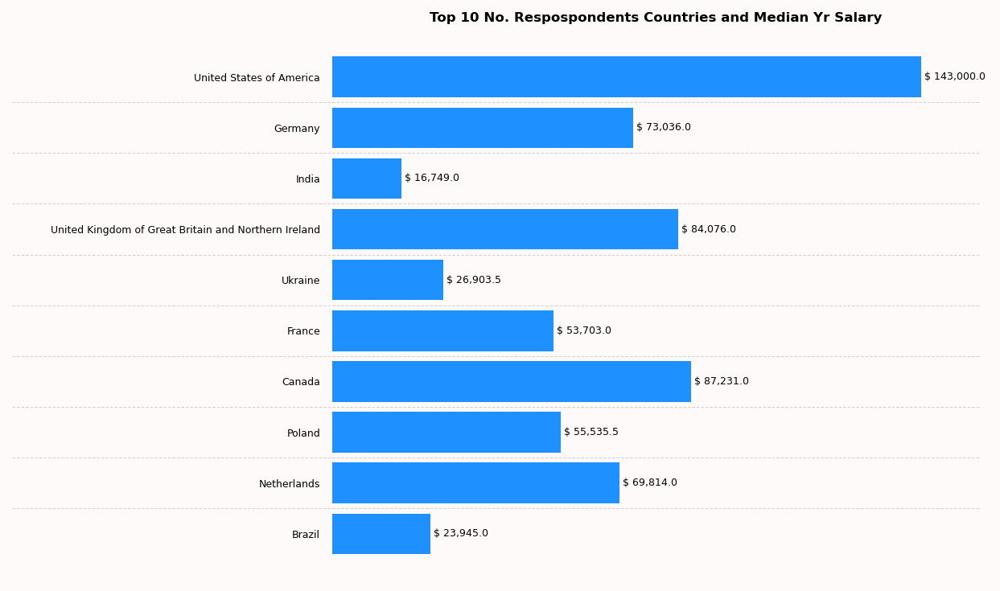

In [192]:
# Barh Median Annual salary for top 10 countries with highest respondents.

x_values= grouped_cou_comp_df.index[::-1]
y_values = grouped_cou_comp_df['Median Annual Comp(USD)'][::-1]
ch_title = 'Top 10 No. Respospondents Countries and Median Yr Salary'

create_custom_barh(x_values, y_values, ch_title, lab_txt_pre='$', figsize=(8,5))

#### Job Satisfaction Index Distribution

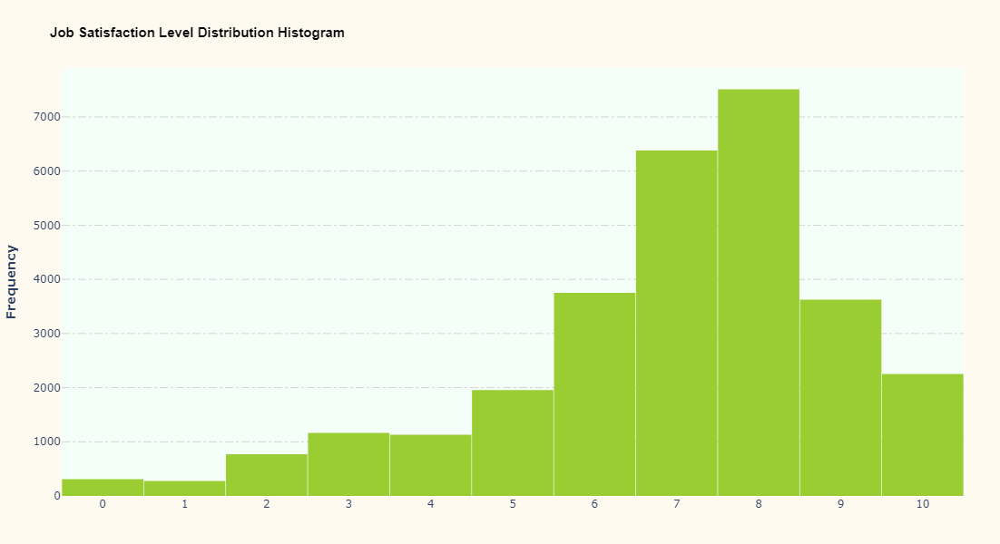

In [193]:
# Job Satisfaction distribution

x_values = df['JobSat']
fig = go.Figure(data=go.Histogram(x=x_values, marker_color="yellowgreen", 
                                  hovertemplate=('<i>Job Satisfaction</i>: %{x}<br><i>Frequency</i>: %{y}<extra></extra>' )
                                 ))
fig.update_layout(
    width=1100, height=600,
    margin=dict(t=75, b=20, l=30, r=40),
    bargap=0.0075,
    title=dict(
        text="Job Satisfaction Level Distribution Histogram",
        xanchor='left',
        x=0.05,
        yanchor='top',
        y=0.95,
        font=dict(size=15, color="black", family="sans-serif", weight="bold"),
    ),
    
)

fig.update_layout(paper_bgcolor='floralwhite', plot_bgcolor="mintcream",)

fig.update_layout(
    yaxis=dict(
        showgrid=True,           # Ensure that the grid is visible
        gridcolor='lightgray',    # Set the desired color for the horizontal grid lines
        gridwidth=1,              # Set the width of the grid lines
        griddash='dashdot'           # Make the grid lines dashed ('dash', 'dot', 'dashdot')
    )
)

fig.update_yaxes(title="<b>Frequency</b>", showticklabels=True)

fig.update_xaxes(
    title="",
    showticklabels=True,
    tickmode='linear',  # Set tick mode to linear to display all ticks
    tick0=0,            # Start ticks from 0
    dtick=1             # Set tick interval to 1 to show all numbers
)

fig.show()
